<a href="https://colab.research.google.com/github/Adonija-ZIO/Health-Application-Project/blob/main/image_classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## **Image Classification with deep learning  algorithm**

In [105]:
from google.colab import drive
drive.mount("/content/drive")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [106]:
!pip install keras-tuner --upgrade

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [107]:
import os, shutil, tarfile, requests

import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow import keras
from tensorboard import notebook
import keras.utils as image
from keras import backend as K
from keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.layers import AveragePooling2D
from tensorflow.keras.layers import GlobalAveragePooling2D
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import Activation
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Input
from tensorflow.keras.layers import Dense
from keras.utils.vis_utils import plot_model
from tensorflow.keras.models import Model

from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
import cv2
import timeit
from google.colab.patches import cv2_imshow
import math
from PIL import Image
from tqdm import tqdm
import matplotlib as mpl
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
mpl.rc('axes', labelsize=14)
mpl.rc('xtick', labelsize=12)
mpl.rc('ytick', labelsize=12)

keras.backend.clear_session()
np.random.seed(42)
tf.random.set_seed(42)


## Images preprocessing

Let's look an image of a dog

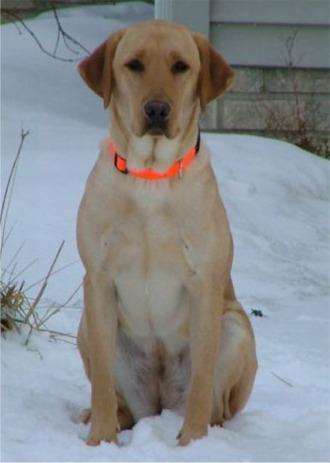

(463, 330, 3)

In [108]:
labrador = "/content/drive/MyDrive/Colab_Notebooks/data/Images/n02099712-Labrador_retriever/n02099712_8719.jpg"

dog = cv2.imread(labrador)
cv2_imshow(dog)
dog.shape
     


In [109]:
# Let's look at the classe number of dogs
image_path="/content/drive/MyDrive/Colab_Notebooks/data/Images/"
dog_cat = os.listdir(image_path)
print(len(dog_cat))
print(dog_cat)


120
['n02113023-Pembroke', 'n02113186-Cardigan', 'n02113624-toy_poodle', 'n02113712-miniature_poodle', 'n02113799-standard_poodle', 'n02113978-Mexican_hairless', 'n02115641-dingo', 'n02115913-dhole', 'n02116738-African_hunting_dog', 'n02089973-English_foxhound', 'n02091635-otterhound', 'n02105855-Shetland_sheepdog', 'n02108915-French_bulldog', 'n02085620-Chihuahua', 'n02085782-Japanese_spaniel', 'n02085936-Maltese_dog', 'n02086079-Pekinese', 'n02086240-Shih-Tzu', 'n02086646-Blenheim_spaniel', 'n02086910-papillon', 'n02087046-toy_terrier', 'n02087394-Rhodesian_ridgeback', 'n02088094-Afghan_hound', 'n02088238-basset', 'n02088364-beagle', 'n02088466-bloodhound', 'n02088632-bluetick', 'n02089078-black-and-tan_coonhound', 'n02089867-Walker_hound', 'n02090379-redbone', 'n02090622-borzoi', 'n02090721-Irish_wolfhound', 'n02091032-Italian_greyhound', 'n02091134-whippet', 'n02091244-Ibizan_hound', 'n02091467-Norwegian_elkhound', 'n02091831-Saluki', 'n02092002-Scottish_deerhound', 'n02092339-Weim

In [110]:
image_count = {}
data = []

for i , cat in tqdm(enumerate(dog_cat)):
    class_folder = os.path.join(image_path,cat)
    label = cat.split('-')[1]
    image_count[label] = []
    
    for path in os.listdir(os.path.join(class_folder)):
        image_count[label].append(label)
        data.append(['{}/{}'.format(cat, path), i, label])

120it [00:03, 39.03it/s]


In [111]:
#show image count
for key, value in image_count.items():
    print('{0} -> {1}'.format(key, len(value)))

Pembroke -> 181
Cardigan -> 155
toy_poodle -> 151
miniature_poodle -> 155
standard_poodle -> 159
Mexican_hairless -> 155
dingo -> 156
dhole -> 150
African_hunting_dog -> 169
English_foxhound -> 157
otterhound -> 151
Shetland_sheepdog -> 157
French_bulldog -> 159
Chihuahua -> 152
Japanese_spaniel -> 185
Maltese_dog -> 252
Pekinese -> 149
Shih -> 214
Blenheim_spaniel -> 188
papillon -> 196
toy_terrier -> 172
Rhodesian_ridgeback -> 172
Afghan_hound -> 239
basset -> 175
beagle -> 195
bloodhound -> 187
bluetick -> 171
black -> 159
Walker_hound -> 153
redbone -> 148
borzoi -> 151
Irish_wolfhound -> 218
Italian_greyhound -> 182
whippet -> 187
Ibizan_hound -> 188
Norwegian_elkhound -> 196
Saluki -> 200
Scottish_deerhound -> 232
Weimaraner -> 160
Staffordshire_bullterrier -> 155
American_Staffordshire_terrier -> 164
Bedlington_terrier -> 182
Border_terrier -> 172
Kerry_blue_terrier -> 179
Irish_terrier -> 169
Norfolk_terrier -> 172
Norwich_terrier -> 185
Yorkshire_terrier -> 164
wire -> 157
Lak

In [112]:
#create a dataframe
dog_df = pd.DataFrame(data, columns=['file', 'id', 'label'])
print(dog_df.shape)
dog_df.head()

(20580, 3)


,file,id,label
0,n02113023-Pembroke/n02113023_12192.jpg,0,Pembroke
1,n02113023-Pembroke/n02113023_11397.jpg,0,Pembroke
2,n02113023-Pembroke/n02113023_11091.jpg,0,Pembroke
3,n02113023-Pembroke/n02113023_1136.jpg,0,Pembroke
4,n02113023-Pembroke/n02113023_1144.jpg,0,Pembroke


# Image Preprocessing

### Image Transform

In [113]:
img = dog_df['file'][np.random.randint(400)]
lab = dog_df["label"][np.random.randint(400)]
print (img)
print(lab)

n02113023-Pembroke/n02113023_4024.jpg
toy_poodle


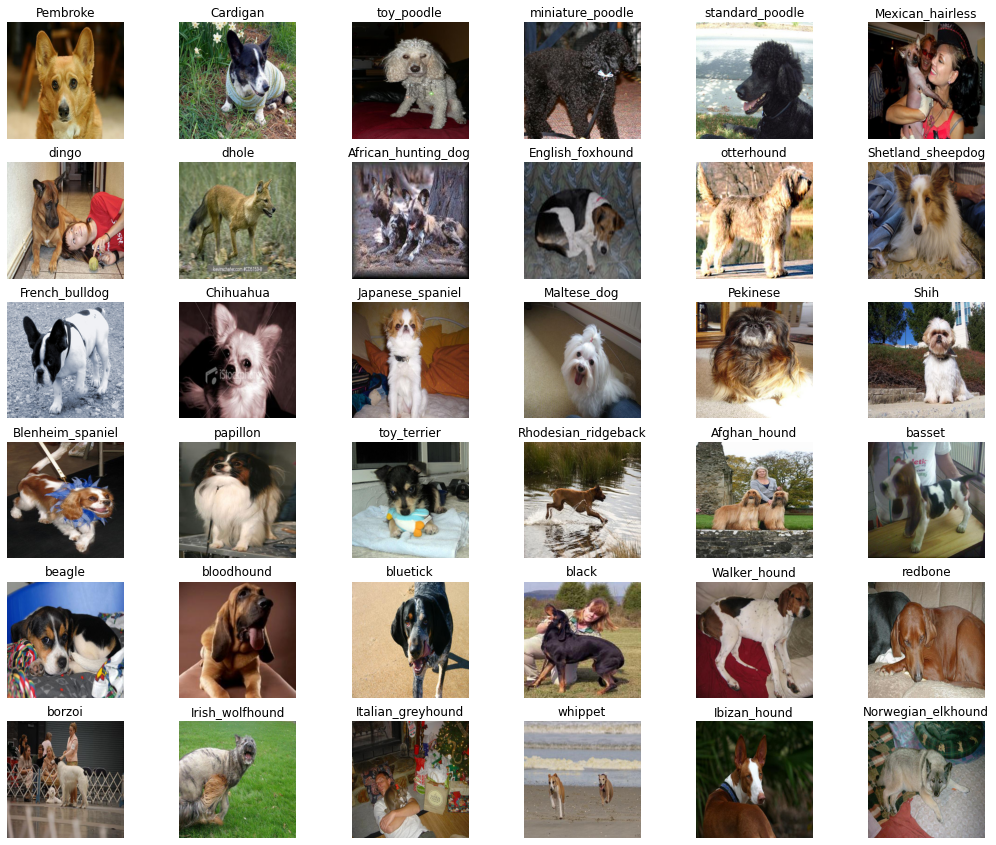

In [114]:
images = np.array([])
categories = np.array([])   
width, height = 224, 224
plt.figure(figsize=(18,15))
i = 1
for dog_path in dog_cat:
    dogs_image = os.listdir(image_path + dog_path)
    cat = dog_path.split('-')[1]
    j = 0
    for dog in dogs_image:
        dog_image = os.path.join(image_path, dog_path, dog)
        images = np.append(images, dog_image)
        categories = np.append(categories, cat)
        if i <= 36 and j == 0:
            img = Image.open(dog_image) 
            img_resized = img.resize((width, height))
            plt.subplot(6, 6, i)
            plt.axis('off')
            plt.title(cat)
            plt.imshow(img_resized)
            i = i + 1
            j = j + 1
plt.show()

In [115]:
def show_images_classes(directory_path, class_name, num_samples):
    """
    Display the first n images of a subdirectory under the given root directory.
    
    Parameters:
    directory_path (str): The path to the root directory containing the subdirectory with images.
    class_name (str): The name of the subdirectory with images.
    num_samples (int): The number of images to display.
    """
    fig, ax = plt.subplots(nrows=1, ncols=num_samples, figsize=(20, 5))
    fig.suptitle("{}".format(class_name.split("-")[1]), y=1.08, fontsize=16, fontweight='bold')
    fig.patch.set_facecolor('#F8F8FF')
    
    images = os.listdir(os.path.join(directory_path, class_name))[:num_samples]
    
    for i, image_name in enumerate(images):
        image_path = os.path.join(directory_path, class_name, image_name)
        image = mpimg.imread(image_path)
        ax[i].imshow(image)
        ax[i].axis('off')
        
    plt.show()

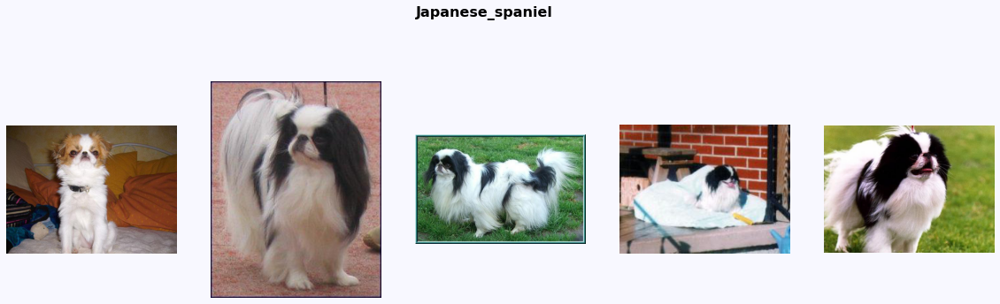

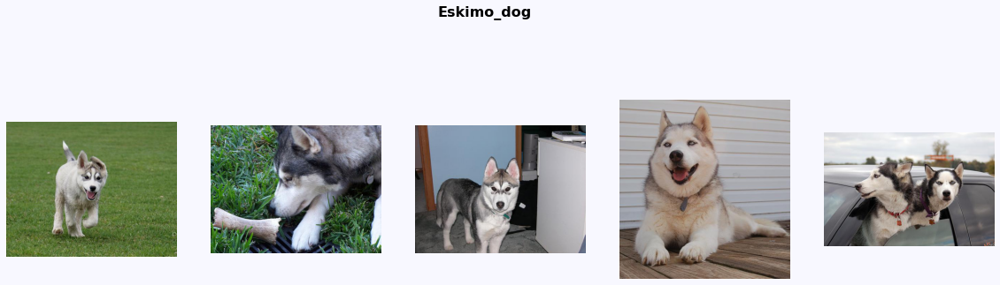

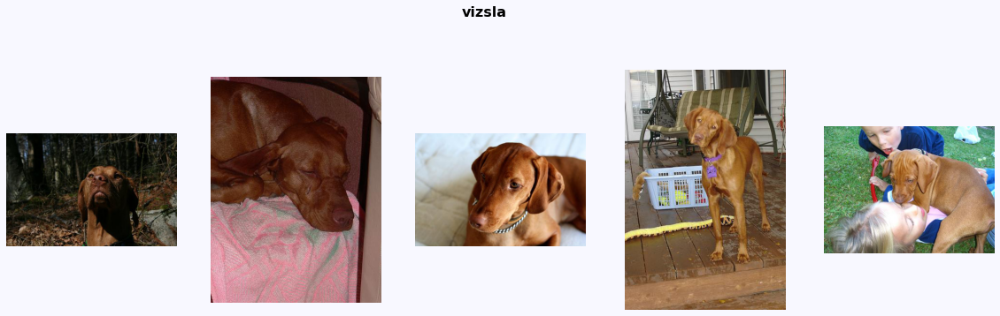

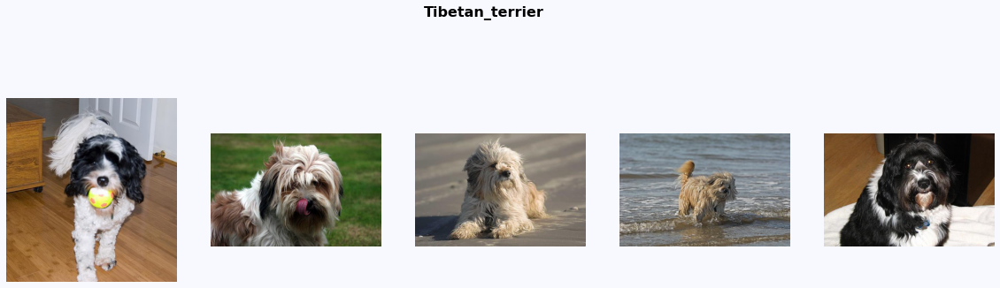

In [116]:
for i in np.random.randint(0, len(dog_cat), size=4):
    show_images_classes(image_path, dog_cat[i], 5)

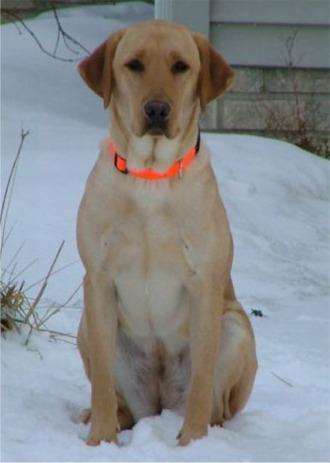

In [117]:
# Set desired dimensions for the resized image
height, width = 225, 225

# Load image using cv2.imread()
img_test = cv2.imread(labrador)
cv2_imshow(img_test)
# Resize image using cv2.resize()
resized_img = cv2.resize(img_test, (width, height), interpolation=cv2.INTER_LINEAR)


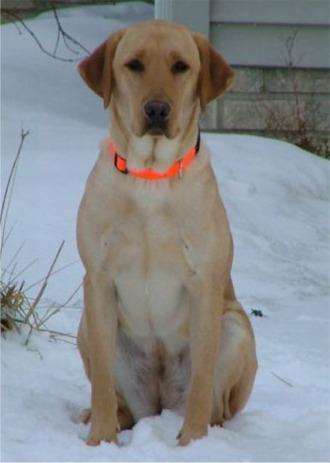

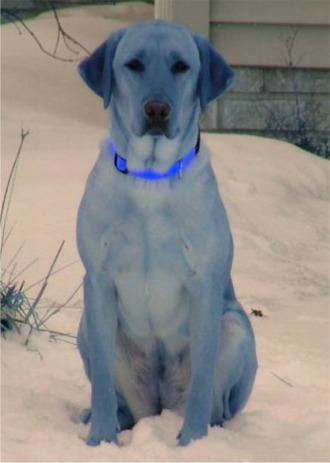

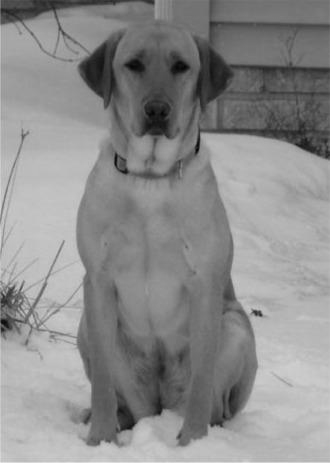

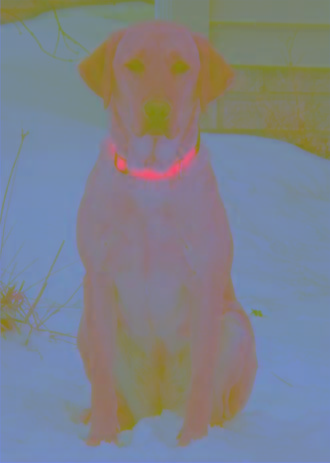

In [118]:
# Convert the image to RGB color space
img_RGB = cv2.cvtColor(img_test, cv2.COLOR_BGR2RGB)

# Convert the image to grayscale
img_grayscale = cv2.cvtColor(img_test, cv2.COLOR_RGB2GRAY)

# Convert the image to YUV color space
img_YUV = cv2.cvtColor(img_test, cv2.COLOR_BGR2YUV)


cv2_imshow(img_test)
cv2_imshow(img_RGB)
cv2_imshow(img_grayscale)
cv2_imshow(img_YUV)

cv2.waitKey(0)
cv2.destroyAllWindows()

      Original Image                 RGB Image                 Grayscale Image                 YUV Image


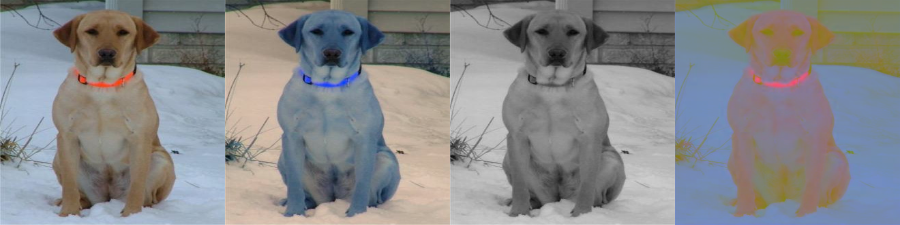

In [119]:
from google.colab.patches import cv2_imshow
resized_img = cv2.resize(img_test, (width, height), interpolation=cv2.INTER_LINEAR)


# Convert the image to RGB color space
img_RGB = cv2.cvtColor(resized_img, cv2.COLOR_BGR2RGB)


# Convert the image to grayscale
img_grayscale = cv2.cvtColor(resized_img, cv2.COLOR_RGB2GRAY)
img_grayscale = cv2.cvtColor(img_grayscale, cv2.COLOR_GRAY2RGB)

# Convert the image to YUV color space
img_YUV = cv2.cvtColor(resized_img, cv2.COLOR_BGR2YUV)
#img_YUV = cv2.cvtColor(resized_img, cv2.COLOR_YUV2RGB)

# Resize the images to the same size
#img_RGB = cv2.resize(img_RGB, (img_grayscale.shape[1], img_grayscale.shape[0]))
#img_YUV = cv2.resize(img_YUV, (img_grayscale.shape[1], img_grayscale.shape[0]))
#img_resized = cv2.resize(img_test, (img_grayscale.shape[1], img_grayscale.shape[0]))
# Concatenate the RGB, grayscale, and YUV images horizontally
img_concat = cv2.hconcat([resized_img, img_RGB, img_grayscale, img_YUV])

# Display the concatenated image using cv2_imshow
#cv2.imshow("Concatenated Images", img_concat)
print(" "*5, "Original Image"," "*15,  "RGB Image", " "*15, "Grayscale Image", " "*15, "YUV Image")
cv2_imshow(img_concat)



In [120]:
img_RGB

array([[[104, 109, 102],
        [ 78,  83,  76],
        [ 78,  84,  77],
        ...,
        [103, 117, 120],
        [103, 116, 120],
        [107, 120, 126]],

       [[104, 109, 102],
        [ 77,  82,  75],
        [ 78,  83,  76],
        ...,
        [100, 114, 117],
        [100, 114, 118],
        [105, 118, 124]],

       [[106, 108,  99],
        [ 76,  78,  69],
        [ 79,  81,  72],
        ...,
        [103, 116, 120],
        [103, 116, 120],
        [108, 121, 127]],

       ...,

       [[190, 205, 229],
        [177, 193, 217],
        [178, 193, 218],
        ...,
        [169, 183, 199],
        [169, 183, 199],
        [170, 185, 201]],

       [[188, 203, 225],
        [177, 192, 214],
        [179, 194, 216],
        ...,
        [166, 179, 195],
        [167, 180, 196],
        [170, 183, 199]],

       [[198, 213, 233],
        [189, 204, 224],
        [192, 208, 228],
        ...,
        [183, 195, 211],
        [182, 195, 211],
        [182, 195, 211]]

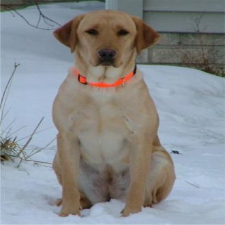

In [121]:
cv2_imshow(resized_img)

In [122]:
def plot_histogram(init_img, convert_img):
    """Plot the histograms for the initial and converted images.

    Args:
        init_img (tuple): Tuple containing the title and the initial OpenCV image.
        convert_img (tuple): Tuple containing the title and the converted OpenCV image.
    """
    # Compute the histograms
    init_hist, _ = np.histogram(init_img[1].copy().flatten(), 256, [0, 256])
    convert_hist, _ = np.histogram(convert_img[1].flatten(), 256, [0, 256])

    # Compute the cumulative distribution functions
    init_cdf = init_hist.cumsum()
    init_cdf_normalized = init_cdf * float(init_hist.max()) / init_cdf.max()
    convert_cdf = convert_hist.cumsum()
    convert_cdf_normalized = convert_cdf * float(convert_hist.max()) / convert_cdf.max()

    # Plot the histograms and cumulative distribution functions
    fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(25, 6))
    ax[0].imshow(init_img[1])
    ax[0].set_title(init_img[0], color="#343434")
    ax[1].imshow(convert_img[1])
    ax[1].set_title(convert_img[0], color="#343434")
    ax[2].plot(init_cdf_normalized, color='r', alpha=.7, linestyle='--')
    ax[2].plot(convert_cdf_normalized, color='b', alpha=.7, linestyle='--')
    ax[2].hist(init_img[1].flatten(), 256, [0, 256], color='r', alpha=.5)
    ax[2].hist(convert_img[1].flatten(), 256, [0, 256], color='b', alpha=.5)
    ax[2].set_xlim([0, 256])
    ax[2].legend(('Initial CDF', 'Converted CDF', 'Initial Histogram', 'Converted Histogram'), loc='upper left')
    ax[2].set_title('Histogram and Cumulative Distribution for Test Image', color="#343434")
    fig.suptitle("Histogram and Cumulative Distribution for Test Image", color="black", fontsize=22, y=.98)
    plt.show()
    print(init_img[1])

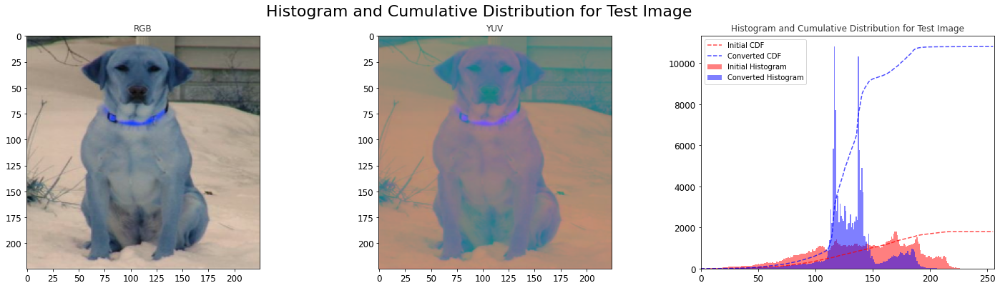

[[[102 109 104]
  [ 76  83  78]
  [ 77  84  78]
  ...
  [120 117 103]
  [120 116 103]
  [126 120 107]]

 [[102 109 104]
  [ 75  82  77]
  [ 76  83  78]
  ...
  [117 114 100]
  [118 114 100]
  [124 118 105]]

 [[ 99 108 106]
  [ 69  78  76]
  [ 72  81  79]
  ...
  [120 116 103]
  [120 116 103]
  [127 121 108]]

 ...

 [[229 205 190]
  [217 193 177]
  [218 193 178]
  ...
  [199 183 169]
  [199 183 169]
  [201 185 170]]

 [[225 203 188]
  [214 192 177]
  [216 194 179]
  ...
  [195 179 166]
  [196 180 167]
  [199 183 170]]

 [[233 213 198]
  [224 204 189]
  [228 208 192]
  ...
  [211 195 183]
  [211 195 182]
  [211 195 182]]]


In [123]:
plot_histogram(("RGB", resized_img), ("YUV", img_YUV))

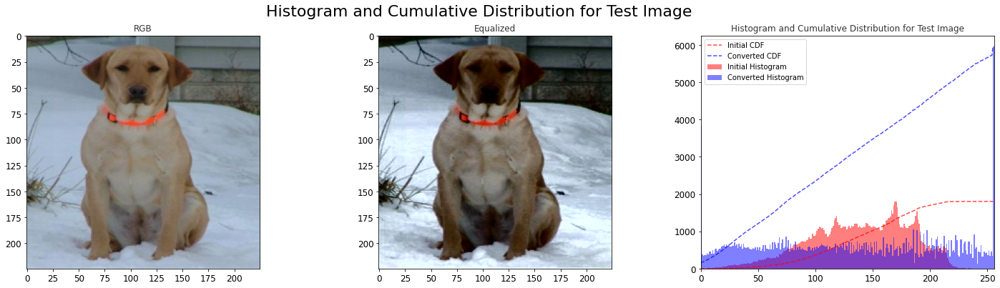

[[[104 109 102]
  [ 78  83  76]
  [ 78  84  77]
  ...
  [103 117 120]
  [103 116 120]
  [107 120 126]]

 [[104 109 102]
  [ 77  82  75]
  [ 78  83  76]
  ...
  [100 114 117]
  [100 114 118]
  [105 118 124]]

 [[106 108  99]
  [ 76  78  69]
  [ 79  81  72]
  ...
  [103 116 120]
  [103 116 120]
  [108 121 127]]

 ...

 [[190 205 229]
  [177 193 217]
  [178 193 218]
  ...
  [169 183 199]
  [169 183 199]
  [170 185 201]]

 [[188 203 225]
  [177 192 214]
  [179 194 216]
  ...
  [166 179 195]
  [167 180 196]
  [170 183 199]]

 [[198 213 233]
  [189 204 224]
  [192 208 228]
  ...
  [183 195 211]
  [182 195 211]
  [182 195 211]]]


In [124]:
#Equalize the Y channel of the YUV image

img_YUV[:,:,0] = cv2.equalizeHist(img_YUV[:,:,0])
#Convert the equalized YUV image to RGB format

img_equ = cv2.cvtColor(img_YUV, cv2.COLOR_YUV2RGB)
#Plot the initial RGB image and the equalized RGB image with histogram

plot_histogram(("RGB", img_RGB), ("Equalized", img_equ))


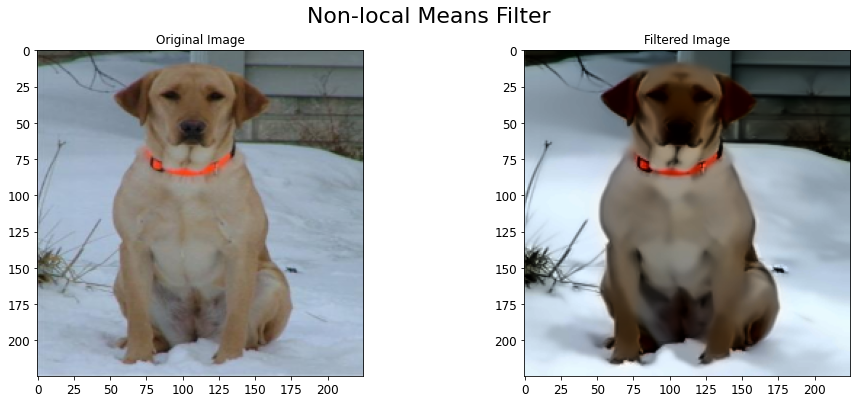

In [125]:
#Apply non-local means filter on test img

dst_img = cv2.fastNlMeansDenoisingColored(
src=img_equ,
dst=None,
h=10,
hColor=10,
templateWindowSize=7,
searchWindowSize=21)

#Show both img
fig = plt.figure(figsize=(16,6))
plt.subplot(1, 2, 1)
plt.imshow(img_RGB)
plt.title("Original Image")
plt.subplot(1, 2, 2)
plt.imshow(dst_img)
plt.title("Filtered Image")
plt.suptitle("Non-local Means Filter",
color="black",
fontsize=22, y=.98)
plt.show()

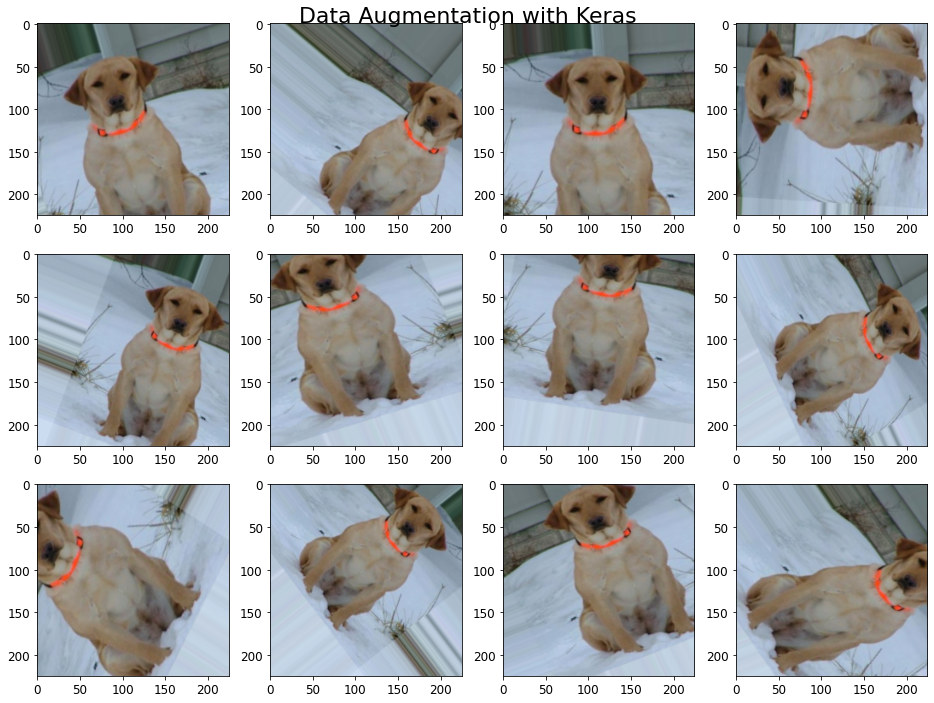

In [126]:
# Initialize Data Generator Keras
augmented_datagen = ImageDataGenerator(
    rotation_range=90,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest')

# Convert test img to array
x = image.img_to_array(img_RGB)
x = x.reshape((1,) + x.shape)

# Generate and show augmented images
i = 0
fig, axs = plt.subplots(3, 4, figsize=(16, 12))
for batch in augmented_datagen.flow(x, batch_size=1):
    axs[i // 4][i % 4].imshow(image.array_to_img(batch[0]))
    i += 1
    if i % 12 == 0:
        break

plt.suptitle("Data Augmentation with Keras",
             color="black", 
             fontsize=22, y=.90)
plt.show()

In [127]:

def preprocessing_cnn(directories, img_width, img_height):
    """
    Preprocessing of images in order to integrate them into a 
    convolutional neural network. This includes resizing, equalization,
    denoising, and conversion to arrays. Labels are created simultaneously.

    Parameters:
        directories (list): List of directories to be processed.
        img_width (int): Width of the image to be resized to.
        img_height (int): Height of the image to be resized to.
    
    Returns:
        Tuple: A tuple containing a list of preprocessed images and a list of labels.
    """
    img_list = []
    labels = []
    
    for index, cat in enumerate(directories):
        for image_name in os.listdir(image_path + "/" + cat):
            # Read image
            img = cv2.imread(image_path + "/" + cat + "/" + image_name)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

            # Resize image
            dim = (img_width, img_height)
            img = cv2.resize(img, dim, interpolation=cv2.INTER_LINEAR)

            # Equalization
            img_yuv = cv2.cvtColor(img, cv2.COLOR_BGR2YUV)
            img_yuv[:, :, 0] = cv2.equalizeHist(img_yuv[:, :, 0])
            img_equ = cv2.cvtColor(img_yuv, cv2.COLOR_YUV2RGB)

            # Apply non-local means filter
            dst_img = cv2.fastNlMeansDenoisingColored(
                src=img_equ,
                dst=None,
                h=10,
                hColor=10,
                templateWindowSize=7,
                searchWindowSize=21)

            # Convert image to array
            img_array = image.img_to_array(dst_img)

            # Append lists of labels and images
            img_list.append(np.array(img_array))
            labels.append(cat.split("-")[1])
    
    return img_list, labels

In [128]:
dog_cat

['n02113023-Pembroke',
 'n02113186-Cardigan',
 'n02113624-toy_poodle',
 'n02113712-miniature_poodle',
 'n02113799-standard_poodle',
 'n02113978-Mexican_hairless',
 'n02115641-dingo',
 'n02115913-dhole',
 'n02116738-African_hunting_dog',
 'n02089973-English_foxhound',
 'n02091635-otterhound',
 'n02105855-Shetland_sheepdog',
 'n02108915-French_bulldog',
 'n02085620-Chihuahua',
 'n02085782-Japanese_spaniel',
 'n02085936-Maltese_dog',
 'n02086079-Pekinese',
 'n02086240-Shih-Tzu',
 'n02086646-Blenheim_spaniel',
 'n02086910-papillon',
 'n02087046-toy_terrier',
 'n02087394-Rhodesian_ridgeback',
 'n02088094-Afghan_hound',
 'n02088238-basset',
 'n02088364-beagle',
 'n02088466-bloodhound',
 'n02088632-bluetick',
 'n02089078-black-and-tan_coonhound',
 'n02089867-Walker_hound',
 'n02090379-redbone',
 'n02090622-borzoi',
 'n02090721-Irish_wolfhound',
 'n02091032-Italian_greyhound',
 'n02091134-whippet',
 'n02091244-Ibizan_hound',
 'n02091467-Norwegian_elkhound',
 'n02091831-Saluki',
 'n02092002-Sco

In [129]:
classes = ['n02085620-Chihuahua',
 'n02085782-Japanese_spaniel',
 'n02108915-French_bulldog',
 'n02085620-Chihuahua']

In [130]:
device_name = tf.test.gpu_device_name()
if "GPU" not in device_name:
    print("GPU device not found")
print('Found GPU at: {}'.format(device_name))

Found GPU at: /device:GPU:0


In [131]:

# Define numbers of dog category to preprocess
cat_number = len(classes) 
# Execute preprocessor on selection
start_time = timeit.default_timer()

X, y = preprocessing_cnn(classes, 250, 250)
# Convert in numpy array
X = np.array(X)
y = np.array(y)
preprocess_time = timeit.default_timer() - start_time
print("-" * 50)
print("Execution time for preprocessing :")
print("-" * 50)
print("Number of images preprocessed : {}"\
     .format(len(y)))
print("Shape of images np.array : {}"\
     .format(X.shape))
print("Total time : {:.2f}s".format(preprocess_time))

--------------------------------------------------
Execution time for preprocessing :
--------------------------------------------------
Number of images preprocessed : 648
Shape of images np.array : (648, 250, 250, 3)
Total time : 135.70s


In [132]:
len(classes)

4

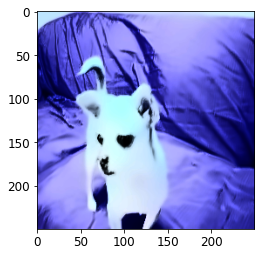

In [133]:
# Show exemple preprocessed image
plt.imshow(image.array_to_img(X[107]))

In [134]:
# Using np.shuffle
img_space = np.arange(X.shape[0])
np.random.seed(42)
# Shuffle the space
np.random.shuffle(img_space)
# Apply to X and y in same order
X = X[img_space]
y = y[img_space]

In [135]:
#Convert X to float32 data type
X = X.astype(np.float32)

# Encode y using LabelEncoder
label_encoder = LabelEncoder()
y =label_encoder.fit_transform(y)

In [136]:
# encoder classes
print(label_encoder.classes_)

['Chihuahua' 'French_bulldog' 'Japanese_spaniel']


In [137]:
### Create train and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)
# Split the train data into train and validation sets
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=42)

# Print the shapes of the train, validation and test sets
print("-" * 50)
print("Size of created sets :")
print("-" * 50)
print("X_train shape:", X_train.shape[0])
print("y_train shape:", y_train.shape[0])
print("X_val shape:", X_val.shape[0])
print("y_val shape:", y_val.shape[0])
print("X_test shape:", X_test.shape[0])
print("y_test shape:", y_test.shape[0])

input_shape=X_train.shape[1:]
print("input shape:", input_shape)

--------------------------------------------------
Size of created sets :
--------------------------------------------------
X_train shape: 414
y_train shape: 414
X_val shape: 104
y_val shape: 104
X_test shape: 130
y_test shape: 130
input shape: (250, 250, 3)


In [138]:
from keras.utils import to_categorical

y_train = to_categorical(y_train, cat_number)
y_val = to_categorical(y_val, cat_number)
y_test = to_categorical(y_test, cat_number)

In [139]:
# Define data augmentation and rescaling for train set
train_datagen = ImageDataGenerator(rescale=1./255,
                                   rotation_range=90,
                                   width_shift_range=0.2,
                                   height_shift_range=0.2,
                                   shear_range=0.2,
                                   zoom_range=0.2,
                                   horizontal_flip=True,
                                   fill_mode='nearest',
                                   validation_split=0.2)

# Define rescaling for validation and test sets
val_test_datagen  = ImageDataGenerator(rescale=1./255)

In [140]:
# Generate batches of augmented data for training set
train_generator = train_datagen.flow(X_train,
                                     y_train,
                                     batch_size=16,
                                     subset='training')
# Generate batches of augmented data for validation set
val_generator = val_test_datagen.flow(X_val,
                                      y_val,
                                      batch_size=16,
                                      shuffle=False)

# Generate batches of augmented data for test set
test_generator = val_test_datagen.flow(X_test,
                                       y_test,
                                       batch_size=16,
                                       shuffle=False)

# CNN

In [141]:
def recall_m(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    recall = true_positives / (possible_positives + K.epsilon())
    return recall

def precision_m(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + K.epsilon())
    return precision

def f1_m(y_true, y_pred):
    precision = precision_m(y_true, y_pred)
    recall = recall_m(y_true, y_pred)
    return 2*((precision*recall)/(precision+recall+K.epsilon()))

In [142]:
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense

def create_cnn(input_shape, num_classes):
    # Initialize the CNN
    model = Sequential()

    # Add the convolutional layer
    model.add(Conv2D(filters=32, kernel_size=(3,3), activation='relu', input_shape=input_shape))

    model.add(BatchNormalization(axis=3, scale=False))

    # Add the pooling layer
    model.add(MaxPooling2D(pool_size=(2,2)))

    # Add another convolutional layer
    model.add(Conv2D(filters=64, kernel_size=(3,3), activation='relu'))

    # Add another pooling layer
    model.add(MaxPooling2D(pool_size=(2,2)))

    # Flatten the output
    model.add(Flatten())

    # Add a fully-connected layer
    model.add(Dense(units=128, activation='relu'))

    # Add the output layer
    model.add(Dense(units=num_classes, activation='softmax'))

    # Compile the model
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

    return model

In [143]:

def cnn_model(input_shape, num_classes):
    model = tf.keras.models.Sequential([
        # Convolutional layer with 32 filters, kernel size of 3x3, and ReLU activation
        tf.keras.layers.Conv2D(32, (3,3), activation='relu', input_shape=input_shape),
        # Max pooling layer with pool size of 2x2
        tf.keras.layers.MaxPooling2D(pool_size=(2,2)),
        # Convolutional layer with 64 filters, kernel size of 3x3, and ReLU activation
        tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
        # Max pooling layer with pool size of 2x2
        tf.keras.layers.MaxPooling2D(pool_size=(2,2)),
        # Flatten layer to convert 2D features to 1D features
        tf.keras.layers.Flatten(),
        # Fully connected layer with 128 neurons and ReLU activation
        tf.keras.layers.Dense(128, activation='relu'),
        # Output layer with num_classes neurons and softmax activation
        tf.keras.layers.Dense(num_classes, activation='softmax')
    ])
    
    # Compile the model with categorical crossentropy loss and Adam optimizer
    model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
    
    return model

In [144]:

def create_cnn_model(input_shape, num_classes):
    # Define the CNN model architecture
    model = keras.Sequential()
    model.add(layers.Conv2D(32, kernel_size=(3, 3), activation="relu", input_shape=input_shape))
    model.add(layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(layers.Conv2D(64, kernel_size=(3, 3), activation="relu"))
    model.add(layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(layers.Flatten())
    model.add(layers.Dense(128, activation="relu"))
    model.add(layers.Dense(num_classes, activation="softmax"))

    # Compile the model with an optimizer, loss function, and metric
    model.compile(
        optimizer=keras.optimizers.Adam(),
        loss=keras.losses.categorical_crossentropy,
        metrics=["accuracy"],
    )

    return model

In [145]:

def build_cnn_model(input_shape, num_classes, conv_layers=3, dense_layers=2, filters=32, kernel_size=(3, 3), pool_size=(2, 2), activation='relu', dropout=0.5):
    """
    Builds a convolutional neural network model using the Keras library.

    Parameters:
        input_shape (tuple): Shape of input data.
        num_classes (int): Number of output classes.
        conv_layers (int): Number of convolutional layers to add.
        dense_layers (int): Number of dense layers to add.
        filters (int): Number of filters to use in each convolutional layer.
        kernel_size (tuple): Size of the convolutional kernel.
        pool_size (tuple): Size of the max pooling layer.
        activation (str): Activation function to use for the layers.
        dropout (float): Dropout rate for the dense layers.

    Returns:
        model (tensorflow.python.keras.engine.sequential.Sequential): CNN model.
    """
    model = keras.models.Sequential()

    # Add convolutional layers
    for i in range(conv_layers):
        if i == 0:
            model.add(keras.layers.Conv2D(filters, kernel_size, activation=activation, input_shape=input_shape))
        else:
            model.add(keras.layers.Conv2D(filters, kernel_size, activation=activation))
        model.add(keras.layers.MaxPooling2D(pool_size=pool_size))

    # Add dense layers
    model.add(keras.layers.Flatten())
    for i in range(dense_layers):
        model.add(keras.layers.Dense(128, activation=activation))
        model.add(keras.layers.Dropout(dropout))

    # Add output layer
    model.add(keras.layers.Dense(num_classes, activation='softmax'))

    return model

In [146]:
from tensorflow import keras

def build_cnn_model(input_shape, num_classes, conv_layers=3, dense_layers=2, filters=32, kernel_size=(3, 3), pool_size=(2, 2), activation='relu', dropout=0.5, normalization='batch'):
    """
    Builds a convolutional neural network model using the Keras library.

    Parameters:
        input_shape (tuple): Shape of input data.
        num_classes (int): Number of output classes.
        conv_layers (int): Number of convolutional layers to add.
        dense_layers (int): Number of dense layers to add.
        filters (int): Number of filters to use in each convolutional layer.
        kernel_size (tuple): Size of the convolutional kernel.
        pool_size (tuple): Size of the max pooling layer.
        activation (str): Activation function to use for the layers.
        dropout (float): Dropout rate for the dense layers.
        normalization (str): Type of normalization to use, either 'batch' or 'layer'.

    Returns:
        model (tensorflow.python.keras.engine.sequential.Sequential): CNN model.
    """
    model = keras.models.Sequential()

    # Add convolutional layers
    for i in range(conv_layers):
        if i == 0:
            model.add(keras.layers.Conv2D(filters,
                                          kernel_size, 
                                          padding='same',
                                          use_bias=False, 
                                          activation=activation, 
                                          input_shape=input_shape))
        else:
            model.add(keras.layers.Conv2D(filters,
                                          kernel_size, 
                                          padding='same',
                                          use_bias=False,
                                          activation=activation))
        
        if normalization == 'batch':
            model.add(keras.layers.BatchNormalization(axis=3, scale=False))
        elif normalization == 'layer':
            model.add(keras.layers.LayerNormalization(axis=3, scale=False))
            
        model.add(keras.layers.MaxPooling2D(pool_size=pool_size, strides=(4, 4), padding='same'))

    # Add dense layers
    model.add(keras.layers.Flatten())
    for i in range(dense_layers):
        model.add(keras.layers.Dense(128, activation=activation))
        
        if normalization == 'batch':
            model.add(keras.layers.BatchNormalization(axis=3, scale=False))
        elif normalization == 'layer':
            model.add(keras.layers.LayerNormalization(axis=3, scale=False))
        
        model.add(keras.layers.Dropout(dropout))

    # Add output layer
    model.add(keras.layers.Dense(num_classes, activation='softmax'))

    return model


In [ ]:
cnn=build_cnn_model(input_shape, cat_number, conv_layers=3, dense_layers=2, filters=16, kernel_size=(3, 3), pool_size=(2, 2), activation='relu', dropout=0.5, normalization='batch')

In [147]:
def build_cnn_model(input_shape, num_classes, conv_layers=3, dense_layers=2, filters=32, kernel_size=(3, 3), pool_size=(2, 2), activation='relu', dropout=0.5, normalization='batch'):
    """
    Builds a convolutional neural network model using the Keras library.

    Parameters:
        input_shape (tuple): Shape of input data.
        num_classes (int): Number of output classes.
        conv_layers (int): Number of convolutional layers to add.
        dense_layers (int): Number of dense layers to add.
        filters (int): Number of filters to use in each convolutional layer.
        kernel_size (tuple): Size of the convolutional kernel.
        pool_size (tuple): Size of the max pooling layer.
        activation (str): Activation function to use for the layers.
        dropout (float): Dropout rate for the dense layers.
        normalization (str): Type of normalization to use, either 'batch' or 'layer'.

    Returns:
        model (tensorflow.python.keras.engine.sequential.Sequential): CNN model.
    """
    model = keras.models.Sequential()

    # Add convolutional layers
    for i in range(conv_layers):
        if i == 0:
            model.add(keras.layers.Conv2D(filters,
                                          kernel_size, 
                                          padding='same',
                                          use_bias=False, 
                                          activation=activation, 
                                          input_shape=input_shape))
        else:
            model.add(keras.layers.Conv2D(filters,
                                          kernel_size, 
                                          activation=activation))
        
        if normalization == 'batch':
            model.add(keras.layers.BatchNormalization(axis=-1, scale=False))
        elif normalization == 'layer':
            model.add(keras.layers.LayerNormalization(axis=-1, scale=False))
            
        model.add(keras.layers.MaxPooling2D(pool_size=pool_size, strides=(4, 4), padding='same'))

    # Add dense layers
    model.add(keras.layers.Flatten())
    for i in range(dense_layers):
        model.add(keras.layers.Dense(128, activation=activation))
        
        if normalization == 'batch':
            model.add(keras.layers.BatchNormalization(axis=-1, scale=False))
        elif normalization == 'layer':
            model.add(keras.layers.LayerNormalization(axis=-1, scale=False))
        
        model.add(keras.layers.Dropout(dropout))

    # Add output layer
    model.add(keras.layers.Dense(num_classes, activation='softmax'))

    return model


In [148]:
from tensorflow import keras

def build_cnn_model(input_shape, num_classes, conv_layers=3, dense_layers=2, filters_1=16, filters_2=32, filters_3=64, kernel_size=(3, 3), pool_size=(2, 2), activation='relu', dropout=0.5, normalization='batch'):
    """
    Builds a convolutional neural network model using the Keras library.

    Parameters:
        input_shape (tuple): Shape of input data.
        num_classes (int): Number of output classes.
        conv_layers (int): Number of convolutional layers to add.
        dense_layers (int): Number of dense layers to add.
        filters_1 (int): Number of filters to use in the first convolutional layer.
        filters_2 (int): Number of filters to use in the second convolutional layer.
        filters_3 (int): Number of filters to use in the third convolutional layer.
        kernel_size (tuple): Size of the convolutional kernel.
        pool_size (tuple): Size of the max pooling layer.
        activation (str): Activation function to use for the layers.
        dropout (float): Dropout rate for the dense layers.
        normalization (str): Type of normalization to use, either 'batch' or 'layer'.

    Returns:
        model (tensorflow.python.keras.engine.sequential.Sequential): CNN model.
    """
    model = keras.models.Sequential()

    # Add convolutional layers
    for i in range(conv_layers):
        if i == 0:
            model.add(keras.layers.Conv2D(filters_1,
                                          kernel_size, 
                                          padding='same',
                                          use_bias=False, 
                                          activation=activation, 
                                          input_shape=input_shape))
        elif i == 1:
            model.add(keras.layers.Conv2D(filters_2,
                                          kernel_size, 
                                          padding='same',
                                          use_bias=False, 
                                          activation=activation))
        elif i == 2:
            model.add(keras.layers.Conv2D(filters_3,
                                          kernel_size, 
                                          padding='same',
                                          use_bias=False, 
                                          activation=activation))
        else:
          model.add(keras.layers.Conv2D(filters_3,
                                          kernel_size, 
                                          padding='same',
                                          use_bias=False, 
                                          activation=activation))        
        if normalization == 'batch':
            model.add(keras.layers.BatchNormalization(axis=-1, scale=False))
        elif normalization == 'layer':
            model.add(keras.layers.LayerNormalization(axis=-1, scale=False))
            
        model.add(keras.layers.MaxPooling2D(pool_size=pool_size, strides=(4, 4), padding='same'))

    # Add dense layers
    model.add(keras.layers.Flatten())
    for i in range(dense_layers):
        model.add(keras.layers.Dense(128, activation=activation))
        
        if normalization == 'batch':
            model.add(keras.layers.BatchNormalization(axis=-1, scale=False))
        elif normalization == 'layer':
            model.add(keras.layers.LayerNormalization(axis=-1, scale=False))
        
        model.add(keras.layers.Dropout(dropout))

    # Add output layer
    model.add(keras.layers.Dense(num_classes, activation='softmax'))

    return model


In [149]:
cnn=build_cnn_model(input_shape, cat_number, conv_layers=2, dense_layers=2, filters_1=16, filters_2=32, filters_3=64, kernel_size=(3, 3), pool_size=(2, 2), activation='relu', dropout=0.5, normalization='batch')

In [150]:
def build_cnn_model(input_shape, num_classes, conv_layers=3, dense_layers=2, filters=(16, 32, 64), kernel_size=(3, 3), pool_size=(2, 2), activation='relu', dropout=0.5, normalization='batch'):
    """
    Builds a convolutional neural network model using the Keras library.

    Parameters:
        input_shape (tuple): Shape of input data.
        num_classes (int): Number of output classes.
        conv_layers (int): Number of convolutional layers to add.
        dense_layers (int): Number of dense layers to add.
        filters (tuple): Number of filters to use in each convolutional layer.
        kernel_size (tuple): Size of the convolutional kernel.
        pool_size (tuple): Size of the max pooling layer.
        activation (str): Activation function to use for the layers.
        dropout (float): Dropout rate for the dense layers.
        normalization (str): Type of normalization to use, either 'batch' or 'layer'.

    Returns:
        model (tensorflow.python.keras.engine.sequential.Sequential): CNN model.
    """
    model = keras.models.Sequential()

    # Add convolutional layers
    for i in range(conv_layers):
        model.add(keras.layers.Conv2D(filters[i],
                                      kernel_size, 
                                      padding='same',
                                      use_bias=False, 
                                      activation=activation, 
                                      input_shape=input_shape))
        if normalization == 'batch':
            model.add(keras.layers.BatchNormalization())
        elif normalization == 'layer':
            model.add(keras.layers.LayerNormalization())

        model.add(keras.layers.MaxPooling2D(pool_size=pool_size, strides=(4, 4), padding='same'))

    # Add dense layers
    model.add(keras.layers.Flatten())
    for i in range(dense_layers):
        model.add(keras.layers.Dense(128, activation=activation))
        if normalization == 'batch':
            model.add(keras.layers.BatchNormalization())
        elif normalization == 'layer':
            model.add(keras.layers.LayerNormalization())
        model.add(keras.layers.Dropout(dropout))
    
    # Add Global Average Pooling and output layer
    model.add(keras.layers.GlobalAveragePooling2D())
    model.add(keras.layers.Dense(num_classes, activation='softmax'))
    
    return model

In [151]:
def build_cnn_model(input_shape, num_classes, conv_layers=3, dense_layers=2, filters=(16, 32, 32), kernel_size=(3, 3), pool_size=(2, 2), activation='relu', dropout=0.5, normalization='batch'):
    """
    Builds a convolutional neural network model using the Keras library.

    Parameters:
        input_shape (tuple): Shape of input data.
        num_classes (int): Number of output classes.
        conv_layers (int): Number of convolutional layers to add.
        dense_layers (int): Number of dense layers to add.
        filters (tuple): Number of filters to use in each convolutional layer.
        kernel_size (tuple): Size of the convolutional kernel.
        pool_size (tuple): Size of the max pooling layer.
        activation (str): Activation function to use for the layers.
        dropout (float): Dropout rate for the dense layers.
        normalization (str): Type of normalization to use, either 'batch' or 'layer'.

    Returns:
        model (tensorflow.python.keras.engine.sequential.Sequential): CNN model.
    """
    model = keras.models.Sequential()

    # Add convolutional layers
    for i in range(conv_layers):
        model.add(keras.layers.Conv2D(filters[i],
                                      kernel_size, 
                                      padding='same',
                                      use_bias=False, 
                                      activation=activation, 
                                      input_shape=input_shape))
        if normalization == 'batch':
            model.add(keras.layers.BatchNormalization())
        elif normalization == 'layer':
            model.add(keras.layers.LayerNormalization())

        model.add(keras.layers.MaxPooling2D(pool_size=pool_size, strides=(4, 4), padding='same'))
        print(f'Output shape after conv layer {i}: {model.output_shape}')

    # Add dense layers
    #print(f'Output shape after flatten layer: {model.output_shape}')
    for i in range(dense_layers):
        model.add(keras.layers.Dense(128, activation=activation))
 
    model.add(keras.layers.Dropout(dropout))
    print(f'Output shape after dense layer {i}: {model.output_shape}')
    
    # Add global average pooling layer
    model.add(keras.layers.GlobalAveragePooling2D())
    print(f'Output shape after global average pooling layer: {model.output_shape}')

    # Output layer
    model.add(keras.layers.Dense(num_classes, activation='softmax'))
    print(f'Output shape after output layer: {model.output_shape}')

    return model


In [152]:
cnn=build_cnn_model(input_shape, cat_number, conv_layers=2, dense_layers=2, filters=(32,64, 128), kernel_size=(3, 3), pool_size=(4, 4), activation='relu', dropout=0.5, normalization='batch')

Output shape after conv layer 0: (None, 63, 63, 32)
Output shape after conv layer 1: (None, 16, 16, 64)
Output shape after dense layer 1: (None, 16, 16, 128)
Output shape after global average pooling layer: (None, 128)
Output shape after output layer: (None, 4)


In [153]:
cnn.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_2 (Conv2D)           (None, 250, 250, 32)      864       
                                                                 
 batch_normalization_4 (Batc  (None, 250, 250, 32)     128       
 hNormalization)                                                 
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 63, 63, 32)       0         
 2D)                                                             
                                                                 
 conv2d_3 (Conv2D)           (None, 63, 63, 64)        18432     
                                                                 
 batch_normalization_5 (Batc  (None, 63, 63, 64)       256       
 hNormalization)                                                 
                                                      

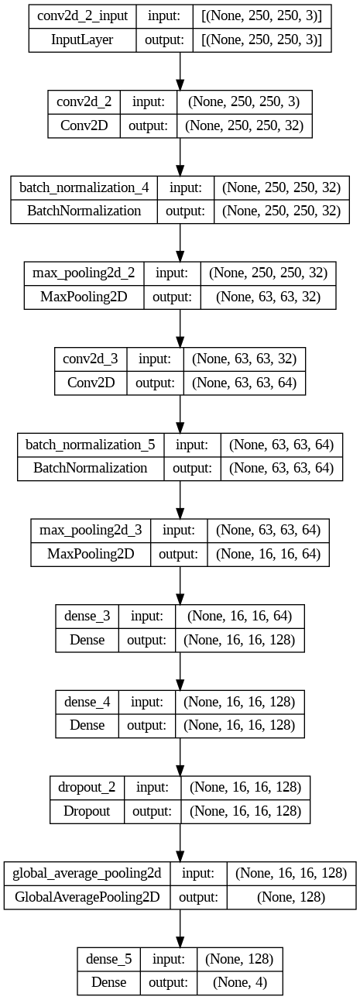

In [154]:
plot_model(cnn, to_file='CNN_model_plot.png', 
           show_shapes=True, show_layer_names=True)

In [155]:
cnn.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

In [156]:
import math
history = cnn.fit(
    train_generator,
    validation_data=val_generator,
    steps_per_epoch=math.ceil(len(train_generator) / 32),
    epochs=20,
    verbose=2)

Epoch 1/20
1/1 - 3s - loss: 1.2231 - accuracy: 0.3750 - val_loss: 1.3823 - val_accuracy: 0.1731 - 3s/epoch - 3s/step
Epoch 2/20
1/1 - 1s - loss: 1.3396 - accuracy: 0.2500 - val_loss: 1.3720 - val_accuracy: 0.1731 - 748ms/epoch - 748ms/step
Epoch 3/20
1/1 - 1s - loss: 1.1358 - accuracy: 0.4375 - val_loss: 1.3571 - val_accuracy: 0.1827 - 730ms/epoch - 730ms/step
Epoch 4/20
1/1 - 0s - loss: 1.1398 - accuracy: 0.3750 - val_loss: 1.3485 - val_accuracy: 0.1827 - 450ms/epoch - 450ms/step
Epoch 5/20
1/1 - 0s - loss: 1.4250 - accuracy: 0.1875 - val_loss: 1.3475 - val_accuracy: 0.1731 - 412ms/epoch - 412ms/step
Epoch 6/20
1/1 - 0s - loss: 1.0907 - accuracy: 0.3750 - val_loss: 1.3471 - val_accuracy: 0.1731 - 417ms/epoch - 417ms/step
Epoch 7/20
1/1 - 0s - loss: 1.0361 - accuracy: 0.6250 - val_loss: 1.3476 - val_accuracy: 0.1731 - 420ms/epoch - 420ms/step
Epoch 8/20
1/1 - 0s - loss: 1.0751 - accuracy: 0.3125 - val_loss: 1.3458 - val_accuracy: 0.1731 - 410ms/epoch - 410ms/step
Epoch 9/20
1/1 - 0s - 

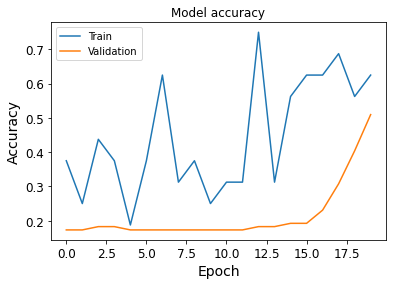

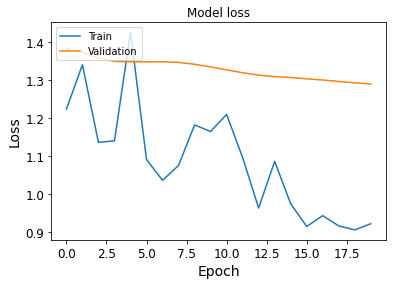

In [157]:
# Plot training & validation accuracy values
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

In [158]:
cnn_layer=build_cnn_model(input_shape, cat_number, conv_layers=3, dense_layers=2, filters=(32,64, 128), kernel_size=(3, 3), pool_size=(4, 4), activation='relu', dropout=0.5, normalization='layer')

cnn_layer.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

history_layer = cnn_layer.fit(
    train_generator,
    validation_data=val_generator,
    steps_per_epoch=math.ceil(len(train_generator) / 32),
    epochs=20,
    verbose=2)


Output shape after conv layer 0: (None, 63, 63, 32)
Output shape after conv layer 1: (None, 16, 16, 64)
Output shape after conv layer 2: (None, 4, 4, 128)
Output shape after dense layer 1: (None, 4, 4, 128)
Output shape after global average pooling layer: (None, 128)
Output shape after output layer: (None, 4)
Epoch 1/20
1/1 - 4s - loss: 2.1349 - accuracy: 0.0000e+00 - val_loss: 1.2067 - val_accuracy: 0.5288 - 4s/epoch - 4s/step
Epoch 2/20
1/1 - 1s - loss: 1.5882 - accuracy: 0.3125 - val_loss: 1.0876 - val_accuracy: 0.4712 - 930ms/epoch - 930ms/step
Epoch 3/20
1/1 - 1s - loss: 1.0211 - accuracy: 0.6250 - val_loss: 1.1295 - val_accuracy: 0.3269 - 1s/epoch - 1s/step
Epoch 4/20
1/1 - 1s - loss: 1.1308 - accuracy: 0.4375 - val_loss: 1.0640 - val_accuracy: 0.4519 - 733ms/epoch - 733ms/step
Epoch 5/20
1/1 - 1s - loss: 1.0072 - accuracy: 0.6250 - val_loss: 1.0155 - val_accuracy: 0.5288 - 727ms/epoch - 727ms/step
Epoch 6/20
1/1 - 1s - loss: 1.0748 - accuracy: 0.3750 - val_loss: 1.0258 - val_acc

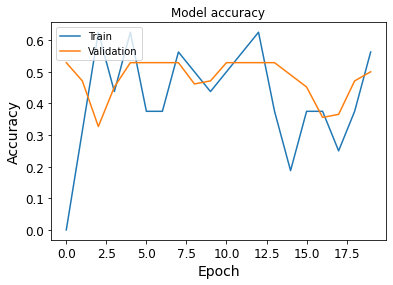

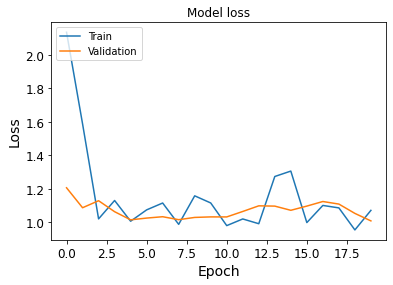

In [159]:
# Plot training & validation accuracy values
plt.plot(history_layer.history['accuracy'])
plt.plot(history_layer.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.plot(history_layer.history['loss'])
plt.plot(history_layer.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()


In [2]:
import tensorflow.keras as keras
import tensorflow.keras.layers as layers
import kerastuner as kt

def fine_tune_model(hp):
    model = keras.models.Sequential()

    # Add convolutional layers
    for i in range(hp.Int('conv_layers', 1, 10)):
        model.add(layers.Conv2D(hp.Choice(f'filters_{i}', values=[16, 32, 64]),
                                hp.Choice(f'kernel_size_{i}', values=[3, 5, 7]),
                                padding='same',
                                activation=hp.Choice(f'activation_{i}', values=['relu', 'tanh', 'sigmoid']),
                                input_shape=input_shape))
        if hp.Choice('normalization', values=['batch', 'layer']) == 'batch':
            model.add(layers.BatchNormalization())
        else:
            model.add(layers.LayerNormalization())

        model.add(layers.MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

    # Add dense layers
    model.add(layers.Flatten())
    for i in range(hp.Int('dense_layers', 1, 3)):
        model.add(layers.Dense(units=hp.Int(f'units_{i}', min_value=32, max_value=512, step=32),
                               activation=hp.Choice(f'activation_dense_{i}', values=['relu', 'tanh', 'sigmoid'])))
        model.add(layers.Dropout(hp.Float(f'dropout_{i}', min_value=0.0, max_value=0.5, step=0.1)))

    # Output layer
    model.add(layers.Dense(cat_number, activation='softmax'))

    # Compile model
    model.compile(optimizer=keras.optimizers.Adam(learning_rate=hp.Choice('learning_rate', values=[0.001, 0.01])),
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])

    return model

<ipython-input-2-98377f9621bf>:3: DeprecationWarning: `import kerastuner` is deprecated, please use `import keras_tuner`.
  import kerastuner as kt


In [3]:
tuner = kt.Hyperband(fine_tune_model,
                     objective='val_accuracy',
                     max_epochs=10,
                     factor=3,
                     directory='fine_tune',
                     project_name='hyperband_fine_tune')

tuner.search(train_generator, epochs=10, validation_data=val_generator)


NameError: ignored

In [ ]:
# Get best model and print summary
best_model = tuner.get_best_models(num_models=1)[0]
best_model.summary()

In [ ]:
best_model.fit(train_generator,
               epochs=20,
               validation_data=val_generator)

In [ ]:
from kerastuner import RandomSearch
from kerastuner.engine.hyperparameters import HyperParameters

# Define hyperparameters search space
hp = HyperParameters()
hp.Int('conv_layers', 1, 10, default=3)
hp.Int('dense_layers', 1, 3, default=1)
hp.Choice('normalization', values=['batch', 'layer'], default='batch')
for i in range(10):
    hp.Int(f'filters_{i}', 16, 64, step=16, default=32)
    hp.Choice(f'kernel_size_{i}', values=[3, 5, 7], default=3)
    hp.Choice(f'activation_{i}', values=['relu', 'tanh', 'sigmoid'], default='relu')
for i in range(3):
    hp.Int(f'units_{i}', 16, 512, step=16, default=128)
    hp.Choice(f'activation_dense_{i}', values=['relu', 'tanh', 'sigmoid'], default='relu')
    hp.Float(f'dropout_{i}', 0.0, 0.5, step=0.1, default=0.25)
hp.Choice('learning_rate', values=[0.001, 0.01], default=0.001)

# Define model builder function
def build_model(hp):
    model = keras.models.Sequential()

    # Add convolutional layers
    for i in range(hp.get('conv_layers')):
        model.add(layers.Conv2D(hp.get(f'filters_{i}'),
                                hp.get(f'kernel_size_{i}'),
                                padding='same',
                                activation=hp.get(f'activation_{i}'),
                                input_shape=input_shape))
        if hp.get('normalization') == 'batch':
            model.add(layers.BatchNormalization())
        else:
            model.add(layers.LayerNormalization())

        model.add(layers.MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

    # Add dense layers
    model.add(layers.Flatten())
    for i in range(hp.get('dense_layers')):
        model.add(layers.Dense(units=hp.get(f'units_{i}'),
                               activation=hp.get(f'activation_dense_{i}')))
        model.add(layers.Dropout(hp.get(f'dropout_{i}')))

    # Output layer
    model.add(layers.Dense(cat_number, activation='softmax'))

    # Compile model
    model.compile(optimizer=keras.optimizers.Adam(learning_rate=hp.get('learning_rate')),
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])

    return model



In [ ]:
# Define tuner and start search
tuner = RandomSearch(build_model, objective='val_accuracy', max_trials=20, hyperparameters=hp)
tuner.search(train_generator, epochs=10, validation_data=val_generator)


In [ ]:
# Get best model and print summary
best_model = tuner.get_best_models(num_models=1)[0]
best_model.summary()

In [ ]:
best_model.fit(train_generator,
               epochs=20,
               validation_data=val_generator)

In [ ]:
import tensorflow.keras as keras
from tensorflow.keras import layers
from kerastuner import RandomSearch
from kerastuner.engine.hyperparameters import HyperParameters
import numpy as np

# Set random seed for reproducibility
np.random.seed(42)

def fine_tune_model(hp):
    model = keras.models.Sequential()

    # Add convolutional layers
    for i in range(hp.Int('conv_layers', 1, 10)):
        model.add(layers.Conv2D(hp.Choice(f'filters_{i}', values=[16, 32, 64]),
                                hp.Choice(f'kernel_size_{i}', values=[3, 5, 7]),
                                padding='same',
                                activation=hp.Choice(f'activation_{i}', values=['relu', 'tanh', 'sigmoid']),
                                input_shape=input_shape))
        if hp.Choice('normalization', values=['batch', 'layer']) == 'batch':
            model.add(layers.BatchNormalization())
        else:
            model.add(layers.LayerNormalization())

        model.add(layers.MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

    # Add dense layers
    model.add(layers.Flatten())
    for i in range(hp.Int('dense_layers', 1, 3)):
        model.add(layers.Dense(units=hp.Int(f'units_{i}', min_value=16, max_value=512, step=16),
                               activation=hp.Choice(f'activation_dense_{i}', values=['relu', 'tanh', 'sigmoid'])))
        model.add(layers.Dropout(hp.Float(f'dropout_{i}', min_value=0.0, max_value=0.5, step=0.1)))

    # Output layer
    model.add(layers.Dense(cat_number, activation='softmax'))

    # Compile model
    model.compile(optimizer=keras.optimizers.Adam(learning_rate=hp.Choice('learning_rate', values=[0.001, 0.01])),
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])

    return model



In [ ]:
tuner = RandomSearch(
    fine_tune_model,
    objective='val_accuracy',
    max_trials=10,
    seed=42,  # set random seed
    directory='my_dir',
    project_name='cats_vs_dogs'
)

tuner.search(train_generator,
             epochs=10,
             validation_data=val_generator)

In [ ]:
# Get best model and print summary
best_model = tuner.get_best_models(num_models=1)[0]
best_model.summary()

In [ ]:
random_best_model.fit(train_generator,
               epochs=20,
               validation_data=val_generator)

In [ ]:
best_hyperparams = tuner.get_best_hyperparameters(num_trials=1)[0]

print("Best Hyperparameters:")
print(f"Number of Conv Layers: {best_hyperparams.get('conv_layers')}")
print(f"Number of Dense Layers: {best_hyperparams.get('dense_layers')}")
print(f"Filters: {best_hyperparams.get('filters')}")
print(f"Kernel Size: {best_hyperparams.get('kernel_size')}")
print(f"Pool Size: {best_hyperparams.get('pool_size')}")
print(f"Activation Function: {best_hyperparams.get('activation')}")
print(f"Dropout Rate: {best_hyperparams.get('dropout')}")
print(f"Normalization: {best_hyperparams.get('normalization')}")


Best Hyperparameters:
Number of Conv Layers: 2
Number of Dense Layers: 1


KeyError: ignored

In [ ]:
best_hyperparams = tuner.get_best_hyperparameters(num_trials=1)[0]

print("Best Hyperparameters:")
print(f"Number of Conv Layers: {best_hyperparams.get('conv_layers')}")
print(f"Number of Dense Layers: {best_hyperparams.get('dense_layers')}")
print(f"Filters: {best_hyperparams.get('filters')}")
#print(f"Kernel Size: {best_hyperparams.get('kernel_size')}")
#print(f"Pool Size: {best_hyperparams.get('pool_size')}")
#print(f"Activation Function: {best_hyperparams.get('activation')}")
#print(f"Dropout Rate: {best_hyperparams.get('dropout')}")
print(f"Normalization: {best_hyperparams.get('normalization')}")


Best Hyperparameters:
Number of Conv Layers: 2
Number of Dense Layers: 1


KeyError: ignored

In [ ]:
best_hyperparams.get("conv_layers")

2

In [ ]:
def fine_tune_model(hp):
    input_shape = input_shape
    num_classes = cat_number

    conv_layers = hp.Int('conv_layers', min_value=1, max_value=3, step=1)
    dense_layers = hp.Int('dense_layers', min_value=1, max_value=2, step=1)

    filters = []
    for i in range(conv_layers):
        filters.append(hp.Choice(f'filters_{i}', values=[16, 32, 64]))

    kernel_size = hp.Choice('kernel_size', values=[(3, 3), (5, 5), (7, 7)])
    pool_size = hp.Choice('pool_size', values=[(2, 2), (3, 3), (4, 4)])

    activation = 'relu'
    dropout = 0.5
    normalization = hp.Choice('normalization', values=['batch', 'layer'])

    model = keras.models.Sequential()

    # Add convolutional layers
    for i in range(conv_layers):
        model.add(keras.layers.Conv2D(filters[i],
                                      kernel_size, 
                                      padding='same',
                                      use_bias=False, 
                                      activation=activation, 
                                      input_shape=input_shape))
        if normalization == 'batch':
            model.add(keras.layers.BatchNormalization())
        elif normalization == 'layer':
            model.add(keras.layers.LayerNormalization())

        model.add(keras.layers.MaxPooling2D(pool_size=pool_size, strides=(4, 4), padding='same'))

    # Add dense layers
    model.add(keras.layers.Flatten())
    for i in range(dense_layers):
        units = hp.Int(f'units_{i}', min_value=32, max_value=512, step=32)
        model.add(keras.layers.Dense(units, activation=activation))
        model.add(keras.layers.Dropout(dropout))

    # Output layer
    model.add(keras.layers.Dense(num_classes, activation='softmax'))

    model.compile(optimizer='adam',
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])
    
    return model


In [ ]:
def fine_tune_model(hp):
    # Define the hyperparameters
    input_shape = input_shape
    num_classes = cat_number
    filters = []
    for i in range(hp.Int('num_layers', 1, 3)):
        filters.append(hp.Choice(f'filters_{i}', values=[16, 32, 64]))
    
    kernel_size = hp.Choice('kernel_size', values=[3, 5, 7])
    pool_size = hp.Choice('pool_size', values=[2, 3, 4])




    # Define the model
    model = keras.models.Sequential()
    model.add(layers.Input(shape=input_shape))
    for i in range(len(filters)):
        model.add(layers.Conv2D(filters=filters[i], kernel_size=(kernel_size, kernel_size), activation='relu'))
        model.add(layers.MaxPooling2D(pool_size=(pool_size, pool_size)))
    model.add(layers.Flatten())
    model.add(layers.Dense(units=hp.Int('units', 32, 512, 32), activation='relu'))
    model.add(layers.Dropout(hp.Float('dropout', 0.0, 0.5, 0.1)))
    model.add(layers.Dense(num_classes, activation='softmax'))
    
    # Compile the model
    model.compile(optimizer='adam',
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])
    return model


In [ ]:
tuner = kt.Hyperband(fine_tune_model,
                     objective='val_accuracy',
                     max_epochs=10,
                     factor=3,
                     directory='fine_tune',
                     project_name='hyperband_fine_tune')

tuner.search(X_train, y_train, epochs=10, validation_data=(X_val, y_val))


Search: Running Trial #3

Value             |Best Value So Far |Hyperparameter
1                 |?                 |num_layers
64                |?                 |filters_0
5                 |?                 |kernel_size
4                 |?                 |pool_size
128               |?                 |units
0.2               |?                 |dropout
16                |?                 |filters_1
32                |?                 |filters_2
2                 |?                 |tuner/epochs
0                 |?                 |tuner/initial_epoch
2                 |?                 |tuner/bracket
0                 |?                 |tuner/round



Traceback (most recent call last):
  File "/usr/local/lib/python3.9/dist-packages/keras_tuner/engine/base_tuner.py", line 266, in _try_run_and_update_trial
    self._run_and_update_trial(trial, *fit_args, **fit_kwargs)
  File "/usr/local/lib/python3.9/dist-packages/keras_tuner/engine/base_tuner.py", line 231, in _run_and_update_trial
    results = self.run_trial(trial, *fit_args, **fit_kwargs)
  File "/usr/local/lib/python3.9/dist-packages/keras_tuner/tuners/hyperband.py", line 419, in run_trial
    return super().run_trial(trial, *fit_args, **fit_kwargs)
  File "/usr/local/lib/python3.9/dist-packages/keras_tuner/engine/tuner.py", line 287, in run_trial
    obj_value = self._build_and_fit_model(trial, *args, **copied_kwargs)
  File "/usr/local/lib/python3.9/dist-packages/keras_tuner/engine/tuner.py", line 213, in _build_and_fit_model
    model = self._try_build(hp)
  File "/usr/local/lib/python3.9/dist-packages/keras_tuner/engine/tuner.py", line 155, in _try_build
    model = self._bui

RuntimeError: ignored

In [ ]:
print(tuner.search_space_summary())

Search space summary
Default search space size: 28
conv_layers (Int)
{'default': None, 'conditions': [], 'min_value': 2, 'max_value': 5, 'step': 1, 'sampling': 'linear'}
filters_0 (Choice)
{'default': 16, 'conditions': [], 'values': [16, 32, 64], 'ordered': True}
kernel_size_0 (Choice)
{'default': 3, 'conditions': [], 'values': [3, 5, 7], 'ordered': True}
activation_0 (Choice)
{'default': 'relu', 'conditions': [], 'values': ['relu', 'tanh', 'sigmoid'], 'ordered': False}
normalization (Choice)
{'default': 'batch', 'conditions': [], 'values': ['batch', 'layer'], 'ordered': False}
filters_1 (Choice)
{'default': 16, 'conditions': [], 'values': [16, 32, 64], 'ordered': True}
kernel_size_1 (Choice)
{'default': 3, 'conditions': [], 'values': [3, 5, 7], 'ordered': True}
activation_1 (Choice)
{'default': 'relu', 'conditions': [], 'values': ['relu', 'tanh', 'sigmoid'], 'ordered': False}
dense_layers (Int)
{'default': None, 'conditions': [], 'min_value': 1, 'max_value': 3, 'step': 1, 'sampling': 

In [ ]:
best_hyperparams = tuner.get_best_hyperparameters()[0]

print(f"Number of Conv Layers: {best_hyperparams.get('conv_layers')}")
print(f"Number of Dense Layers: {best_hyperparams.get('dense_layers')}")
print(f"Filters 0: {best_hyperparams.get('filters_0')}")
print(f"Filters 1: {best_hyperparams.get('filters_1')}")
print(f"Kernel Size: {best_hyperparams.get('kernel_size')}")

Number of Conv Layers: 2
Number of Dense Layers: 1
Filters 0: 32
Filters 1: 32


KeyError: ignored

In [ ]:
model = Sequential()
# Convolution layer
model.add(Conv2D(filters=16,
                 kernel_size=(3,3), 
                 padding='same',
                 use_bias=False,
                 input_shape=input_shape))
model.add(BatchNormalization(axis=3, scale=False))
model.add(Activation('relu'))
# Pooling layer
model.add(MaxPooling2D(pool_size=(4, 4),
                       strides=(4, 4),
                       padding='same'))
# Second convolution layer
model.add(Conv2D(filters=32,
                 kernel_size=(3,3), 
                 padding='same',
                 use_bias=False))
model.add(BatchNormalization(axis=3, scale=False))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(4, 4), strides=(4, 4), padding='same'))
model.add(Dropout(0.2))
# Third convolution layer
model.add(Conv2D(filters=64,
                 kernel_size=(3,3), 
                 padding='same',
                 use_bias=False))
model.add(BatchNormalization(axis=3, scale=False))
model.add(Activation('relu'))
model.add(GlobalAveragePooling2D())
# Fully connected layers
model.add(Dense(128, activation='relu'))
model.add(Dense(cat_number, activation='softmax'))

In [ ]:
history = cnn.fit(X_train, y_train,
                  validation_data= (X_test, y_test),
                  steps_per_epoch=len(X_train) / 32,
                  epochs=20, verbose=2)

Epoch 1/20
7/7 - 1s - loss: 0.6063 - accuracy: 0.7404 - val_loss: 11.7422 - val_accuracy: 0.4510 - 842ms/epoch - 115ms/step
Epoch 2/20
7/7 - 1s - loss: 0.5535 - accuracy: 0.7787 - val_loss: 6.4571 - val_accuracy: 0.4706 - 514ms/epoch - 70ms/step
Epoch 3/20
7/7 - 1s - loss: 0.5412 - accuracy: 0.7660 - val_loss: 4.2883 - val_accuracy: 0.4804 - 587ms/epoch - 80ms/step
Epoch 4/20
7/7 - 1s - loss: 0.3077 - accuracy: 0.8468 - val_loss: 3.0597 - val_accuracy: 0.5196 - 584ms/epoch - 80ms/step
Epoch 5/20
7/7 - 1s - loss: 0.2846 - accuracy: 0.8596 - val_loss: 2.3067 - val_accuracy: 0.5784 - 515ms/epoch - 70ms/step
Epoch 6/20
7/7 - 1s - loss: 0.2860 - accuracy: 0.9064 - val_loss: 1.9011 - val_accuracy: 0.6275 - 565ms/epoch - 77ms/step
Epoch 7/20
7/7 - 1s - loss: 0.2530 - accuracy: 0.8936 - val_loss: 1.7246 - val_accuracy: 0.6471 - 533ms/epoch - 73ms/step
Epoch 8/20
7/7 - 1s - loss: 0.2034 - accuracy: 0.9234 - val_loss: 2.0434 - val_accuracy: 0.5882 - 578ms/epoch - 79ms/step
Epoch 9/20
7/7 - 1s - 

In [ ]:
import tensorflow as tf
from tensorflow import keras
from kerastuner import HyperModel, RandomSearch

# Define a HyperModel subclass for the CNN model
class CNNHyperModel(HyperModel):
    def __init__(self, input_shape, num_classes):
        self.input_shape = input_shape
        self.num_classes = num_classes
        
    def build(self, hp):
        model = keras.models.Sequential()

        # Add convolutional layers
        model.add(keras.layers.Conv2D(
            filters=hp.Int('conv_filters', min_value=16, max_value=128, step=16),
            kernel_size=hp.Choice('conv_kernel', values=[3, 5]),
            activation=hp.Choice('conv_activation', values=['relu', 'tanh']),
            input_shape=self.input_shape))
        model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
        model.add(keras.layers.BatchNormalization())

        # Add dense layers
        for i in range(hp.Int('num_layers', 1, 3)):
            model.add(keras.layers.Dense(
                units=hp.Int('units_' + str(i), min_value=32, max_value=512, step=32),
                activation=hp.Choice('dense_activation_' + str(i), values=['relu', 'tanh', 'sigmoid'])))
            model.add(keras.layers.Dropout(
                rate=hp.Float('dropout_' + str(i), min_value=0.0, max_value=0.5, step=0.1)))
            model.add(keras.layers.BatchNormalization())

        # Add output layer
        model.add(keras.layers.Dense(self.num_classes, activation='softmax'))

        # Compile model
        model.compile(
            optimizer=keras.optimizers.Adam(
                hp.Float('learning_rate', min_value=1e-4, max_value=1e-2, sampling='log')),
            loss='categorical_crossentropy',
            metrics=['accuracy'])
        
        return model

In [ ]:
# Define the hyperparameters to search over
hypermodel = CNNHyperModel(input_shape=input_shape, num_classes=cat_number)


# Define the tuner
tuner = RandomSearch(
    hypermodel,
    objective='val_accuracy',
    seed=42,
    max_trials=10,
    executions_per_trial=2,
    directory='cifar10_cnn',
    project_name='hyperparameter_tuning')


In [ ]:
# Search for the best hyperparameters

tuner.search( train_generator,
             epochs=10,
             validation_data=val_generator,
             batch_size=32,
             verbose=2)

# Get the best model
best_model = tuner.get_best_models(num_models=1)[0]
best_model.summary()


In [ ]:

# Evaluate the best model on the test data
loss, accuracy = best_model.evaluate(X_test, y_test)
print('Test accuracy:', accuracy)

In [ ]:
import tensorflow as tf
from tensorflow import keras
from kerastuner import HyperModel, RandomSearch

# Define a HyperModel subclass for the CNN model
class CNNHyperModel(HyperModel):
    def __init__(self, input_shape, num_classes):
        self.input_shape = input_shape
        self.num_classes = num_classes
        
    def build(self, hp):
        model = keras.models.Sequential()

        # Add convolutional layers
        model.add(keras.layers.Conv2D(
            filters=hp.Int('conv_filters', min_value=16, max_value=128, step=16),
            kernel_size=hp.Choice('conv_kernel', values=[3, 5]),
            activation=hp.Choice('conv_activation', values=['relu', 'tanh']),
            input_shape=self.input_shape))
        model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
        model.add(keras.layers.BatchNormalization())

        # Add dense layers
        model.add(keras.layers.Flatten())
        for i in range(hp.Int('num_layers', 1, 3)):
            model.add(keras.layers.Dense(
                units=hp.Int('units_' + str(i), min_value=32, max_value=512, step=32),
                activation=hp.Choice('dense_activation_' + str(i), values=['relu', 'tanh', 'sigmoid'])))
            model.add(keras.layers.Dropout(
                rate=hp.Float('dropout_' + str(i), min_value=0.0, max_value=0.5, step=0.1)))
            model.add(keras.layers.BatchNormalization())

        # Add output layer
        model.add(keras.layers.Dense(self.num_classes, activation='softmax'))

        # Compile model
        model.compile(
            optimizer=keras.optimizers.Adam(
                hp.Float('learning_rate', min_value=1e-4, max_value=1e-2, sampling='log')),
            loss='categorical_crossentropy',
            metrics=['accuracy'])
        
        return model

# Define the hyperparameters to search over
hypermodel = CNNHyperModel(input_shape=(32, 32, 3

In [ ]:

# Define the hyperparameters to search over
hypermodel = CNNHyperModel(input_shape=(32, 32, 3

In [ ]:
build_cnn_model(input_shape, cat_number, conv_layers=3, dense_layers=2, filters=32, kernel_size=(3, 3), pool_size=(2, 2), activation='relu', dropout=0.5)

In [ ]:
model = create_cnn((250,250,3), cat_number)

In [ ]:
X_train.shape

(235, 28, 28, 3)

In [ ]:
history = model.fit(
    train_datagen.flow(
        X_train, y_train,
        batch_size=16,
        subset='training'),
    validation_data=train_datagen.flow(
        X_test, y_test,
        batch_size=16,
        subset='validation'),
    steps_per_epoch=len(X_train) / 32,
    epochs=20,
    verbose=2)

Epoch 1/20
7/7 - 4s - loss: 41.9417 - accuracy: 0.5484 - val_loss: 2.0965 - val_accuracy: 0.5500 - 4s/epoch - 565ms/step
Epoch 2/20
7/7 - 2s - loss: 1.9379 - accuracy: 0.4516 - val_loss: 0.6937 - val_accuracy: 0.4500 - 2s/epoch - 305ms/step
Epoch 3/20
7/7 - 3s - loss: 0.6946 - accuracy: 0.3871 - val_loss: 0.6938 - val_accuracy: 0.4500 - 3s/epoch - 380ms/step
Epoch 4/20
7/7 - 2s - loss: 0.6937 - accuracy: 0.4531 - val_loss: 0.6937 - val_accuracy: 0.4500 - 2s/epoch - 270ms/step
Epoch 5/20
7/7 - 2s - loss: 0.6942 - accuracy: 0.4297 - val_loss: 0.6936 - val_accuracy: 0.4500 - 2s/epoch - 265ms/step
Epoch 6/20
7/7 - 2s - loss: 0.6936 - accuracy: 0.4274 - val_loss: 0.6933 - val_accuracy: 0.4500 - 2s/epoch - 265ms/step
Epoch 7/20
7/7 - 2s - loss: 0.6933 - accuracy: 0.4435 - val_loss: 0.6931 - val_accuracy: 0.5500 - 2s/epoch - 269ms/step
Epoch 8/20
7/7 - 3s - loss: 0.6929 - accuracy: 0.5645 - val_loss: 0.6928 - val_accuracy: 0.5500 - 3s/epoch - 463ms/step
Epoch 9/20
7/7 - 2s - loss: 0.6929 - ac

In [ ]:
input_shape=(250,250,3)

In [ ]:
from kerastuner.tuners import RandomSearch
from tensorflow.keras import layers

def build_model(hp):
    model = keras.Sequential()
    model.add(layers.Conv2D(filters=hp.Int('conv_1_filter', min_value=32, max_value=128, step=16),
                            kernel_size=hp.Choice('conv_1_kernel', values=[3,5]),
                            activation='relu', input_shape=input_shape))
    model.add(layers.Conv2D(filters=hp.Int('conv_2_filter', min_value=32, max_value=64, step=16),
                            kernel_size=hp.Choice('conv_2_kernel', values=[3,5]),
                            activation='relu'))
    model.add(layers.Flatten())
    model.add(layers.Dense(units=hp.Int('dense_1_units', min_value=32, max_value=512, step=16),
                           activation='relu'))
    model.add(layers.Dense(10, activation='softmax'))
    model.compile(optimizer=keras.optimizers.Adam(hp.Choice('learning_rate', values=[1e-2, 1e-3, 1e-4])),
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])
    return model

In [ ]:
tuner_search = RandomSearch(build_model,
                            objective='val_accuracy',
                            max_trials=10,
                            )

In [ ]:
tuner_search.search_space_summary()

Search space summary
Default search space size: 6
conv_1_filter (Int)
{'default': None, 'conditions': [], 'min_value': 32, 'max_value': 128, 'step': 16, 'sampling': 'linear'}
conv_1_kernel (Choice)
{'default': 3, 'conditions': [], 'values': [3, 5], 'ordered': True}
conv_2_filter (Int)
{'default': None, 'conditions': [], 'min_value': 32, 'max_value': 64, 'step': 16, 'sampling': 'linear'}
conv_2_kernel (Choice)
{'default': 3, 'conditions': [], 'values': [3, 5], 'ordered': True}
dense_1_units (Int)
{'default': None, 'conditions': [], 'min_value': 64, 'max_value': 256, 'step': 16, 'sampling': 'linear'}
learning_rate (Choice)
{'default': 0.01, 'conditions': [], 'values': [0.01, 0.001, 0.0001], 'ordered': True}


In [ ]:
tuner_search.search(X_train, y_train,
             epochs=5,
             validation_data=( X_test, y_test))

In [ ]:
tuner_search.get_best_models()

[]

In [ ]:
model = tuner_search.get_best_models(num_models=1)[0]
model.summary()

In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from kerastuner.tuners import RandomSearch

def create_model(hp):
    # Define the CNN model architecture
    model = keras.Sequential()
    model.add(layers.Conv2D(hp.Int('conv1_filters', min_value=32, max_value=128, step=32),
                            kernel_size=hp.Choice('conv_1_kernel', values=[3,5]),
                            activation="relu",
                            input_shape=input_shape))
    model.add(layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(layers.Conv2D(hp.Int('conv2_filters', min_value=32, max_value=128, step=32),
                            kernel_size=hp.Choice('conv_2_kernel', values=[3,5]),
                            activation="relu"))
    model.add(layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(layers.Flatten())
    model.add(layers.Dense(hp.Int('dense1_units', min_value=64, max_value=256, step=64),
                           activation="relu"))
    model.add(layers.Dense(cat_number, activation="softmax"))

    # Compile the model with an optimizer, loss function, and metric
    model.compile(
        optimizer=keras.optimizers.Adam(hp.Choice('learning_rate', values=[1e-2, 1e-3, 1e-4])),
        loss=keras.losses.categorical_crossentropy,
        metrics=["accuracy"],
    )

    return model

In [ ]:
# Define the search space for hyperparameters
tuner = RandomSearch(
    create_model,
    objective='val_accuracy',
    max_trials=30,
    executions_per_trial=2,
    directory='my_dir',
    project_name='cnn_tuner')



In [ ]:
# Start the search for the best combination of hyperparameters
tuner.search(X_train, y_train,
             epochs=10,
             validation_data=(X_test, y_test))

Trial 30 Complete [00h 00m 23s]
val_accuracy: 0.5539215803146362

Best val_accuracy So Far: 0.6666666865348816
Total elapsed time: 00h 15m 45s


In [ ]:

# Print the best hyperparameters found
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]
print("Best Hyperparameters:")
print(best_hps.values)

Best Hyperparameters:
{'conv_1_filter': 128, 'conv_1_kernel': 5, 'conv_2_filter': 64, 'conv_2_kernel': 3, 'dense_1_units': 96, 'learning_rate': 0.001, 'conv1_filters': 128, 'conv2_filters': 64, 'dense1_units': 128}


In [ ]:
import tensorflow as tf
from tensorflow.keras import layers

def create_model(trial):
    model = tf.keras.Sequential()
    # add layers with different hyperparameters
    num_filters = trial.suggest_categorical('num_filters', [32, 64, 128])
    model.add(layers.Conv2D(num_filters, (3,3), activation='relu'))
    model.add(layers.MaxPooling2D((2,2)))
    model.add(layers.Dropout(0.2))
    # add more layers
    model.add(layers.Flatten())
    model.add(layers.Dense(cat_number, activation='softmax'))

    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model


In [ ]:
import optuna

def objective(trial):
    (X_train, y_train), (X_test, y_test)
    model = create_model(trial)
    # fit the model on training data and validate on validation data
    history = model.fit(X_train, y_train, validation_data=(X_test, y_test), epochs=10)
    return history.history['val_accuracy'][-1]


In [ ]:
space = {
    'num_filters': optuna.distributions.CategoricalDistribution([32, 64, 128]),
    'dropout': optuna.distributions.UniformDistribution(0, 0.5)
}


<ipython-input-246-0ddf7f9e2aa9>:3: FutureWarning: UniformDistribution has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :class:`~optuna.distributions.FloatDistribution` instead.
  'dropout': optuna.distributions.UniformDistribution(0, 0.5)


In [ ]:
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=100)

[I 2023-03-22 23:08:44,844] A new study created in memory with name: no-name-e394dfda-bb02-483d-a2e5-9fa51f353548


Epoch 1/10
8/8 [==============================] - 3s 184ms/step - loss: 6861.3086 - accuracy: 0.5064 - val_loss: 2133.2844 - val_accuracy: 0.4510
Epoch 2/10
8/8 [==============================] - 1s 124ms/step - loss: 1293.5559 - accuracy: 0.4979 - val_loss: 539.9384 - val_accuracy: 0.5196
Epoch 3/10
8/8 [==============================] - 1s 118ms/step - loss: 688.1961 - accuracy: 0.5447 - val_loss: 864.4081 - val_accuracy: 0.5784
Epoch 4/10
8/8 [==============================] - 1s 117ms/step - loss: 298.8256 - accuracy: 0.7234 - val_loss: 346.1982 - val_accuracy: 0.6176
Epoch 5/10
8/8 [==============================] - 1s 117ms/step - loss: 49.4042 - accuracy: 0.8638 - val_loss: 242.6902 - val_accuracy: 0.6667
Epoch 6/10
8/8 [==============================] - 1s 114ms/step - loss: 7.7386 - accuracy: 0.9532 - val_loss: 197.8580 - val_accuracy: 0.6667
Epoch 7/10
8/8 [==============================] - 1s 114ms/step - loss: 0.6945 - accuracy: 0.9872 - val_loss: 157.6983 - val_accuracy: 0

[I 2023-03-22 23:08:56,481] Trial 0 finished with value: 0.6764705777168274 and parameters: {'num_filters': 64}. Best is trial 0 with value: 0.6764705777168274.


Epoch 1/10
8/8 [==============================] - 2s 140ms/step - loss: 3549.7896 - accuracy: 0.4681 - val_loss: 464.1630 - val_accuracy: 0.5784
Epoch 2/10
8/8 [==============================] - 1s 75ms/step - loss: 161.8106 - accuracy: 0.7149 - val_loss: 209.4966 - val_accuracy: 0.6275
Epoch 3/10
8/8 [==============================] - 1s 69ms/step - loss: 130.9951 - accuracy: 0.7489 - val_loss: 193.4628 - val_accuracy: 0.6373
Epoch 4/10
8/8 [==============================] - 1s 81ms/step - loss: 53.1243 - accuracy: 0.8766 - val_loss: 384.9071 - val_accuracy: 0.6078
Epoch 5/10
8/8 [==============================] - 1s 68ms/step - loss: 35.7569 - accuracy: 0.9021 - val_loss: 223.2207 - val_accuracy: 0.6471
Epoch 6/10
8/8 [==============================] - 1s 68ms/step - loss: 8.2353 - accuracy: 0.9617 - val_loss: 249.8175 - val_accuracy: 0.6078
Epoch 7/10
8/8 [==============================] - 1s 80ms/step - loss: 3.6456 - accuracy: 0.9787 - val_loss: 189.3111 - val_accuracy: 0.6667
Epo

[I 2023-03-22 23:09:07,874] Trial 1 finished with value: 0.6274510025978088 and parameters: {'num_filters': 32}. Best is trial 0 with value: 0.6764705777168274.


Epoch 1/10
8/8 [==============================] - 2s 192ms/step - loss: 6823.9536 - accuracy: 0.4936 - val_loss: 2338.9407 - val_accuracy: 0.4510
Epoch 2/10
8/8 [==============================] - 1s 137ms/step - loss: 1736.9711 - accuracy: 0.5106 - val_loss: 441.8847 - val_accuracy: 0.6176
Epoch 3/10
8/8 [==============================] - 1s 130ms/step - loss: 599.2923 - accuracy: 0.5234 - val_loss: 424.9153 - val_accuracy: 0.4902
Epoch 4/10
8/8 [==============================] - 1s 113ms/step - loss: 111.6619 - accuracy: 0.7404 - val_loss: 274.2405 - val_accuracy: 0.5980
Epoch 5/10
8/8 [==============================] - 1s 120ms/step - loss: 12.6752 - accuracy: 0.9277 - val_loss: 137.7052 - val_accuracy: 0.6765
Epoch 6/10
8/8 [==============================] - 1s 110ms/step - loss: 1.4069 - accuracy: 0.9830 - val_loss: 108.0985 - val_accuracy: 0.6863
Epoch 7/10
8/8 [==============================] - 1s 108ms/step - loss: 0.7932 - accuracy: 0.9830 - val_loss: 96.9727 - val_accuracy: 0.

[I 2023-03-22 23:09:19,056] Trial 2 finished with value: 0.6764705777168274 and parameters: {'num_filters': 64}. Best is trial 0 with value: 0.6764705777168274.


Epoch 1/10
8/8 [==============================] - 3s 290ms/step - loss: 10500.9453 - accuracy: 0.5106 - val_loss: 1728.0004 - val_accuracy: 0.4510
Epoch 2/10
8/8 [==============================] - 2s 242ms/step - loss: 2054.8115 - accuracy: 0.4553 - val_loss: 1015.3834 - val_accuracy: 0.5490
Epoch 3/10
8/8 [==============================] - 2s 219ms/step - loss: 303.3568 - accuracy: 0.6894 - val_loss: 160.5434 - val_accuracy: 0.5392
Epoch 4/10
8/8 [==============================] - 2s 213ms/step - loss: 20.2922 - accuracy: 0.8298 - val_loss: 160.9311 - val_accuracy: 0.6569
Epoch 5/10
8/8 [==============================] - 2s 213ms/step - loss: 2.7433 - accuracy: 0.9532 - val_loss: 114.7507 - val_accuracy: 0.6275
Epoch 6/10
8/8 [==============================] - 2s 211ms/step - loss: 0.6796 - accuracy: 0.9915 - val_loss: 109.9170 - val_accuracy: 0.6275
Epoch 7/10
8/8 [==============================] - 2s 210ms/step - loss: 0.0841 - accuracy: 0.9915 - val_loss: 91.5955 - val_accuracy: 0.

[I 2023-03-22 23:09:38,361] Trial 3 finished with value: 0.656862735748291 and parameters: {'num_filters': 128}. Best is trial 0 with value: 0.6764705777168274.


Epoch 1/10
8/8 [==============================] - 2s 166ms/step - loss: 8332.5449 - accuracy: 0.5489 - val_loss: 8627.5234 - val_accuracy: 0.4510
Epoch 2/10
8/8 [==============================] - 1s 123ms/step - loss: 4103.9116 - accuracy: 0.4298 - val_loss: 2213.0557 - val_accuracy: 0.5490
Epoch 3/10
8/8 [==============================] - 1s 116ms/step - loss: 766.0701 - accuracy: 0.6383 - val_loss: 636.9617 - val_accuracy: 0.4510
Epoch 4/10
8/8 [==============================] - 1s 114ms/step - loss: 219.9047 - accuracy: 0.5872 - val_loss: 309.3965 - val_accuracy: 0.5882
Epoch 5/10
8/8 [==============================] - 1s 122ms/step - loss: 32.5072 - accuracy: 0.8596 - val_loss: 199.2633 - val_accuracy: 0.5686
Epoch 6/10
8/8 [==============================] - 1s 120ms/step - loss: 2.8188 - accuracy: 0.9660 - val_loss: 121.7381 - val_accuracy: 0.5686
Epoch 7/10
8/8 [==============================] - 1s 111ms/step - loss: 0.2647 - accuracy: 0.9915 - val_loss: 113.6265 - val_accuracy: 

[I 2023-03-22 23:09:49,474] Trial 4 finished with value: 0.5980392098426819 and parameters: {'num_filters': 64}. Best is trial 0 with value: 0.6764705777168274.


Epoch 1/10
8/8 [==============================] - 2s 136ms/step - loss: 3576.2583 - accuracy: 0.4936 - val_loss: 2652.8730 - val_accuracy: 0.4510
Epoch 2/10
8/8 [==============================] - 1s 71ms/step - loss: 1352.5004 - accuracy: 0.5106 - val_loss: 256.9558 - val_accuracy: 0.5882
Epoch 3/10
8/8 [==============================] - 1s 68ms/step - loss: 477.5702 - accuracy: 0.4894 - val_loss: 139.9494 - val_accuracy: 0.7157
Epoch 4/10
8/8 [==============================] - 1s 67ms/step - loss: 136.2442 - accuracy: 0.6979 - val_loss: 163.6653 - val_accuracy: 0.6471
Epoch 5/10
8/8 [==============================] - 1s 67ms/step - loss: 13.3926 - accuracy: 0.9149 - val_loss: 141.6084 - val_accuracy: 0.5784
Epoch 6/10
8/8 [==============================] - 1s 65ms/step - loss: 3.2749 - accuracy: 0.9532 - val_loss: 109.1729 - val_accuracy: 0.5882
Epoch 7/10
8/8 [==============================] - 1s 65ms/step - loss: 7.5111e-05 - accuracy: 1.0000 - val_loss: 115.5814 - val_accuracy: 0.5

[I 2023-03-22 23:10:00,855] Trial 5 finished with value: 0.5686274766921997 and parameters: {'num_filters': 32}. Best is trial 0 with value: 0.6764705777168274.


Epoch 1/10
8/8 [==============================] - 2s 197ms/step - loss: 6795.0781 - accuracy: 0.4936 - val_loss: 2594.5930 - val_accuracy: 0.4510
Epoch 2/10
8/8 [==============================] - 1s 146ms/step - loss: 2113.0952 - accuracy: 0.5064 - val_loss: 705.2891 - val_accuracy: 0.5588
Epoch 3/10
8/8 [==============================] - 1s 131ms/step - loss: 759.4172 - accuracy: 0.4809 - val_loss: 193.7059 - val_accuracy: 0.6176
Epoch 4/10
8/8 [==============================] - 1s 115ms/step - loss: 170.0562 - accuracy: 0.7064 - val_loss: 250.4002 - val_accuracy: 0.6471
Epoch 5/10
8/8 [==============================] - 1s 111ms/step - loss: 27.7935 - accuracy: 0.8894 - val_loss: 200.1709 - val_accuracy: 0.5588
Epoch 6/10
8/8 [==============================] - 1s 112ms/step - loss: 8.9772 - accuracy: 0.9234 - val_loss: 141.3265 - val_accuracy: 0.5882
Epoch 7/10
8/8 [==============================] - 1s 122ms/step - loss: 0.2031 - accuracy: 0.9872 - val_loss: 188.1039 - val_accuracy: 0

[I 2023-03-22 23:10:12,070] Trial 6 finished with value: 0.6078431606292725 and parameters: {'num_filters': 64}. Best is trial 0 with value: 0.6764705777168274.


Epoch 1/10
8/8 [==============================] - 2s 121ms/step - loss: 7064.7905 - accuracy: 0.4936 - val_loss: 3567.8379 - val_accuracy: 0.4510
Epoch 2/10
8/8 [==============================] - 1s 71ms/step - loss: 2806.8967 - accuracy: 0.4979 - val_loss: 689.7877 - val_accuracy: 0.6078
Epoch 3/10
8/8 [==============================] - 1s 68ms/step - loss: 1160.4108 - accuracy: 0.4766 - val_loss: 295.7474 - val_accuracy: 0.6765
Epoch 4/10
8/8 [==============================] - 1s 68ms/step - loss: 435.4503 - accuracy: 0.6723 - val_loss: 361.0404 - val_accuracy: 0.5882
Epoch 5/10
8/8 [==============================] - 1s 67ms/step - loss: 83.9585 - accuracy: 0.8085 - val_loss: 322.3741 - val_accuracy: 0.4902
Epoch 6/10
8/8 [==============================] - 1s 73ms/step - loss: 39.5105 - accuracy: 0.8809 - val_loss: 254.5404 - val_accuracy: 0.6275
Epoch 7/10
8/8 [==============================] - 1s 83ms/step - loss: 11.3482 - accuracy: 0.9277 - val_loss: 231.6125 - val_accuracy: 0.59

[I 2023-03-22 23:10:23,140] Trial 7 finished with value: 0.5980392098426819 and parameters: {'num_filters': 32}. Best is trial 0 with value: 0.6764705777168274.


Epoch 1/10
8/8 [==============================] - 3s 283ms/step - loss: 4768.7637 - accuracy: 0.4936 - val_loss: 1254.1410 - val_accuracy: 0.5784
Epoch 2/10
8/8 [==============================] - 2s 241ms/step - loss: 881.9598 - accuracy: 0.6979 - val_loss: 1052.0426 - val_accuracy: 0.5294
Epoch 3/10
8/8 [==============================] - 2s 238ms/step - loss: 325.2739 - accuracy: 0.7277 - val_loss: 485.9839 - val_accuracy: 0.6569
Epoch 4/10
8/8 [==============================] - 2s 237ms/step - loss: 57.1720 - accuracy: 0.8809 - val_loss: 417.6310 - val_accuracy: 0.6471
Epoch 5/10
8/8 [==============================] - 2s 227ms/step - loss: 18.3363 - accuracy: 0.9447 - val_loss: 339.9195 - val_accuracy: 0.5784
Epoch 6/10
8/8 [==============================] - 2s 221ms/step - loss: 12.2896 - accuracy: 0.9489 - val_loss: 294.0940 - val_accuracy: 0.6275
Epoch 7/10
8/8 [==============================] - 2s 214ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 274.8718 - val_accurac

[I 2023-03-22 23:10:42,784] Trial 8 finished with value: 0.6078431606292725 and parameters: {'num_filters': 128}. Best is trial 0 with value: 0.6764705777168274.


Epoch 1/10
8/8 [==============================] - 3s 292ms/step - loss: 6361.6328 - accuracy: 0.4936 - val_loss: 2924.7056 - val_accuracy: 0.4510
Epoch 2/10
8/8 [==============================] - 2s 235ms/step - loss: 1355.4968 - accuracy: 0.4809 - val_loss: 621.9550 - val_accuracy: 0.5882
Epoch 3/10
8/8 [==============================] - 2s 222ms/step - loss: 165.3992 - accuracy: 0.7234 - val_loss: 288.3546 - val_accuracy: 0.5196
Epoch 4/10
8/8 [==============================] - 2s 212ms/step - loss: 27.7079 - accuracy: 0.8596 - val_loss: 220.5110 - val_accuracy: 0.5980
Epoch 5/10
8/8 [==============================] - 2s 218ms/step - loss: 3.5473 - accuracy: 0.9660 - val_loss: 170.6844 - val_accuracy: 0.6373
Epoch 6/10
8/8 [==============================] - 2s 211ms/step - loss: 0.1419 - accuracy: 0.9872 - val_loss: 155.0937 - val_accuracy: 0.5980
Epoch 7/10
8/8 [==============================] - 2s 216ms/step - loss: 0.3106 - accuracy: 0.9915 - val_loss: 177.6117 - val_accuracy: 0.6

[I 2023-03-22 23:11:04,376] Trial 9 finished with value: 0.5686274766921997 and parameters: {'num_filters': 128}. Best is trial 0 with value: 0.6764705777168274.


Epoch 1/10
8/8 [==============================] - 2s 167ms/step - loss: 4307.2124 - accuracy: 0.5362 - val_loss: 3052.8025 - val_accuracy: 0.5490
Epoch 2/10
8/8 [==============================] - 1s 130ms/step - loss: 1488.3762 - accuracy: 0.6298 - val_loss: 1292.9113 - val_accuracy: 0.4412
Epoch 3/10
8/8 [==============================] - 1s 114ms/step - loss: 688.2770 - accuracy: 0.5319 - val_loss: 641.8123 - val_accuracy: 0.5686
Epoch 4/10
8/8 [==============================] - 1s 121ms/step - loss: 191.6194 - accuracy: 0.7021 - val_loss: 147.2869 - val_accuracy: 0.6373
Epoch 5/10
8/8 [==============================] - 1s 122ms/step - loss: 39.6021 - accuracy: 0.8298 - val_loss: 132.3248 - val_accuracy: 0.5392
Epoch 6/10
8/8 [==============================] - 1s 119ms/step - loss: 2.2044 - accuracy: 0.9532 - val_loss: 103.4030 - val_accuracy: 0.5686
Epoch 7/10
8/8 [==============================] - 1s 121ms/step - loss: 0.5535 - accuracy: 0.9872 - val_loss: 100.2178 - val_accuracy: 

[I 2023-03-22 23:11:15,464] Trial 10 finished with value: 0.5490196347236633 and parameters: {'num_filters': 64}. Best is trial 0 with value: 0.6764705777168274.


Epoch 1/10
8/8 [==============================] - 2s 176ms/step - loss: 3577.3945 - accuracy: 0.5234 - val_loss: 2660.3296 - val_accuracy: 0.5490
Epoch 2/10
8/8 [==============================] - 1s 120ms/step - loss: 1085.5286 - accuracy: 0.6723 - val_loss: 721.1484 - val_accuracy: 0.4412
Epoch 3/10
8/8 [==============================] - 1s 126ms/step - loss: 245.0807 - accuracy: 0.6298 - val_loss: 380.5377 - val_accuracy: 0.5490
Epoch 4/10
8/8 [==============================] - 1s 112ms/step - loss: 69.3535 - accuracy: 0.8170 - val_loss: 236.5336 - val_accuracy: 0.6078
Epoch 5/10
8/8 [==============================] - 1s 121ms/step - loss: 13.3445 - accuracy: 0.9234 - val_loss: 135.9309 - val_accuracy: 0.5980
Epoch 6/10
8/8 [==============================] - 1s 114ms/step - loss: 2.2714 - accuracy: 0.9702 - val_loss: 114.2588 - val_accuracy: 0.5588
Epoch 7/10
8/8 [==============================] - 1s 118ms/step - loss: 0.7950 - accuracy: 0.9830 - val_loss: 106.0997 - val_accuracy: 0.

[I 2023-03-22 23:11:26,570] Trial 11 finished with value: 0.5980392098426819 and parameters: {'num_filters': 64}. Best is trial 0 with value: 0.6764705777168274.


Epoch 1/10
8/8 [==============================] - 2s 177ms/step - loss: 7410.7681 - accuracy: 0.5362 - val_loss: 1460.4103 - val_accuracy: 0.5490
Epoch 2/10
8/8 [==============================] - 1s 131ms/step - loss: 2017.1227 - accuracy: 0.4681 - val_loss: 1175.3809 - val_accuracy: 0.5490
Epoch 3/10
8/8 [==============================] - 1s 125ms/step - loss: 362.1273 - accuracy: 0.6298 - val_loss: 241.9760 - val_accuracy: 0.6078
Epoch 4/10
8/8 [==============================] - 1s 124ms/step - loss: 79.6699 - accuracy: 0.8000 - val_loss: 202.9048 - val_accuracy: 0.6078
Epoch 5/10
8/8 [==============================] - 1s 125ms/step - loss: 21.8064 - accuracy: 0.8979 - val_loss: 150.7688 - val_accuracy: 0.6275
Epoch 6/10
8/8 [==============================] - 1s 124ms/step - loss: 5.8085 - accuracy: 0.9447 - val_loss: 126.7243 - val_accuracy: 0.6078
Epoch 7/10
8/8 [==============================] - 1s 113ms/step - loss: 1.3988 - accuracy: 0.9702 - val_loss: 113.2642 - val_accuracy: 0

[I 2023-03-22 23:11:47,881] Trial 12 finished with value: 0.656862735748291 and parameters: {'num_filters': 64}. Best is trial 0 with value: 0.6764705777168274.


Epoch 1/10
8/8 [==============================] - 3s 210ms/step - loss: 2034.5984 - accuracy: 0.5277 - val_loss: 696.2136 - val_accuracy: 0.6078
Epoch 2/10
8/8 [==============================] - 1s 134ms/step - loss: 230.5612 - accuracy: 0.7702 - val_loss: 928.9358 - val_accuracy: 0.5196
Epoch 3/10
8/8 [==============================] - 1s 129ms/step - loss: 332.0562 - accuracy: 0.6936 - val_loss: 438.5246 - val_accuracy: 0.6176
Epoch 4/10
8/8 [==============================] - 1s 138ms/step - loss: 105.9668 - accuracy: 0.8723 - val_loss: 569.7905 - val_accuracy: 0.5882
Epoch 5/10
8/8 [==============================] - 1s 125ms/step - loss: 69.1858 - accuracy: 0.8809 - val_loss: 316.1270 - val_accuracy: 0.6176
Epoch 6/10
8/8 [==============================] - 1s 122ms/step - loss: 39.6652 - accuracy: 0.8766 - val_loss: 283.9624 - val_accuracy: 0.6176
Epoch 7/10
8/8 [==============================] - 1s 118ms/step - loss: 6.2441 - accuracy: 0.9660 - val_loss: 285.3964 - val_accuracy: 0.

[I 2023-03-22 23:12:10,209] Trial 13 finished with value: 0.6764705777168274 and parameters: {'num_filters': 64}. Best is trial 0 with value: 0.6764705777168274.


Epoch 1/10
8/8 [==============================] - 2s 166ms/step - loss: 1202.5961 - accuracy: 0.5787 - val_loss: 331.7926 - val_accuracy: 0.6373
Epoch 2/10
8/8 [==============================] - 1s 124ms/step - loss: 79.3946 - accuracy: 0.8511 - val_loss: 277.4093 - val_accuracy: 0.6471
Epoch 3/10
8/8 [==============================] - 1s 127ms/step - loss: 22.3727 - accuracy: 0.8851 - val_loss: 230.1298 - val_accuracy: 0.6373
Epoch 4/10
8/8 [==============================] - 1s 126ms/step - loss: 4.2117 - accuracy: 0.9617 - val_loss: 237.1501 - val_accuracy: 0.6471
Epoch 5/10
8/8 [==============================] - 1s 137ms/step - loss: 2.9377 - accuracy: 0.9702 - val_loss: 227.5674 - val_accuracy: 0.6275
Epoch 6/10
8/8 [==============================] - 1s 119ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 217.5208 - val_accuracy: 0.6471
Epoch 7/10
8/8 [==============================] - 1s 131ms/step - loss: 2.5364e-09 - accuracy: 1.0000 - val_loss: 217.1464 - val_accuracy: 

[I 2023-03-22 23:12:31,547] Trial 14 finished with value: 0.5980392098426819 and parameters: {'num_filters': 64}. Best is trial 0 with value: 0.6764705777168274.


Epoch 1/10
8/8 [==============================] - 2s 170ms/step - loss: 5996.4595 - accuracy: 0.5404 - val_loss: 418.7587 - val_accuracy: 0.5196
Epoch 2/10
8/8 [==============================] - 1s 122ms/step - loss: 1381.1786 - accuracy: 0.4723 - val_loss: 1014.5277 - val_accuracy: 0.5490
Epoch 3/10
8/8 [==============================] - 1s 126ms/step - loss: 327.0366 - accuracy: 0.5957 - val_loss: 214.1462 - val_accuracy: 0.6667
Epoch 4/10
8/8 [==============================] - 1s 114ms/step - loss: 72.0894 - accuracy: 0.7957 - val_loss: 140.9080 - val_accuracy: 0.6765
Epoch 5/10
8/8 [==============================] - 1s 114ms/step - loss: 18.4269 - accuracy: 0.8723 - val_loss: 119.6924 - val_accuracy: 0.5686
Epoch 6/10
8/8 [==============================] - 1s 113ms/step - loss: 2.1827 - accuracy: 0.9660 - val_loss: 121.3395 - val_accuracy: 0.6373
Epoch 7/10
8/8 [==============================] - 1s 127ms/step - loss: 0.1346 - accuracy: 0.9915 - val_loss: 136.9860 - val_accuracy: 0.

[I 2023-03-22 23:12:42,671] Trial 15 finished with value: 0.6274510025978088 and parameters: {'num_filters': 64}. Best is trial 0 with value: 0.6764705777168274.


Epoch 1/10
8/8 [==============================] - 2s 169ms/step - loss: 6018.2012 - accuracy: 0.5021 - val_loss: 195.1024 - val_accuracy: 0.6667
Epoch 2/10
8/8 [==============================] - 1s 132ms/step - loss: 977.3613 - accuracy: 0.6128 - val_loss: 543.6772 - val_accuracy: 0.4608
Epoch 3/10
8/8 [==============================] - 1s 118ms/step - loss: 320.6560 - accuracy: 0.5872 - val_loss: 312.9217 - val_accuracy: 0.6078
Epoch 4/10
8/8 [==============================] - 1s 124ms/step - loss: 59.2584 - accuracy: 0.8255 - val_loss: 133.7854 - val_accuracy: 0.6569
Epoch 5/10
8/8 [==============================] - 1s 112ms/step - loss: 5.7116 - accuracy: 0.9404 - val_loss: 103.2414 - val_accuracy: 0.5980
Epoch 6/10
8/8 [==============================] - 1s 111ms/step - loss: 0.7719 - accuracy: 0.9702 - val_loss: 101.6149 - val_accuracy: 0.5686
Epoch 7/10
8/8 [==============================] - 1s 121ms/step - loss: 0.1546 - accuracy: 0.9872 - val_loss: 102.0594 - val_accuracy: 0.578

[I 2023-03-22 23:13:03,988] Trial 16 finished with value: 0.5490196347236633 and parameters: {'num_filters': 64}. Best is trial 0 with value: 0.6764705777168274.


Epoch 1/10
8/8 [==============================] - 2s 187ms/step - loss: 5510.1440 - accuracy: 0.4936 - val_loss: 2505.9229 - val_accuracy: 0.4510
Epoch 2/10
8/8 [==============================] - 1s 138ms/step - loss: 1959.8546 - accuracy: 0.5319 - val_loss: 1148.6870 - val_accuracy: 0.5490
Epoch 3/10
8/8 [==============================] - 1s 118ms/step - loss: 361.3374 - accuracy: 0.6255 - val_loss: 435.3926 - val_accuracy: 0.4706
Epoch 4/10
8/8 [==============================] - 1s 122ms/step - loss: 92.0749 - accuracy: 0.7191 - val_loss: 241.3426 - val_accuracy: 0.5980
Epoch 5/10
8/8 [==============================] - 1s 121ms/step - loss: 9.8494 - accuracy: 0.8936 - val_loss: 170.6133 - val_accuracy: 0.6471
Epoch 6/10
8/8 [==============================] - 1s 120ms/step - loss: 0.8291 - accuracy: 0.9787 - val_loss: 153.0378 - val_accuracy: 0.6471
Epoch 7/10
8/8 [==============================] - 1s 122ms/step - loss: 0.1927 - accuracy: 0.9915 - val_loss: 139.2583 - val_accuracy: 0.

[I 2023-03-22 23:13:15,249] Trial 17 finished with value: 0.6764705777168274 and parameters: {'num_filters': 64}. Best is trial 0 with value: 0.6764705777168274.


Epoch 1/10
8/8 [==============================] - 2s 99ms/step - loss: 4706.1987 - accuracy: 0.4894 - val_loss: 4788.2437 - val_accuracy: 0.4510
Epoch 2/10
8/8 [==============================] - 1s 68ms/step - loss: 2535.8555 - accuracy: 0.4723 - val_loss: 1785.1569 - val_accuracy: 0.5490
Epoch 3/10
8/8 [==============================] - 1s 69ms/step - loss: 699.0294 - accuracy: 0.5702 - val_loss: 711.5334 - val_accuracy: 0.4510
Epoch 4/10
8/8 [==============================] - 1s 73ms/step - loss: 150.2552 - accuracy: 0.7149 - val_loss: 441.0965 - val_accuracy: 0.5588
Epoch 5/10
8/8 [==============================] - 1s 70ms/step - loss: 65.2498 - accuracy: 0.8255 - val_loss: 168.3152 - val_accuracy: 0.6569
Epoch 6/10
8/8 [==============================] - 1s 85ms/step - loss: 8.3972 - accuracy: 0.9277 - val_loss: 140.6123 - val_accuracy: 0.6176
Epoch 7/10
8/8 [==============================] - 1s 67ms/step - loss: 1.4285 - accuracy: 0.9745 - val_loss: 147.5118 - val_accuracy: 0.5980


[I 2023-03-22 23:13:26,315] Trial 18 finished with value: 0.6176470518112183 and parameters: {'num_filters': 32}. Best is trial 0 with value: 0.6764705777168274.


Epoch 1/10
8/8 [==============================] - 3s 291ms/step - loss: 12737.5928 - accuracy: 0.4851 - val_loss: 3657.7219 - val_accuracy: 0.4510
Epoch 2/10
8/8 [==============================] - 2s 234ms/step - loss: 3098.2095 - accuracy: 0.5404 - val_loss: 827.1343 - val_accuracy: 0.5882
Epoch 3/10
8/8 [==============================] - 2s 226ms/step - loss: 604.8458 - accuracy: 0.5064 - val_loss: 418.5525 - val_accuracy: 0.4902
Epoch 4/10
8/8 [==============================] - 2s 214ms/step - loss: 98.5205 - accuracy: 0.7830 - val_loss: 213.4613 - val_accuracy: 0.6863
Epoch 5/10
8/8 [==============================] - 2s 218ms/step - loss: 7.7504 - accuracy: 0.9234 - val_loss: 165.3425 - val_accuracy: 0.6471
Epoch 6/10
8/8 [==============================] - 2s 217ms/step - loss: 1.5695 - accuracy: 0.9702 - val_loss: 146.8457 - val_accuracy: 0.6471
Epoch 7/10
8/8 [==============================] - 2s 209ms/step - loss: 0.6652 - accuracy: 0.9872 - val_loss: 111.4500 - val_accuracy: 0.

[I 2023-03-22 23:13:47,610] Trial 19 finished with value: 0.6274510025978088 and parameters: {'num_filters': 128}. Best is trial 0 with value: 0.6764705777168274.


Epoch 1/10
8/8 [==============================] - 2s 181ms/step - loss: 6363.3999 - accuracy: 0.5447 - val_loss: 6139.4956 - val_accuracy: 0.4510
Epoch 2/10
8/8 [==============================] - 1s 120ms/step - loss: 2902.6797 - accuracy: 0.4170 - val_loss: 1078.6251 - val_accuracy: 0.5490
Epoch 3/10
8/8 [==============================] - 1s 114ms/step - loss: 467.1030 - accuracy: 0.6085 - val_loss: 171.3904 - val_accuracy: 0.5686
Epoch 4/10
8/8 [==============================] - 1s 110ms/step - loss: 89.4570 - accuracy: 0.6681 - val_loss: 142.6569 - val_accuracy: 0.4706
Epoch 5/10
8/8 [==============================] - 1s 110ms/step - loss: 21.6912 - accuracy: 0.8681 - val_loss: 170.2898 - val_accuracy: 0.6373
Epoch 6/10
8/8 [==============================] - 1s 120ms/step - loss: 4.0641 - accuracy: 0.9447 - val_loss: 107.2763 - val_accuracy: 0.6373
Epoch 7/10
8/8 [==============================] - 1s 119ms/step - loss: 0.1384 - accuracy: 0.9957 - val_loss: 82.5990 - val_accuracy: 0.

[I 2023-03-22 23:13:58,670] Trial 20 finished with value: 0.6176470518112183 and parameters: {'num_filters': 64}. Best is trial 0 with value: 0.6764705777168274.


Epoch 1/10
8/8 [==============================] - 2s 171ms/step - loss: 8014.4092 - accuracy: 0.5149 - val_loss: 1441.2838 - val_accuracy: 0.4412
Epoch 2/10
8/8 [==============================] - 1s 125ms/step - loss: 1955.8616 - accuracy: 0.4213 - val_loss: 1256.3707 - val_accuracy: 0.5490
Epoch 3/10
8/8 [==============================] - 1s 118ms/step - loss: 391.5617 - accuracy: 0.6085 - val_loss: 294.7871 - val_accuracy: 0.5098
Epoch 4/10
8/8 [==============================] - 1s 116ms/step - loss: 72.5246 - accuracy: 0.7787 - val_loss: 238.1436 - val_accuracy: 0.6078
Epoch 5/10
8/8 [==============================] - 1s 115ms/step - loss: 23.6180 - accuracy: 0.9064 - val_loss: 149.2946 - val_accuracy: 0.5980
Epoch 6/10
8/8 [==============================] - 1s 113ms/step - loss: 3.9988 - accuracy: 0.9489 - val_loss: 152.5874 - val_accuracy: 0.5980
Epoch 7/10
8/8 [==============================] - 1s 122ms/step - loss: 1.6819 - accuracy: 0.9660 - val_loss: 135.2543 - val_accuracy: 0

[I 2023-03-22 23:14:20,292] Trial 21 finished with value: 0.5980392098426819 and parameters: {'num_filters': 64}. Best is trial 0 with value: 0.6764705777168274.


Epoch 1/10
8/8 [==============================] - 2s 196ms/step - loss: 5502.2788 - accuracy: 0.5362 - val_loss: 4737.3755 - val_accuracy: 0.5490
Epoch 2/10
8/8 [==============================] - 1s 141ms/step - loss: 2199.8479 - accuracy: 0.6298 - val_loss: 1528.6122 - val_accuracy: 0.4510
Epoch 3/10
8/8 [==============================] - 1s 131ms/step - loss: 643.6158 - accuracy: 0.5362 - val_loss: 396.6676 - val_accuracy: 0.5588
Epoch 4/10
8/8 [==============================] - 1s 113ms/step - loss: 85.6908 - accuracy: 0.7745 - val_loss: 189.4389 - val_accuracy: 0.5980
Epoch 5/10
8/8 [==============================] - 1s 110ms/step - loss: 6.5655 - accuracy: 0.9234 - val_loss: 131.8835 - val_accuracy: 0.5980
Epoch 6/10
8/8 [==============================] - 1s 109ms/step - loss: 0.9123 - accuracy: 0.9702 - val_loss: 113.8676 - val_accuracy: 0.6078
Epoch 7/10
8/8 [==============================] - 1s 120ms/step - loss: 0.5930 - accuracy: 0.9872 - val_loss: 106.3647 - val_accuracy: 0.

[I 2023-03-22 23:14:41,613] Trial 22 finished with value: 0.5686274766921997 and parameters: {'num_filters': 64}. Best is trial 0 with value: 0.6764705777168274.


Epoch 1/10
8/8 [==============================] - 2s 171ms/step - loss: 4632.9111 - accuracy: 0.4851 - val_loss: 2649.0239 - val_accuracy: 0.5490
Epoch 2/10
8/8 [==============================] - 1s 126ms/step - loss: 855.5221 - accuracy: 0.6043 - val_loss: 349.8221 - val_accuracy: 0.5980
Epoch 3/10
8/8 [==============================] - 1s 128ms/step - loss: 70.3434 - accuracy: 0.8596 - val_loss: 192.0624 - val_accuracy: 0.5980
Epoch 4/10
8/8 [==============================] - 1s 126ms/step - loss: 14.1996 - accuracy: 0.9277 - val_loss: 181.8946 - val_accuracy: 0.6373
Epoch 5/10
8/8 [==============================] - 1s 118ms/step - loss: 9.8095 - accuracy: 0.9319 - val_loss: 146.8245 - val_accuracy: 0.5980
Epoch 6/10
8/8 [==============================] - 1s 129ms/step - loss: 2.4969 - accuracy: 0.9660 - val_loss: 120.5513 - val_accuracy: 0.6176
Epoch 7/10
8/8 [==============================] - 1s 122ms/step - loss: 0.2221 - accuracy: 0.9915 - val_loss: 121.9566 - val_accuracy: 0.656

[I 2023-03-22 23:15:02,917] Trial 23 finished with value: 0.5980392098426819 and parameters: {'num_filters': 64}. Best is trial 0 with value: 0.6764705777168274.


Epoch 1/10
8/8 [==============================] - 2s 170ms/step - loss: 6726.5732 - accuracy: 0.4979 - val_loss: 3630.6243 - val_accuracy: 0.4510
Epoch 2/10
8/8 [==============================] - 1s 127ms/step - loss: 2067.9263 - accuracy: 0.4894 - val_loss: 412.2488 - val_accuracy: 0.7157
Epoch 3/10
8/8 [==============================] - 1s 122ms/step - loss: 603.0481 - accuracy: 0.5532 - val_loss: 423.3212 - val_accuracy: 0.6373
Epoch 4/10
8/8 [==============================] - 1s 128ms/step - loss: 123.6654 - accuracy: 0.7915 - val_loss: 191.7313 - val_accuracy: 0.6765
Epoch 5/10
8/8 [==============================] - 1s 115ms/step - loss: 24.3551 - accuracy: 0.8511 - val_loss: 147.4862 - val_accuracy: 0.6078
Epoch 6/10
8/8 [==============================] - 1s 114ms/step - loss: 2.5945 - accuracy: 0.9702 - val_loss: 139.0708 - val_accuracy: 0.6078
Epoch 7/10
8/8 [==============================] - 1s 112ms/step - loss: 0.4140 - accuracy: 0.9872 - val_loss: 133.2512 - val_accuracy: 0

[I 2023-03-22 23:15:13,955] Trial 24 finished with value: 0.5882353186607361 and parameters: {'num_filters': 64}. Best is trial 0 with value: 0.6764705777168274.


Epoch 1/10
8/8 [==============================] - 3s 183ms/step - loss: 6956.9424 - accuracy: 0.5489 - val_loss: 2883.8040 - val_accuracy: 0.5490
Epoch 2/10
8/8 [==============================] - 1s 126ms/step - loss: 1561.8610 - accuracy: 0.6213 - val_loss: 1481.1375 - val_accuracy: 0.4510
Epoch 3/10
8/8 [==============================] - 1s 119ms/step - loss: 557.6184 - accuracy: 0.5489 - val_loss: 580.4596 - val_accuracy: 0.5588
Epoch 4/10
8/8 [==============================] - 1s 113ms/step - loss: 124.2083 - accuracy: 0.7702 - val_loss: 273.2858 - val_accuracy: 0.5098
Epoch 5/10
8/8 [==============================] - 1s 124ms/step - loss: 34.2964 - accuracy: 0.8681 - val_loss: 170.3189 - val_accuracy: 0.5882
Epoch 6/10
8/8 [==============================] - 1s 111ms/step - loss: 9.6472 - accuracy: 0.9660 - val_loss: 168.9337 - val_accuracy: 0.6176
Epoch 7/10
8/8 [==============================] - 1s 111ms/step - loss: 0.1891 - accuracy: 0.9915 - val_loss: 129.4354 - val_accuracy: 

[I 2023-03-22 23:15:25,316] Trial 25 finished with value: 0.5882353186607361 and parameters: {'num_filters': 64}. Best is trial 0 with value: 0.6764705777168274.


Epoch 1/10
8/8 [==============================] - 3s 195ms/step - loss: 6018.2334 - accuracy: 0.5149 - val_loss: 1659.8323 - val_accuracy: 0.5490
Epoch 2/10
8/8 [==============================] - 1s 131ms/step - loss: 1324.8842 - accuracy: 0.6255 - val_loss: 1709.2333 - val_accuracy: 0.4510
Epoch 3/10
8/8 [==============================] - 1s 121ms/step - loss: 824.0705 - accuracy: 0.5319 - val_loss: 660.4700 - val_accuracy: 0.5784
Epoch 4/10
8/8 [==============================] - 1s 115ms/step - loss: 214.0216 - accuracy: 0.7191 - val_loss: 171.3043 - val_accuracy: 0.5490
Epoch 5/10
8/8 [==============================] - 1s 112ms/step - loss: 26.1070 - accuracy: 0.8766 - val_loss: 142.3086 - val_accuracy: 0.5882
Epoch 6/10
8/8 [==============================] - 1s 112ms/step - loss: 1.8913 - accuracy: 0.9745 - val_loss: 153.4660 - val_accuracy: 0.5784
Epoch 7/10
8/8 [==============================] - 1s 112ms/step - loss: 0.4320 - accuracy: 0.9915 - val_loss: 149.5423 - val_accuracy: 

[I 2023-03-22 23:15:46,741] Trial 26 finished with value: 0.5980392098426819 and parameters: {'num_filters': 64}. Best is trial 0 with value: 0.6764705777168274.


Epoch 1/10
8/8 [==============================] - 2s 166ms/step - loss: 6950.5469 - accuracy: 0.4894 - val_loss: 1314.9812 - val_accuracy: 0.5490
Epoch 2/10
8/8 [==============================] - 1s 124ms/step - loss: 1361.1731 - accuracy: 0.6426 - val_loss: 2102.1206 - val_accuracy: 0.4510
Epoch 3/10
8/8 [==============================] - 1s 130ms/step - loss: 930.5192 - accuracy: 0.5574 - val_loss: 910.3123 - val_accuracy: 0.5980
Epoch 4/10
8/8 [==============================] - 1s 133ms/step - loss: 260.5238 - accuracy: 0.7702 - val_loss: 410.0861 - val_accuracy: 0.5686
Epoch 5/10
8/8 [==============================] - 1s 121ms/step - loss: 51.3726 - accuracy: 0.8638 - val_loss: 299.2493 - val_accuracy: 0.6373
Epoch 6/10
8/8 [==============================] - 1s 132ms/step - loss: 8.0973 - accuracy: 0.9447 - val_loss: 189.5477 - val_accuracy: 0.6471
Epoch 7/10
8/8 [==============================] - 1s 123ms/step - loss: 0.2023 - accuracy: 0.9872 - val_loss: 142.2345 - val_accuracy: 

[I 2023-03-22 23:15:58,053] Trial 27 finished with value: 0.5882353186607361 and parameters: {'num_filters': 64}. Best is trial 0 with value: 0.6764705777168274.


Epoch 1/10
8/8 [==============================] - 2s 121ms/step - loss: 5080.0552 - accuracy: 0.5021 - val_loss: 1833.9387 - val_accuracy: 0.5490
Epoch 2/10
8/8 [==============================] - 1s 73ms/step - loss: 1612.0586 - accuracy: 0.6213 - val_loss: 1949.9412 - val_accuracy: 0.4510
Epoch 3/10
8/8 [==============================] - 1s 70ms/step - loss: 1054.5748 - accuracy: 0.5064 - val_loss: 999.1817 - val_accuracy: 0.5588
Epoch 4/10
8/8 [==============================] - 1s 67ms/step - loss: 405.8388 - accuracy: 0.6894 - val_loss: 257.9640 - val_accuracy: 0.5588
Epoch 5/10
8/8 [==============================] - 1s 67ms/step - loss: 98.5638 - accuracy: 0.8170 - val_loss: 163.9331 - val_accuracy: 0.5980
Epoch 6/10
8/8 [==============================] - 1s 65ms/step - loss: 11.3543 - accuracy: 0.9106 - val_loss: 154.5175 - val_accuracy: 0.6176
Epoch 7/10
8/8 [==============================] - 1s 65ms/step - loss: 5.8894 - accuracy: 0.9404 - val_loss: 130.7258 - val_accuracy: 0.61

[I 2023-03-22 23:16:09,150] Trial 28 finished with value: 0.6372548937797546 and parameters: {'num_filters': 32}. Best is trial 0 with value: 0.6764705777168274.


Epoch 1/10
8/8 [==============================] - 4s 286ms/step - loss: 12221.4189 - accuracy: 0.5191 - val_loss: 8000.5464 - val_accuracy: 0.5490
Epoch 2/10
8/8 [==============================] - 2s 230ms/step - loss: 2427.0994 - accuracy: 0.5702 - val_loss: 1363.7278 - val_accuracy: 0.4510
Epoch 3/10
8/8 [==============================] - 2s 223ms/step - loss: 450.4639 - accuracy: 0.5617 - val_loss: 237.8193 - val_accuracy: 0.5784
Epoch 4/10
8/8 [==============================] - 2s 224ms/step - loss: 35.2913 - accuracy: 0.8255 - val_loss: 102.2172 - val_accuracy: 0.5980
Epoch 5/10
8/8 [==============================] - 2s 220ms/step - loss: 5.3998 - accuracy: 0.9234 - val_loss: 104.0311 - val_accuracy: 0.6471
Epoch 6/10
8/8 [==============================] - 2s 217ms/step - loss: 1.3923 - accuracy: 0.9745 - val_loss: 98.4762 - val_accuracy: 0.6176
Epoch 7/10
8/8 [==============================] - 2s 217ms/step - loss: 0.2009 - accuracy: 0.9957 - val_loss: 79.3428 - val_accuracy: 0.6

[I 2023-03-22 23:16:29,111] Trial 29 finished with value: 0.6470588445663452 and parameters: {'num_filters': 128}. Best is trial 0 with value: 0.6764705777168274.


Epoch 1/10
8/8 [==============================] - 2s 119ms/step - loss: 9250.0918 - accuracy: 0.5234 - val_loss: 5538.5361 - val_accuracy: 0.5490
Epoch 2/10
8/8 [==============================] - 1s 83ms/step - loss: 2287.3120 - accuracy: 0.5149 - val_loss: 860.0065 - val_accuracy: 0.5588
Epoch 3/10
8/8 [==============================] - 1s 90ms/step - loss: 483.7176 - accuracy: 0.6638 - val_loss: 595.1767 - val_accuracy: 0.4902
Epoch 4/10
8/8 [==============================] - 1s 84ms/step - loss: 224.6289 - accuracy: 0.6936 - val_loss: 273.4906 - val_accuracy: 0.6471
Epoch 5/10
8/8 [==============================] - 1s 68ms/step - loss: 44.2676 - accuracy: 0.8426 - val_loss: 179.4763 - val_accuracy: 0.6078
Epoch 6/10
8/8 [==============================] - 1s 71ms/step - loss: 16.9672 - accuracy: 0.8979 - val_loss: 176.6269 - val_accuracy: 0.6275
Epoch 7/10
8/8 [==============================] - 1s 69ms/step - loss: 4.0637 - accuracy: 0.9617 - val_loss: 144.7475 - val_accuracy: 0.6078

[I 2023-03-22 23:16:40,337] Trial 30 finished with value: 0.6274510025978088 and parameters: {'num_filters': 32}. Best is trial 0 with value: 0.6764705777168274.


Epoch 1/10
8/8 [==============================] - 2s 165ms/step - loss: 3361.2661 - accuracy: 0.5277 - val_loss: 1614.9819 - val_accuracy: 0.4314
Epoch 2/10
8/8 [==============================] - 1s 132ms/step - loss: 777.3531 - accuracy: 0.5319 - val_loss: 282.9894 - val_accuracy: 0.6569
Epoch 3/10
8/8 [==============================] - 1s 137ms/step - loss: 333.5982 - accuracy: 0.5872 - val_loss: 229.5619 - val_accuracy: 0.6569
Epoch 4/10
8/8 [==============================] - 1s 129ms/step - loss: 34.2070 - accuracy: 0.8723 - val_loss: 211.4619 - val_accuracy: 0.6569
Epoch 5/10
8/8 [==============================] - 1s 114ms/step - loss: 3.0133 - accuracy: 0.9702 - val_loss: 150.3769 - val_accuracy: 0.6471
Epoch 6/10
8/8 [==============================] - 1s 121ms/step - loss: 0.1074 - accuracy: 0.9872 - val_loss: 145.2840 - val_accuracy: 0.6275
Epoch 7/10
8/8 [==============================] - 1s 122ms/step - loss: 2.1142 - accuracy: 0.9915 - val_loss: 155.1057 - val_accuracy: 0.62

[I 2023-03-22 23:17:01,690] Trial 31 finished with value: 0.6176470518112183 and parameters: {'num_filters': 64}. Best is trial 0 with value: 0.6764705777168274.


Epoch 1/10
8/8 [==============================] - 2s 172ms/step - loss: 9299.8496 - accuracy: 0.4766 - val_loss: 6470.5669 - val_accuracy: 0.4510
Epoch 2/10
8/8 [==============================] - 1s 129ms/step - loss: 3325.7415 - accuracy: 0.5277 - val_loss: 1693.6011 - val_accuracy: 0.5490
Epoch 3/10
8/8 [==============================] - 1s 131ms/step - loss: 890.6862 - accuracy: 0.5106 - val_loss: 590.4631 - val_accuracy: 0.4608
Epoch 4/10
8/8 [==============================] - 1s 116ms/step - loss: 123.0387 - accuracy: 0.7234 - val_loss: 361.3899 - val_accuracy: 0.5588
Epoch 5/10
8/8 [==============================] - 1s 113ms/step - loss: 20.0115 - accuracy: 0.8979 - val_loss: 114.6367 - val_accuracy: 0.6176
Epoch 6/10
8/8 [==============================] - 1s 127ms/step - loss: 2.6644 - accuracy: 0.9617 - val_loss: 105.1266 - val_accuracy: 0.6275
Epoch 7/10
8/8 [==============================] - 1s 119ms/step - loss: 1.0311 - accuracy: 0.9872 - val_loss: 115.9502 - val_accuracy: 

[I 2023-03-22 23:17:12,852] Trial 32 finished with value: 0.6078431606292725 and parameters: {'num_filters': 64}. Best is trial 0 with value: 0.6764705777168274.


Epoch 1/10
8/8 [==============================] - 2s 171ms/step - loss: 8009.3770 - accuracy: 0.4851 - val_loss: 3010.2737 - val_accuracy: 0.4510
Epoch 2/10
8/8 [==============================] - 1s 125ms/step - loss: 2308.1987 - accuracy: 0.5617 - val_loss: 922.0916 - val_accuracy: 0.5588
Epoch 3/10
8/8 [==============================] - 1s 117ms/step - loss: 454.6332 - accuracy: 0.5532 - val_loss: 463.8419 - val_accuracy: 0.4706
Epoch 4/10
8/8 [==============================] - 1s 111ms/step - loss: 85.4283 - accuracy: 0.7532 - val_loss: 287.8584 - val_accuracy: 0.5980
Epoch 5/10
8/8 [==============================] - 1s 112ms/step - loss: 10.6170 - accuracy: 0.9021 - val_loss: 145.8596 - val_accuracy: 0.5686
Epoch 6/10
8/8 [==============================] - 1s 124ms/step - loss: 2.7053 - accuracy: 0.9574 - val_loss: 127.2880 - val_accuracy: 0.5784
Epoch 7/10
8/8 [==============================] - 1s 113ms/step - loss: 0.9174 - accuracy: 0.9745 - val_loss: 132.3269 - val_accuracy: 0.

[I 2023-03-22 23:17:23,690] Trial 33 finished with value: 0.5980392098426819 and parameters: {'num_filters': 64}. Best is trial 0 with value: 0.6764705777168274.


Epoch 1/10
8/8 [==============================] - 2s 175ms/step - loss: 5821.3296 - accuracy: 0.4809 - val_loss: 344.2083 - val_accuracy: 0.6275
Epoch 2/10
8/8 [==============================] - 1s 133ms/step - loss: 1643.2216 - accuracy: 0.5149 - val_loss: 346.9184 - val_accuracy: 0.5686
Epoch 3/10
8/8 [==============================] - 1s 125ms/step - loss: 223.4670 - accuracy: 0.6638 - val_loss: 146.4328 - val_accuracy: 0.6471
Epoch 4/10
8/8 [==============================] - 1s 122ms/step - loss: 40.1020 - accuracy: 0.8128 - val_loss: 140.0622 - val_accuracy: 0.5392
Epoch 5/10
8/8 [==============================] - 1s 110ms/step - loss: 6.2477 - accuracy: 0.9362 - val_loss: 139.4169 - val_accuracy: 0.6471
Epoch 6/10
8/8 [==============================] - 1s 111ms/step - loss: 1.5039 - accuracy: 0.9787 - val_loss: 124.2838 - val_accuracy: 0.6373
Epoch 7/10
8/8 [==============================] - 1s 110ms/step - loss: 0.5599 - accuracy: 0.9872 - val_loss: 107.9457 - val_accuracy: 0.62

[I 2023-03-22 23:17:34,960] Trial 34 finished with value: 0.6274510025978088 and parameters: {'num_filters': 64}. Best is trial 0 with value: 0.6764705777168274.


Epoch 1/10
8/8 [==============================] - 3s 198ms/step - loss: 8173.0078 - accuracy: 0.4936 - val_loss: 5716.6489 - val_accuracy: 0.4510
Epoch 2/10
8/8 [==============================] - 1s 133ms/step - loss: 2973.9016 - accuracy: 0.4851 - val_loss: 2179.3926 - val_accuracy: 0.5490
Epoch 3/10
8/8 [==============================] - 1s 116ms/step - loss: 700.6547 - accuracy: 0.5702 - val_loss: 634.0014 - val_accuracy: 0.4510
Epoch 4/10
8/8 [==============================] - 1s 113ms/step - loss: 196.5607 - accuracy: 0.6511 - val_loss: 284.8817 - val_accuracy: 0.5588
Epoch 5/10
8/8 [==============================] - 1s 122ms/step - loss: 17.1890 - accuracy: 0.8979 - val_loss: 182.6812 - val_accuracy: 0.5784
Epoch 6/10
8/8 [==============================] - 1s 113ms/step - loss: 2.3491 - accuracy: 0.9660 - val_loss: 118.3911 - val_accuracy: 0.5588
Epoch 7/10
8/8 [==============================] - 1s 110ms/step - loss: 1.8537 - accuracy: 0.9787 - val_loss: 105.5188 - val_accuracy: 

[I 2023-03-22 23:17:46,540] Trial 35 finished with value: 0.6274510025978088 and parameters: {'num_filters': 64}. Best is trial 0 with value: 0.6764705777168274.


Epoch 1/10
8/8 [==============================] - 2s 192ms/step - loss: 5942.8159 - accuracy: 0.4894 - val_loss: 2708.3457 - val_accuracy: 0.4510
Epoch 2/10
8/8 [==============================] - 1s 138ms/step - loss: 2139.1746 - accuracy: 0.4809 - val_loss: 1364.4581 - val_accuracy: 0.5490
Epoch 3/10
8/8 [==============================] - 1s 133ms/step - loss: 436.6125 - accuracy: 0.6766 - val_loss: 305.4656 - val_accuracy: 0.4902
Epoch 4/10
8/8 [==============================] - 1s 113ms/step - loss: 85.4945 - accuracy: 0.7106 - val_loss: 280.6304 - val_accuracy: 0.6176
Epoch 5/10
8/8 [==============================] - 1s 123ms/step - loss: 17.1167 - accuracy: 0.9234 - val_loss: 190.3566 - val_accuracy: 0.5980
Epoch 6/10
8/8 [==============================] - 1s 111ms/step - loss: 2.1395 - accuracy: 0.9702 - val_loss: 162.5422 - val_accuracy: 0.6176
Epoch 7/10
8/8 [==============================] - 1s 113ms/step - loss: 0.2192 - accuracy: 0.9915 - val_loss: 164.0435 - val_accuracy: 0

[I 2023-03-22 23:17:57,759] Trial 36 finished with value: 0.6372548937797546 and parameters: {'num_filters': 64}. Best is trial 0 with value: 0.6764705777168274.


Epoch 1/10
8/8 [==============================] - 3s 285ms/step - loss: 5939.4570 - accuracy: 0.4936 - val_loss: 1932.3578 - val_accuracy: 0.4314
Epoch 2/10
8/8 [==============================] - 2s 241ms/step - loss: 850.7099 - accuracy: 0.4936 - val_loss: 410.6551 - val_accuracy: 0.5490
Epoch 3/10
8/8 [==============================] - 2s 218ms/step - loss: 121.6811 - accuracy: 0.7447 - val_loss: 264.7276 - val_accuracy: 0.5784
Epoch 4/10
8/8 [==============================] - 2s 213ms/step - loss: 25.1378 - accuracy: 0.8766 - val_loss: 193.4270 - val_accuracy: 0.6176
Epoch 5/10
8/8 [==============================] - 2s 211ms/step - loss: 3.5219 - accuracy: 0.9617 - val_loss: 149.3616 - val_accuracy: 0.5588
Epoch 6/10
8/8 [==============================] - 2s 211ms/step - loss: 0.1511 - accuracy: 0.9957 - val_loss: 143.4617 - val_accuracy: 0.6471
Epoch 7/10
8/8 [==============================] - 2s 217ms/step - loss: 0.0374 - accuracy: 0.9957 - val_loss: 143.3589 - val_accuracy: 0.63

[I 2023-03-22 23:18:16,827] Trial 37 finished with value: 0.6176470518112183 and parameters: {'num_filters': 128}. Best is trial 0 with value: 0.6764705777168274.


Epoch 1/10
8/8 [==============================] - 2s 111ms/step - loss: 8467.4678 - accuracy: 0.5191 - val_loss: 1910.4148 - val_accuracy: 0.4510
Epoch 2/10
8/8 [==============================] - 1s 71ms/step - loss: 5143.2119 - accuracy: 0.5319 - val_loss: 510.2865 - val_accuracy: 0.6765
Epoch 3/10
8/8 [==============================] - 1s 70ms/step - loss: 2829.0083 - accuracy: 0.4681 - val_loss: 292.8507 - val_accuracy: 0.7157
Epoch 4/10
8/8 [==============================] - 1s 69ms/step - loss: 1155.5609 - accuracy: 0.5830 - val_loss: 683.8657 - val_accuracy: 0.5784
Epoch 5/10
8/8 [==============================] - 1s 68ms/step - loss: 301.7093 - accuracy: 0.6553 - val_loss: 509.2077 - val_accuracy: 0.5000
Epoch 6/10
8/8 [==============================] - 1s 67ms/step - loss: 84.3416 - accuracy: 0.8426 - val_loss: 592.1747 - val_accuracy: 0.5882
Epoch 7/10
8/8 [==============================] - 1s 66ms/step - loss: 48.1430 - accuracy: 0.8723 - val_loss: 208.6568 - val_accuracy: 0.

[I 2023-03-22 23:18:28,150] Trial 38 finished with value: 0.6372548937797546 and parameters: {'num_filters': 32}. Best is trial 0 with value: 0.6764705777168274.


Epoch 1/10
8/8 [==============================] - 2s 174ms/step - loss: 7149.2534 - accuracy: 0.4979 - val_loss: 2989.5674 - val_accuracy: 0.4510
Epoch 2/10
8/8 [==============================] - 1s 132ms/step - loss: 2414.1013 - accuracy: 0.5532 - val_loss: 1014.8602 - val_accuracy: 0.5490
Epoch 3/10
8/8 [==============================] - 1s 114ms/step - loss: 609.5105 - accuracy: 0.5234 - val_loss: 506.7608 - val_accuracy: 0.4608
Epoch 4/10
8/8 [==============================] - 1s 112ms/step - loss: 94.8251 - accuracy: 0.7915 - val_loss: 379.0457 - val_accuracy: 0.5980
Epoch 5/10
8/8 [==============================] - 1s 111ms/step - loss: 28.9008 - accuracy: 0.8894 - val_loss: 156.8768 - val_accuracy: 0.6275
Epoch 6/10
8/8 [==============================] - 1s 119ms/step - loss: 1.1033 - accuracy: 0.9745 - val_loss: 100.2146 - val_accuracy: 0.5980
Epoch 7/10
8/8 [==============================] - 1s 109ms/step - loss: 3.5423 - accuracy: 0.9702 - val_loss: 92.9310 - val_accuracy: 0.

[I 2023-03-22 23:18:39,443] Trial 39 finished with value: 0.6176470518112183 and parameters: {'num_filters': 64}. Best is trial 0 with value: 0.6764705777168274.


Epoch 1/10
8/8 [==============================] - 3s 304ms/step - loss: 8940.6055 - accuracy: 0.4979 - val_loss: 352.8879 - val_accuracy: 0.6667
Epoch 2/10
8/8 [==============================] - 2s 231ms/step - loss: 871.2339 - accuracy: 0.6085 - val_loss: 1072.8065 - val_accuracy: 0.4412
Epoch 3/10
8/8 [==============================] - 2s 225ms/step - loss: 459.0966 - accuracy: 0.5489 - val_loss: 387.9343 - val_accuracy: 0.5686
Epoch 4/10
8/8 [==============================] - 2s 216ms/step - loss: 64.2982 - accuracy: 0.7787 - val_loss: 127.2081 - val_accuracy: 0.5980
Epoch 5/10
8/8 [==============================] - 2s 213ms/step - loss: 1.1895 - accuracy: 0.9702 - val_loss: 149.3772 - val_accuracy: 0.6176
Epoch 6/10
8/8 [==============================] - 2s 217ms/step - loss: 0.3530 - accuracy: 0.9830 - val_loss: 114.6732 - val_accuracy: 0.6275
Epoch 7/10
8/8 [==============================] - 2s 211ms/step - loss: 1.9589e-04 - accuracy: 1.0000 - val_loss: 102.3502 - val_accuracy: 

[I 2023-03-22 23:19:00,750] Trial 40 finished with value: 0.5980392098426819 and parameters: {'num_filters': 128}. Best is trial 0 with value: 0.6764705777168274.


Epoch 1/10
8/8 [==============================] - 3s 286ms/step - loss: 9975.8184 - accuracy: 0.5021 - val_loss: 4092.4771 - val_accuracy: 0.4510
Epoch 2/10
8/8 [==============================] - 2s 224ms/step - loss: 3323.1196 - accuracy: 0.5362 - val_loss: 1991.6315 - val_accuracy: 0.5490
Epoch 3/10
8/8 [==============================] - 2s 223ms/step - loss: 603.9095 - accuracy: 0.5872 - val_loss: 561.7865 - val_accuracy: 0.4608
Epoch 4/10
8/8 [==============================] - 2s 223ms/step - loss: 87.0572 - accuracy: 0.7872 - val_loss: 248.0881 - val_accuracy: 0.5784
Epoch 5/10
8/8 [==============================] - 2s 212ms/step - loss: 10.8709 - accuracy: 0.9319 - val_loss: 154.2037 - val_accuracy: 0.6078
Epoch 6/10
8/8 [==============================] - 2s 212ms/step - loss: 0.6046 - accuracy: 0.9872 - val_loss: 130.0342 - val_accuracy: 0.5882
Epoch 7/10
8/8 [==============================] - 2s 216ms/step - loss: 3.0436e-08 - accuracy: 1.0000 - val_loss: 122.2111 - val_accurac

[I 2023-03-22 23:19:22,048] Trial 41 finished with value: 0.5882353186607361 and parameters: {'num_filters': 128}. Best is trial 0 with value: 0.6764705777168274.


Epoch 1/10
8/8 [==============================] - 3s 288ms/step - loss: 9796.8340 - accuracy: 0.5021 - val_loss: 2792.4680 - val_accuracy: 0.4510
Epoch 2/10
8/8 [==============================] - 2s 233ms/step - loss: 2148.3926 - accuracy: 0.5489 - val_loss: 711.7897 - val_accuracy: 0.5490
Epoch 3/10
8/8 [==============================] - 2s 216ms/step - loss: 281.2400 - accuracy: 0.5745 - val_loss: 252.9854 - val_accuracy: 0.4706
Epoch 4/10
8/8 [==============================] - 2s 216ms/step - loss: 40.8753 - accuracy: 0.7915 - val_loss: 90.1636 - val_accuracy: 0.6569
Epoch 5/10
8/8 [==============================] - 2s 208ms/step - loss: 4.2632 - accuracy: 0.9489 - val_loss: 107.5772 - val_accuracy: 0.6471
Epoch 6/10
8/8 [==============================] - 2s 221ms/step - loss: 0.3132 - accuracy: 0.9872 - val_loss: 107.0920 - val_accuracy: 0.6373
Epoch 7/10
8/8 [==============================] - 2s 214ms/step - loss: 7.6091e-09 - accuracy: 1.0000 - val_loss: 107.8381 - val_accuracy: 

[I 2023-03-22 23:19:43,499] Trial 42 finished with value: 0.6274510025978088 and parameters: {'num_filters': 128}. Best is trial 0 with value: 0.6764705777168274.


Epoch 1/10
8/8 [==============================] - 3s 300ms/step - loss: 9792.2061 - accuracy: 0.4809 - val_loss: 2045.9220 - val_accuracy: 0.4510
Epoch 2/10
8/8 [==============================] - 2s 240ms/step - loss: 2175.8369 - accuracy: 0.5362 - val_loss: 682.9618 - val_accuracy: 0.5490
Epoch 3/10
8/8 [==============================] - 2s 224ms/step - loss: 371.2252 - accuracy: 0.5574 - val_loss: 171.4107 - val_accuracy: 0.5098
Epoch 4/10
8/8 [==============================] - 2s 217ms/step - loss: 55.3801 - accuracy: 0.8468 - val_loss: 123.4820 - val_accuracy: 0.6275
Epoch 5/10
8/8 [==============================] - 2s 217ms/step - loss: 4.4826 - accuracy: 0.9447 - val_loss: 99.3680 - val_accuracy: 0.6078
Epoch 6/10
8/8 [==============================] - 2s 217ms/step - loss: 0.4179 - accuracy: 0.9745 - val_loss: 102.5108 - val_accuracy: 0.5882
Epoch 7/10
8/8 [==============================] - 2s 216ms/step - loss: 0.1701 - accuracy: 0.9957 - val_loss: 107.4521 - val_accuracy: 0.60

[I 2023-03-22 23:20:02,807] Trial 43 finished with value: 0.5980392098426819 and parameters: {'num_filters': 128}. Best is trial 0 with value: 0.6764705777168274.


Epoch 1/10
8/8 [==============================] - 3s 295ms/step - loss: 6970.3359 - accuracy: 0.5319 - val_loss: 4931.2002 - val_accuracy: 0.5490
Epoch 2/10
8/8 [==============================] - 2s 231ms/step - loss: 2222.6746 - accuracy: 0.6128 - val_loss: 654.7319 - val_accuracy: 0.4608
Epoch 3/10
8/8 [==============================] - 2s 220ms/step - loss: 289.5010 - accuracy: 0.6128 - val_loss: 402.2159 - val_accuracy: 0.5588
Epoch 4/10
8/8 [==============================] - 2s 211ms/step - loss: 33.4237 - accuracy: 0.8809 - val_loss: 170.0294 - val_accuracy: 0.6078
Epoch 5/10
8/8 [==============================] - 2s 222ms/step - loss: 7.0274 - accuracy: 0.9489 - val_loss: 155.2230 - val_accuracy: 0.5196
Epoch 6/10
8/8 [==============================] - 2s 224ms/step - loss: 0.5978 - accuracy: 0.9787 - val_loss: 132.5721 - val_accuracy: 0.6176
Epoch 7/10
8/8 [==============================] - 2s 210ms/step - loss: 0.0147 - accuracy: 0.9957 - val_loss: 125.4968 - val_accuracy: 0.5

[I 2023-03-22 23:20:21,958] Trial 44 finished with value: 0.5882353186607361 and parameters: {'num_filters': 128}. Best is trial 0 with value: 0.6764705777168274.


Epoch 1/10
8/8 [==============================] - 2s 180ms/step - loss: 3930.2300 - accuracy: 0.5064 - val_loss: 2132.4954 - val_accuracy: 0.5490
Epoch 2/10
8/8 [==============================] - 1s 132ms/step - loss: 690.0342 - accuracy: 0.5702 - val_loss: 697.8137 - val_accuracy: 0.5882
Epoch 3/10
8/8 [==============================] - 1s 138ms/step - loss: 186.5397 - accuracy: 0.7787 - val_loss: 315.7910 - val_accuracy: 0.6176
Epoch 4/10
8/8 [==============================] - 1s 134ms/step - loss: 73.5805 - accuracy: 0.8468 - val_loss: 311.5593 - val_accuracy: 0.5294
Epoch 5/10
8/8 [==============================] - 1s 120ms/step - loss: 27.9091 - accuracy: 0.9021 - val_loss: 255.6055 - val_accuracy: 0.6569
Epoch 6/10
8/8 [==============================] - 1s 118ms/step - loss: 15.9263 - accuracy: 0.9191 - val_loss: 264.3570 - val_accuracy: 0.5000
Epoch 7/10
8/8 [==============================] - 1s 124ms/step - loss: 8.4364 - accuracy: 0.9489 - val_loss: 166.8253 - val_accuracy: 0.

[I 2023-03-22 23:20:33,416] Trial 45 finished with value: 0.6274510025978088 and parameters: {'num_filters': 64}. Best is trial 0 with value: 0.6764705777168274.


Epoch 1/10
8/8 [==============================] - 3s 168ms/step - loss: 8265.3730 - accuracy: 0.4894 - val_loss: 4882.0337 - val_accuracy: 0.4510
Epoch 2/10
8/8 [==============================] - 1s 125ms/step - loss: 1989.7631 - accuracy: 0.4809 - val_loss: 1034.2255 - val_accuracy: 0.5490
Epoch 3/10
8/8 [==============================] - 1s 115ms/step - loss: 297.6481 - accuracy: 0.6553 - val_loss: 174.6213 - val_accuracy: 0.4706
Epoch 4/10
8/8 [==============================] - 1s 126ms/step - loss: 53.7685 - accuracy: 0.6511 - val_loss: 82.9885 - val_accuracy: 0.6373
Epoch 5/10
8/8 [==============================] - 1s 115ms/step - loss: 5.5045 - accuracy: 0.9149 - val_loss: 75.8826 - val_accuracy: 0.6275
Epoch 6/10
8/8 [==============================] - 1s 117ms/step - loss: 0.7490 - accuracy: 0.9745 - val_loss: 57.0849 - val_accuracy: 0.6176
Epoch 7/10
8/8 [==============================] - 1s 114ms/step - loss: 0.5745 - accuracy: 0.9745 - val_loss: 51.1865 - val_accuracy: 0.6275

[I 2023-03-22 23:20:45,334] Trial 46 finished with value: 0.5784313678741455 and parameters: {'num_filters': 64}. Best is trial 0 with value: 0.6764705777168274.


Epoch 1/10
8/8 [==============================] - 2s 102ms/step - loss: 6679.1304 - accuracy: 0.5234 - val_loss: 4652.4380 - val_accuracy: 0.5490
Epoch 2/10
8/8 [==============================] - 1s 72ms/step - loss: 1782.3876 - accuracy: 0.5404 - val_loss: 611.3465 - val_accuracy: 0.5882
Epoch 3/10
8/8 [==============================] - 1s 71ms/step - loss: 257.2929 - accuracy: 0.7234 - val_loss: 381.8966 - val_accuracy: 0.5686
Epoch 4/10
8/8 [==============================] - 1s 69ms/step - loss: 120.6044 - accuracy: 0.7787 - val_loss: 263.6468 - val_accuracy: 0.6176
Epoch 5/10
8/8 [==============================] - 1s 69ms/step - loss: 43.9281 - accuracy: 0.8809 - val_loss: 261.2385 - val_accuracy: 0.6275
Epoch 6/10
8/8 [==============================] - 1s 70ms/step - loss: 19.7644 - accuracy: 0.9064 - val_loss: 177.9004 - val_accuracy: 0.6373
Epoch 7/10
8/8 [==============================] - 1s 70ms/step - loss: 5.2089 - accuracy: 0.9702 - val_loss: 256.6146 - val_accuracy: 0.5686

[I 2023-03-22 23:20:56,298] Trial 47 finished with value: 0.5784313678741455 and parameters: {'num_filters': 32}. Best is trial 0 with value: 0.6764705777168274.


Epoch 1/10
8/8 [==============================] - 2s 170ms/step - loss: 10523.8770 - accuracy: 0.5191 - val_loss: 7730.3022 - val_accuracy: 0.5490
Epoch 2/10
8/8 [==============================] - 1s 127ms/step - loss: 3279.4517 - accuracy: 0.5362 - val_loss: 1204.5248 - val_accuracy: 0.4412
Epoch 3/10
8/8 [==============================] - 1s 131ms/step - loss: 967.7483 - accuracy: 0.5957 - val_loss: 533.8062 - val_accuracy: 0.5882
Epoch 4/10
8/8 [==============================] - 1s 119ms/step - loss: 228.7758 - accuracy: 0.7234 - val_loss: 368.0282 - val_accuracy: 0.6275
Epoch 5/10
8/8 [==============================] - 1s 127ms/step - loss: 75.1619 - accuracy: 0.8553 - val_loss: 367.4716 - val_accuracy: 0.5882
Epoch 6/10
8/8 [==============================] - 1s 127ms/step - loss: 11.0229 - accuracy: 0.9404 - val_loss: 193.2065 - val_accuracy: 0.6078
Epoch 7/10
8/8 [==============================] - 1s 130ms/step - loss: 17.2362 - accuracy: 0.9447 - val_loss: 160.2837 - val_accurac

[I 2023-03-22 23:21:17,662] Trial 48 finished with value: 0.6274510025978088 and parameters: {'num_filters': 64}. Best is trial 0 with value: 0.6764705777168274.


Epoch 1/10
8/8 [==============================] - 3s 271ms/step - loss: 4173.6631 - accuracy: 0.5021 - val_loss: 1791.0341 - val_accuracy: 0.5490
Epoch 2/10
8/8 [==============================] - 2s 235ms/step - loss: 496.5488 - accuracy: 0.6426 - val_loss: 447.1107 - val_accuracy: 0.6078
Epoch 3/10
8/8 [==============================] - 2s 228ms/step - loss: 132.3040 - accuracy: 0.7787 - val_loss: 235.9168 - val_accuracy: 0.6373
Epoch 4/10
8/8 [==============================] - 2s 218ms/step - loss: 61.3101 - accuracy: 0.8809 - val_loss: 147.5109 - val_accuracy: 0.6373
Epoch 5/10
8/8 [==============================] - 2s 222ms/step - loss: 3.7162 - accuracy: 0.9489 - val_loss: 111.4033 - val_accuracy: 0.6373
Epoch 6/10
8/8 [==============================] - 2s 219ms/step - loss: 0.9033 - accuracy: 0.9702 - val_loss: 101.3132 - val_accuracy: 0.6373
Epoch 7/10
8/8 [==============================] - 2s 225ms/step - loss: 0.5662 - accuracy: 0.9830 - val_loss: 99.8177 - val_accuracy: 0.656

[I 2023-03-22 23:21:37,473] Trial 49 finished with value: 0.6078431606292725 and parameters: {'num_filters': 128}. Best is trial 0 with value: 0.6764705777168274.


Epoch 1/10
8/8 [==============================] - 2s 159ms/step - loss: 6410.0918 - accuracy: 0.4894 - val_loss: 4358.6719 - val_accuracy: 0.4510
Epoch 2/10
8/8 [==============================] - 1s 125ms/step - loss: 2213.5518 - accuracy: 0.4809 - val_loss: 465.1254 - val_accuracy: 0.6373
Epoch 3/10
8/8 [==============================] - 1s 122ms/step - loss: 830.0953 - accuracy: 0.5787 - val_loss: 769.0736 - val_accuracy: 0.5980
Epoch 4/10
8/8 [==============================] - 1s 120ms/step - loss: 285.4545 - accuracy: 0.7447 - val_loss: 311.2222 - val_accuracy: 0.6765
Epoch 5/10
8/8 [==============================] - 1s 121ms/step - loss: 57.1649 - accuracy: 0.8723 - val_loss: 251.0792 - val_accuracy: 0.6471
Epoch 6/10
8/8 [==============================] - 1s 133ms/step - loss: 4.3611 - accuracy: 0.9702 - val_loss: 258.1317 - val_accuracy: 0.6667
Epoch 7/10
8/8 [==============================] - 1s 125ms/step - loss: 1.4717 - accuracy: 0.9787 - val_loss: 229.1442 - val_accuracy: 0

[I 2023-03-22 23:21:48,843] Trial 50 finished with value: 0.6470588445663452 and parameters: {'num_filters': 64}. Best is trial 0 with value: 0.6764705777168274.


Epoch 1/10
8/8 [==============================] - 2s 158ms/step - loss: 4937.5527 - accuracy: 0.4809 - val_loss: 1519.1631 - val_accuracy: 0.5490
Epoch 2/10
8/8 [==============================] - 1s 136ms/step - loss: 608.6796 - accuracy: 0.6000 - val_loss: 303.1638 - val_accuracy: 0.6961
Epoch 3/10
8/8 [==============================] - 1s 121ms/step - loss: 162.3733 - accuracy: 0.7277 - val_loss: 394.8209 - val_accuracy: 0.5784
Epoch 4/10
8/8 [==============================] - 1s 131ms/step - loss: 51.2493 - accuracy: 0.8809 - val_loss: 290.3580 - val_accuracy: 0.5882
Epoch 5/10
8/8 [==============================] - 1s 121ms/step - loss: 4.4857 - accuracy: 0.9574 - val_loss: 260.9229 - val_accuracy: 0.6078
Epoch 6/10
8/8 [==============================] - 1s 129ms/step - loss: 3.9544 - accuracy: 0.9660 - val_loss: 254.2764 - val_accuracy: 0.5294
Epoch 7/10
8/8 [==============================] - 1s 121ms/step - loss: 2.7430 - accuracy: 0.9830 - val_loss: 231.8940 - val_accuracy: 0.65

[I 2023-03-22 23:22:00,366] Trial 51 finished with value: 0.6176470518112183 and parameters: {'num_filters': 64}. Best is trial 0 with value: 0.6764705777168274.


Epoch 1/10
8/8 [==============================] - 2s 156ms/step - loss: 7012.7031 - accuracy: 0.4936 - val_loss: 6686.6128 - val_accuracy: 0.4510
Epoch 2/10
8/8 [==============================] - 1s 120ms/step - loss: 2927.9902 - accuracy: 0.4766 - val_loss: 1806.2231 - val_accuracy: 0.5490
Epoch 3/10
8/8 [==============================] - 1s 127ms/step - loss: 620.6887 - accuracy: 0.6468 - val_loss: 555.9435 - val_accuracy: 0.4510
Epoch 4/10
8/8 [==============================] - 1s 123ms/step - loss: 158.9035 - accuracy: 0.6255 - val_loss: 163.1596 - val_accuracy: 0.5784
Epoch 5/10
8/8 [==============================] - 1s 111ms/step - loss: 26.7943 - accuracy: 0.8723 - val_loss: 139.5413 - val_accuracy: 0.6176
Epoch 6/10
8/8 [==============================] - 1s 112ms/step - loss: 4.4111 - accuracy: 0.9489 - val_loss: 64.2652 - val_accuracy: 0.6078
Epoch 7/10
8/8 [==============================] - 1s 110ms/step - loss: 0.6776 - accuracy: 0.9787 - val_loss: 49.8782 - val_accuracy: 0.

[I 2023-03-22 23:22:11,484] Trial 52 finished with value: 0.6078431606292725 and parameters: {'num_filters': 64}. Best is trial 0 with value: 0.6764705777168274.


Epoch 1/10
8/8 [==============================] - 2s 171ms/step - loss: 6679.4487 - accuracy: 0.4936 - val_loss: 2286.4607 - val_accuracy: 0.4510
Epoch 2/10
8/8 [==============================] - 1s 132ms/step - loss: 1843.1625 - accuracy: 0.5532 - val_loss: 695.9805 - val_accuracy: 0.5490
Epoch 3/10
8/8 [==============================] - 1s 124ms/step - loss: 345.1783 - accuracy: 0.5404 - val_loss: 309.9412 - val_accuracy: 0.4706
Epoch 4/10
8/8 [==============================] - 1s 121ms/step - loss: 50.9474 - accuracy: 0.7660 - val_loss: 241.4156 - val_accuracy: 0.6078
Epoch 5/10
8/8 [==============================] - 1s 111ms/step - loss: 15.3821 - accuracy: 0.8894 - val_loss: 123.1807 - val_accuracy: 0.6275
Epoch 6/10
8/8 [==============================] - 1s 110ms/step - loss: 0.9691 - accuracy: 0.9787 - val_loss: 94.8591 - val_accuracy: 0.6569
Epoch 7/10
8/8 [==============================] - 1s 119ms/step - loss: 0.2241 - accuracy: 0.9872 - val_loss: 87.9038 - val_accuracy: 0.65

[I 2023-03-22 23:22:33,103] Trial 53 finished with value: 0.6666666865348816 and parameters: {'num_filters': 64}. Best is trial 0 with value: 0.6764705777168274.


Epoch 1/10
8/8 [==============================] - 2s 167ms/step - loss: 4076.1272 - accuracy: 0.5191 - val_loss: 1321.7787 - val_accuracy: 0.5588
Epoch 2/10
8/8 [==============================] - 1s 143ms/step - loss: 996.6219 - accuracy: 0.6681 - val_loss: 848.1074 - val_accuracy: 0.5784
Epoch 3/10
8/8 [==============================] - 1s 143ms/step - loss: 317.3820 - accuracy: 0.7787 - val_loss: 788.7556 - val_accuracy: 0.5980
Epoch 4/10
8/8 [==============================] - 1s 130ms/step - loss: 179.3492 - accuracy: 0.8468 - val_loss: 617.8448 - val_accuracy: 0.6176
Epoch 5/10
8/8 [==============================] - 1s 125ms/step - loss: 95.2714 - accuracy: 0.8851 - val_loss: 519.4233 - val_accuracy: 0.6667
Epoch 6/10
8/8 [==============================] - 1s 125ms/step - loss: 27.6700 - accuracy: 0.9404 - val_loss: 382.5977 - val_accuracy: 0.5980
Epoch 7/10
8/8 [==============================] - 1s 133ms/step - loss: 12.5812 - accuracy: 0.9745 - val_loss: 374.3913 - val_accuracy: 

[I 2023-03-22 23:22:54,410] Trial 54 finished with value: 0.6372548937797546 and parameters: {'num_filters': 64}. Best is trial 0 with value: 0.6764705777168274.


Epoch 1/10
8/8 [==============================] - 2s 181ms/step - loss: 6539.2700 - accuracy: 0.4979 - val_loss: 933.0781 - val_accuracy: 0.5490
Epoch 2/10
8/8 [==============================] - 1s 139ms/step - loss: 314.0591 - accuracy: 0.6681 - val_loss: 577.5237 - val_accuracy: 0.5000
Epoch 3/10
8/8 [==============================] - 1s 125ms/step - loss: 212.9801 - accuracy: 0.7106 - val_loss: 407.6670 - val_accuracy: 0.5588
Epoch 4/10
8/8 [==============================] - 1s 125ms/step - loss: 56.8747 - accuracy: 0.8851 - val_loss: 285.0637 - val_accuracy: 0.6275
Epoch 5/10
8/8 [==============================] - 1s 127ms/step - loss: 30.1490 - accuracy: 0.9064 - val_loss: 229.8003 - val_accuracy: 0.5980
Epoch 6/10
8/8 [==============================] - 1s 138ms/step - loss: 7.3884 - accuracy: 0.9532 - val_loss: 240.8344 - val_accuracy: 0.6078
Epoch 7/10
8/8 [==============================] - 1s 138ms/step - loss: 1.4490 - accuracy: 0.9915 - val_loss: 225.1157 - val_accuracy: 0.61

[I 2023-03-22 23:23:06,433] Trial 55 finished with value: 0.5882353186607361 and parameters: {'num_filters': 64}. Best is trial 0 with value: 0.6764705777168274.


Epoch 1/10
8/8 [==============================] - 2s 171ms/step - loss: 2994.7607 - accuracy: 0.4723 - val_loss: 1183.8492 - val_accuracy: 0.5490
Epoch 2/10
8/8 [==============================] - 1s 131ms/step - loss: 335.3624 - accuracy: 0.6851 - val_loss: 332.1717 - val_accuracy: 0.5882
Epoch 3/10
8/8 [==============================] - 1s 126ms/step - loss: 61.8917 - accuracy: 0.8426 - val_loss: 193.8349 - val_accuracy: 0.6176
Epoch 4/10
8/8 [==============================] - 1s 117ms/step - loss: 9.6840 - accuracy: 0.9404 - val_loss: 160.8075 - val_accuracy: 0.6078
Epoch 5/10
8/8 [==============================] - 1s 115ms/step - loss: 1.2203 - accuracy: 0.9660 - val_loss: 150.1599 - val_accuracy: 0.6275
Epoch 6/10
8/8 [==============================] - 1s 113ms/step - loss: 0.0895 - accuracy: 0.9957 - val_loss: 153.0238 - val_accuracy: 0.6078
Epoch 7/10
8/8 [==============================] - 1s 126ms/step - loss: 0.0065 - accuracy: 0.9957 - val_loss: 146.3762 - val_accuracy: 0.6275

[I 2023-03-22 23:23:17,597] Trial 56 finished with value: 0.6274510025978088 and parameters: {'num_filters': 64}. Best is trial 0 with value: 0.6764705777168274.


Epoch 1/10
8/8 [==============================] - 2s 174ms/step - loss: 6040.8921 - accuracy: 0.4809 - val_loss: 1355.3403 - val_accuracy: 0.4510
Epoch 2/10
8/8 [==============================] - 1s 132ms/step - loss: 864.1283 - accuracy: 0.6000 - val_loss: 565.4182 - val_accuracy: 0.4706
Epoch 3/10
8/8 [==============================] - 1s 128ms/step - loss: 501.8042 - accuracy: 0.5404 - val_loss: 533.4817 - val_accuracy: 0.5980
Epoch 4/10
8/8 [==============================] - 1s 117ms/step - loss: 198.0146 - accuracy: 0.7234 - val_loss: 200.3181 - val_accuracy: 0.5490
Epoch 5/10
8/8 [==============================] - 1s 125ms/step - loss: 38.9309 - accuracy: 0.8894 - val_loss: 145.0454 - val_accuracy: 0.5784
Epoch 6/10
8/8 [==============================] - 1s 115ms/step - loss: 1.0641 - accuracy: 0.9787 - val_loss: 234.1159 - val_accuracy: 0.5980
Epoch 7/10
8/8 [==============================] - 1s 112ms/step - loss: 0.8683 - accuracy: 0.9787 - val_loss: 183.2696 - val_accuracy: 0.

[I 2023-03-22 23:23:38,892] Trial 57 finished with value: 0.6176470518112183 and parameters: {'num_filters': 64}. Best is trial 0 with value: 0.6764705777168274.


Epoch 1/10
8/8 [==============================] - 2s 199ms/step - loss: 1135.4305 - accuracy: 0.5660 - val_loss: 536.4639 - val_accuracy: 0.4804
Epoch 2/10
8/8 [==============================] - 1s 136ms/step - loss: 173.1354 - accuracy: 0.7447 - val_loss: 364.6280 - val_accuracy: 0.5882
Epoch 3/10
8/8 [==============================] - 1s 122ms/step - loss: 81.1404 - accuracy: 0.8383 - val_loss: 298.0137 - val_accuracy: 0.6471
Epoch 4/10
8/8 [==============================] - 1s 127ms/step - loss: 18.5976 - accuracy: 0.9447 - val_loss: 271.6254 - val_accuracy: 0.5686
Epoch 5/10
8/8 [==============================] - 1s 115ms/step - loss: 14.2155 - accuracy: 0.9234 - val_loss: 230.1543 - val_accuracy: 0.6275
Epoch 6/10
8/8 [==============================] - 1s 124ms/step - loss: 7.4665 - accuracy: 0.9532 - val_loss: 199.5617 - val_accuracy: 0.6373
Epoch 7/10
8/8 [==============================] - 1s 124ms/step - loss: 0.0120 - accuracy: 0.9957 - val_loss: 158.0994 - val_accuracy: 0.617

[I 2023-03-22 23:24:00,203] Trial 58 finished with value: 0.6274510025978088 and parameters: {'num_filters': 64}. Best is trial 0 with value: 0.6764705777168274.


Epoch 1/10
8/8 [==============================] - 2s 113ms/step - loss: 2911.3049 - accuracy: 0.4766 - val_loss: 361.1977 - val_accuracy: 0.6275
Epoch 2/10
8/8 [==============================] - 1s 74ms/step - loss: 569.4275 - accuracy: 0.6851 - val_loss: 980.6830 - val_accuracy: 0.4706
Epoch 3/10
8/8 [==============================] - 1s 71ms/step - loss: 434.1179 - accuracy: 0.6383 - val_loss: 330.2520 - val_accuracy: 0.6275
Epoch 4/10
8/8 [==============================] - 1s 82ms/step - loss: 182.4120 - accuracy: 0.8085 - val_loss: 498.9898 - val_accuracy: 0.6471
Epoch 5/10
8/8 [==============================] - 1s 69ms/step - loss: 88.5658 - accuracy: 0.8681 - val_loss: 277.7775 - val_accuracy: 0.6078
Epoch 6/10
8/8 [==============================] - 1s 71ms/step - loss: 36.4525 - accuracy: 0.9277 - val_loss: 225.3029 - val_accuracy: 0.6176
Epoch 7/10
8/8 [==============================] - 1s 86ms/step - loss: 5.4907 - accuracy: 0.9660 - val_loss: 211.0554 - val_accuracy: 0.6275
E

[I 2023-03-22 23:24:11,259] Trial 59 finished with value: 0.6274510025978088 and parameters: {'num_filters': 32}. Best is trial 0 with value: 0.6764705777168274.


Epoch 1/10
8/8 [==============================] - 2s 169ms/step - loss: 8438.3223 - accuracy: 0.4851 - val_loss: 3332.7776 - val_accuracy: 0.4510
Epoch 2/10
8/8 [==============================] - 1s 136ms/step - loss: 2605.9802 - accuracy: 0.5106 - val_loss: 1098.5671 - val_accuracy: 0.5980
Epoch 3/10
8/8 [==============================] - 1s 121ms/step - loss: 948.6706 - accuracy: 0.5106 - val_loss: 465.4399 - val_accuracy: 0.4902
Epoch 4/10
8/8 [==============================] - 1s 118ms/step - loss: 148.3213 - accuracy: 0.7574 - val_loss: 408.6438 - val_accuracy: 0.5686
Epoch 5/10
8/8 [==============================] - 1s 124ms/step - loss: 37.0817 - accuracy: 0.8511 - val_loss: 160.6702 - val_accuracy: 0.6176
Epoch 6/10
8/8 [==============================] - 1s 127ms/step - loss: 7.3885 - accuracy: 0.9362 - val_loss: 192.9742 - val_accuracy: 0.5980
Epoch 7/10
8/8 [==============================] - 1s 130ms/step - loss: 3.4004 - accuracy: 0.9660 - val_loss: 159.7800 - val_accuracy: 

[I 2023-03-22 23:24:32,566] Trial 60 finished with value: 0.6372548937797546 and parameters: {'num_filters': 64}. Best is trial 0 with value: 0.6764705777168274.


Epoch 1/10
8/8 [==============================] - 2s 168ms/step - loss: 5606.6704 - accuracy: 0.4851 - val_loss: 1907.7045 - val_accuracy: 0.4510
Epoch 2/10
8/8 [==============================] - 1s 122ms/step - loss: 1590.5377 - accuracy: 0.5617 - val_loss: 668.4198 - val_accuracy: 0.5784
Epoch 3/10
8/8 [==============================] - 1s 124ms/step - loss: 374.8511 - accuracy: 0.5745 - val_loss: 458.2964 - val_accuracy: 0.4608
Epoch 4/10
8/8 [==============================] - 1s 123ms/step - loss: 74.8315 - accuracy: 0.8085 - val_loss: 336.4869 - val_accuracy: 0.6078
Epoch 5/10
8/8 [==============================] - 1s 114ms/step - loss: 23.4098 - accuracy: 0.9064 - val_loss: 153.5243 - val_accuracy: 0.5882
Epoch 6/10
8/8 [==============================] - 1s 111ms/step - loss: 1.5328 - accuracy: 0.9702 - val_loss: 130.0232 - val_accuracy: 0.5980
Epoch 7/10
8/8 [==============================] - 1s 111ms/step - loss: 0.5042 - accuracy: 0.9830 - val_loss: 124.3095 - val_accuracy: 0.

[I 2023-03-22 23:24:43,671] Trial 61 finished with value: 0.6078431606292725 and parameters: {'num_filters': 64}. Best is trial 0 with value: 0.6764705777168274.


Epoch 1/10
8/8 [==============================] - 3s 191ms/step - loss: 6398.0874 - accuracy: 0.5149 - val_loss: 1513.0245 - val_accuracy: 0.4510
Epoch 2/10
8/8 [==============================] - 1s 122ms/step - loss: 2128.3406 - accuracy: 0.5362 - val_loss: 700.3076 - val_accuracy: 0.5588
Epoch 3/10
8/8 [==============================] - 1s 125ms/step - loss: 324.5750 - accuracy: 0.5447 - val_loss: 375.8462 - val_accuracy: 0.4706
Epoch 4/10
8/8 [==============================] - 1s 111ms/step - loss: 42.6759 - accuracy: 0.8255 - val_loss: 294.6175 - val_accuracy: 0.5686
Epoch 5/10
8/8 [==============================] - 1s 112ms/step - loss: 22.8655 - accuracy: 0.8809 - val_loss: 170.7837 - val_accuracy: 0.6176
Epoch 6/10
8/8 [==============================] - 1s 112ms/step - loss: 0.8139 - accuracy: 0.9702 - val_loss: 109.8912 - val_accuracy: 0.5392
Epoch 7/10
8/8 [==============================] - 1s 109ms/step - loss: 1.1346 - accuracy: 0.9830 - val_loss: 99.2184 - val_accuracy: 0.5

[I 2023-03-22 23:24:54,863] Trial 62 finished with value: 0.6176470518112183 and parameters: {'num_filters': 64}. Best is trial 0 with value: 0.6764705777168274.


Epoch 1/10
8/8 [==============================] - 3s 189ms/step - loss: 5350.0938 - accuracy: 0.5064 - val_loss: 689.3773 - val_accuracy: 0.5490
Epoch 2/10
8/8 [==============================] - 1s 127ms/step - loss: 755.9266 - accuracy: 0.6298 - val_loss: 1192.6801 - val_accuracy: 0.4510
Epoch 3/10
8/8 [==============================] - 1s 132ms/step - loss: 505.1367 - accuracy: 0.5872 - val_loss: 542.0669 - val_accuracy: 0.5784
Epoch 4/10
8/8 [==============================] - 1s 113ms/step - loss: 146.3553 - accuracy: 0.7532 - val_loss: 233.3743 - val_accuracy: 0.5490
Epoch 5/10
8/8 [==============================] - 1s 113ms/step - loss: 38.5774 - accuracy: 0.8936 - val_loss: 157.6931 - val_accuracy: 0.5980
Epoch 6/10
8/8 [==============================] - 1s 113ms/step - loss: 2.8267 - accuracy: 0.9830 - val_loss: 175.1276 - val_accuracy: 0.6667
Epoch 7/10
8/8 [==============================] - 1s 112ms/step - loss: 0.5341 - accuracy: 0.9872 - val_loss: 161.9718 - val_accuracy: 0.

[I 2023-03-22 23:25:06,748] Trial 63 finished with value: 0.6666666865348816 and parameters: {'num_filters': 64}. Best is trial 0 with value: 0.6764705777168274.


Epoch 1/10
8/8 [==============================] - 2s 165ms/step - loss: 3739.7683 - accuracy: 0.4809 - val_loss: 318.0555 - val_accuracy: 0.5784
Epoch 2/10
8/8 [==============================] - 1s 130ms/step - loss: 465.8140 - accuracy: 0.6426 - val_loss: 622.6884 - val_accuracy: 0.4510
Epoch 3/10
8/8 [==============================] - 1s 132ms/step - loss: 256.7609 - accuracy: 0.6043 - val_loss: 270.4778 - val_accuracy: 0.5980
Epoch 4/10
8/8 [==============================] - 1s 129ms/step - loss: 50.6949 - accuracy: 0.8553 - val_loss: 124.7922 - val_accuracy: 0.6373
Epoch 5/10
8/8 [==============================] - 1s 120ms/step - loss: 4.4472 - accuracy: 0.9660 - val_loss: 98.0398 - val_accuracy: 0.5686
Epoch 6/10
8/8 [==============================] - 1s 114ms/step - loss: 1.1997 - accuracy: 0.9787 - val_loss: 91.6410 - val_accuracy: 0.5784
Epoch 7/10
8/8 [==============================] - 1s 111ms/step - loss: 0.1535 - accuracy: 0.9915 - val_loss: 89.1203 - val_accuracy: 0.5784
E

[I 2023-03-22 23:25:17,706] Trial 64 finished with value: 0.5882353186607361 and parameters: {'num_filters': 64}. Best is trial 0 with value: 0.6764705777168274.


Epoch 1/10
8/8 [==============================] - 2s 161ms/step - loss: 7315.9082 - accuracy: 0.5362 - val_loss: 2554.7725 - val_accuracy: 0.5490
Epoch 2/10
8/8 [==============================] - 1s 133ms/step - loss: 1494.2239 - accuracy: 0.5149 - val_loss: 171.5505 - val_accuracy: 0.6078
Epoch 3/10
8/8 [==============================] - 1s 115ms/step - loss: 240.0196 - accuracy: 0.6085 - val_loss: 92.2534 - val_accuracy: 0.6176
Epoch 4/10
8/8 [==============================] - 1s 112ms/step - loss: 61.3717 - accuracy: 0.7021 - val_loss: 132.3889 - val_accuracy: 0.5294
Epoch 5/10
8/8 [==============================] - 1s 118ms/step - loss: 19.3218 - accuracy: 0.9021 - val_loss: 115.3045 - val_accuracy: 0.6373
Epoch 6/10
8/8 [==============================] - 1s 125ms/step - loss: 2.5636 - accuracy: 0.9574 - val_loss: 92.8090 - val_accuracy: 0.6275
Epoch 7/10
8/8 [==============================] - 1s 127ms/step - loss: 0.0062 - accuracy: 0.9957 - val_loss: 93.4655 - val_accuracy: 0.637

[I 2023-03-22 23:25:28,841] Trial 65 finished with value: 0.6274510025978088 and parameters: {'num_filters': 64}. Best is trial 0 with value: 0.6764705777168274.


Epoch 1/10
8/8 [==============================] - 2s 161ms/step - loss: 8048.3755 - accuracy: 0.4936 - val_loss: 237.6564 - val_accuracy: 0.5980
Epoch 2/10
8/8 [==============================] - 1s 125ms/step - loss: 1617.7445 - accuracy: 0.5957 - val_loss: 762.1190 - val_accuracy: 0.4510
Epoch 3/10
8/8 [==============================] - 1s 117ms/step - loss: 682.5403 - accuracy: 0.5234 - val_loss: 393.5245 - val_accuracy: 0.5980
Epoch 4/10
8/8 [==============================] - 1s 124ms/step - loss: 180.2987 - accuracy: 0.7064 - val_loss: 145.0376 - val_accuracy: 0.5980
Epoch 5/10
8/8 [==============================] - 1s 113ms/step - loss: 32.7830 - accuracy: 0.8468 - val_loss: 129.6112 - val_accuracy: 0.5490
Epoch 6/10
8/8 [==============================] - 1s 122ms/step - loss: 5.2613 - accuracy: 0.9447 - val_loss: 140.4095 - val_accuracy: 0.6275
Epoch 7/10
8/8 [==============================] - 1s 115ms/step - loss: 2.8414 - accuracy: 0.9404 - val_loss: 127.6572 - val_accuracy: 0.

[I 2023-03-22 23:25:39,796] Trial 66 finished with value: 0.5980392098426819 and parameters: {'num_filters': 64}. Best is trial 0 with value: 0.6764705777168274.


Epoch 1/10
8/8 [==============================] - 3s 285ms/step - loss: 9841.7969 - accuracy: 0.5021 - val_loss: 2165.9121 - val_accuracy: 0.4510
Epoch 2/10
8/8 [==============================] - 2s 229ms/step - loss: 2261.2253 - accuracy: 0.4553 - val_loss: 1128.4371 - val_accuracy: 0.5490
Epoch 3/10
8/8 [==============================] - 2s 222ms/step - loss: 358.6399 - accuracy: 0.6723 - val_loss: 193.6853 - val_accuracy: 0.5294
Epoch 4/10
8/8 [==============================] - 2s 211ms/step - loss: 22.0547 - accuracy: 0.8511 - val_loss: 174.9125 - val_accuracy: 0.6569
Epoch 5/10
8/8 [==============================] - 2s 213ms/step - loss: 6.1443 - accuracy: 0.9532 - val_loss: 139.1697 - val_accuracy: 0.6275
Epoch 6/10
8/8 [==============================] - 2s 220ms/step - loss: 0.0661 - accuracy: 0.9957 - val_loss: 119.4736 - val_accuracy: 0.6176
Epoch 7/10
8/8 [==============================] - 2s 212ms/step - loss: 0.0012 - accuracy: 1.0000 - val_loss: 117.4171 - val_accuracy: 0.

[I 2023-03-22 23:26:01,219] Trial 67 finished with value: 0.6274510025978088 and parameters: {'num_filters': 128}. Best is trial 0 with value: 0.6764705777168274.


Epoch 1/10
8/8 [==============================] - 2s 174ms/step - loss: 6365.4141 - accuracy: 0.4766 - val_loss: 200.4030 - val_accuracy: 0.7451
Epoch 2/10
8/8 [==============================] - 1s 138ms/step - loss: 1081.5459 - accuracy: 0.6298 - val_loss: 760.0216 - val_accuracy: 0.4412
Epoch 3/10
8/8 [==============================] - 1s 136ms/step - loss: 476.1904 - accuracy: 0.5532 - val_loss: 307.5849 - val_accuracy: 0.5784
Epoch 4/10
8/8 [==============================] - 1s 128ms/step - loss: 69.0711 - accuracy: 0.8383 - val_loss: 138.0964 - val_accuracy: 0.6569
Epoch 5/10
8/8 [==============================] - 1s 112ms/step - loss: 6.0943 - accuracy: 0.9574 - val_loss: 104.0809 - val_accuracy: 0.6275
Epoch 6/10
8/8 [==============================] - 1s 122ms/step - loss: 0.2365 - accuracy: 0.9915 - val_loss: 102.2065 - val_accuracy: 0.6275
Epoch 7/10
8/8 [==============================] - 1s 113ms/step - loss: 1.4618e-06 - accuracy: 1.0000 - val_loss: 100.9832 - val_accuracy: 

[I 2023-03-22 23:26:22,545] Trial 68 finished with value: 0.6078431606292725 and parameters: {'num_filters': 64}. Best is trial 0 with value: 0.6764705777168274.


Epoch 1/10
8/8 [==============================] - 2s 173ms/step - loss: 6254.5840 - accuracy: 0.4723 - val_loss: 1007.1581 - val_accuracy: 0.4608
Epoch 2/10
8/8 [==============================] - 1s 124ms/step - loss: 2256.8433 - accuracy: 0.5362 - val_loss: 400.5451 - val_accuracy: 0.6275
Epoch 3/10
8/8 [==============================] - 1s 116ms/step - loss: 713.1321 - accuracy: 0.4851 - val_loss: 460.4866 - val_accuracy: 0.4510
Epoch 4/10
8/8 [==============================] - 1s 112ms/step - loss: 63.7093 - accuracy: 0.7915 - val_loss: 248.7651 - val_accuracy: 0.5784
Epoch 5/10
8/8 [==============================] - 1s 120ms/step - loss: 13.2122 - accuracy: 0.9064 - val_loss: 148.1263 - val_accuracy: 0.5980
Epoch 6/10
8/8 [==============================] - 1s 128ms/step - loss: 1.0965 - accuracy: 0.9787 - val_loss: 108.1868 - val_accuracy: 0.5980
Epoch 7/10
8/8 [==============================] - 1s 125ms/step - loss: 0.0650 - accuracy: 0.9915 - val_loss: 101.7955 - val_accuracy: 0.

[I 2023-03-22 23:26:33,604] Trial 69 finished with value: 0.5980392098426819 and parameters: {'num_filters': 64}. Best is trial 0 with value: 0.6764705777168274.


Epoch 1/10
8/8 [==============================] - 2s 174ms/step - loss: 6077.9878 - accuracy: 0.4809 - val_loss: 1708.7200 - val_accuracy: 0.4510
Epoch 2/10
8/8 [==============================] - 1s 133ms/step - loss: 977.6741 - accuracy: 0.5830 - val_loss: 464.5483 - val_accuracy: 0.5098
Epoch 3/10
8/8 [==============================] - 1s 119ms/step - loss: 528.5044 - accuracy: 0.5617 - val_loss: 371.2137 - val_accuracy: 0.5686
Epoch 4/10
8/8 [==============================] - 1s 116ms/step - loss: 149.6101 - accuracy: 0.7191 - val_loss: 184.5019 - val_accuracy: 0.6765
Epoch 5/10
8/8 [==============================] - 1s 123ms/step - loss: 33.2769 - accuracy: 0.8638 - val_loss: 151.0871 - val_accuracy: 0.5980
Epoch 6/10
8/8 [==============================] - 1s 114ms/step - loss: 4.7702 - accuracy: 0.9660 - val_loss: 150.3415 - val_accuracy: 0.6176
Epoch 7/10
8/8 [==============================] - 1s 123ms/step - loss: 1.3174 - accuracy: 0.9702 - val_loss: 157.4783 - val_accuracy: 0.

[I 2023-03-22 23:26:44,777] Trial 70 finished with value: 0.6274510025978088 and parameters: {'num_filters': 64}. Best is trial 0 with value: 0.6764705777168274.


Epoch 1/10
8/8 [==============================] - 2s 179ms/step - loss: 8212.3135 - accuracy: 0.4894 - val_loss: 644.1235 - val_accuracy: 0.4804
Epoch 2/10
8/8 [==============================] - 1s 135ms/step - loss: 3149.1147 - accuracy: 0.5574 - val_loss: 265.6492 - val_accuracy: 0.6863
Epoch 3/10
8/8 [==============================] - 1s 131ms/step - loss: 1277.8978 - accuracy: 0.4809 - val_loss: 340.1944 - val_accuracy: 0.5490
Epoch 4/10
8/8 [==============================] - 1s 123ms/step - loss: 124.7355 - accuracy: 0.7447 - val_loss: 309.0613 - val_accuracy: 0.5882
Epoch 5/10
8/8 [==============================] - 1s 123ms/step - loss: 25.3352 - accuracy: 0.9106 - val_loss: 129.0433 - val_accuracy: 0.6275
Epoch 6/10
8/8 [==============================] - 1s 123ms/step - loss: 2.8700 - accuracy: 0.9660 - val_loss: 121.8067 - val_accuracy: 0.6078
Epoch 7/10
8/8 [==============================] - 1s 123ms/step - loss: 1.0022 - accuracy: 0.9745 - val_loss: 118.1145 - val_accuracy: 0

[I 2023-03-22 23:26:56,201] Trial 71 finished with value: 0.5980392098426819 and parameters: {'num_filters': 64}. Best is trial 0 with value: 0.6764705777168274.


Epoch 1/10
8/8 [==============================] - 2s 173ms/step - loss: 8353.6182 - accuracy: 0.5021 - val_loss: 3102.9956 - val_accuracy: 0.4510
Epoch 2/10
8/8 [==============================] - 1s 135ms/step - loss: 3050.1436 - accuracy: 0.4596 - val_loss: 1854.0806 - val_accuracy: 0.5490
Epoch 3/10
8/8 [==============================] - 1s 131ms/step - loss: 610.2029 - accuracy: 0.6383 - val_loss: 584.7402 - val_accuracy: 0.4608
Epoch 4/10
8/8 [==============================] - 1s 116ms/step - loss: 165.4455 - accuracy: 0.7149 - val_loss: 262.2980 - val_accuracy: 0.6078
Epoch 5/10
8/8 [==============================] - 1s 116ms/step - loss: 13.3059 - accuracy: 0.9064 - val_loss: 93.5193 - val_accuracy: 0.6961
Epoch 6/10
8/8 [==============================] - 1s 112ms/step - loss: 1.2318 - accuracy: 0.9617 - val_loss: 86.1194 - val_accuracy: 0.6078
Epoch 7/10
8/8 [==============================] - 1s 112ms/step - loss: 1.3922 - accuracy: 0.9702 - val_loss: 91.5234 - val_accuracy: 0.6

[I 2023-03-22 23:27:07,685] Trial 72 finished with value: 0.6372548937797546 and parameters: {'num_filters': 64}. Best is trial 0 with value: 0.6764705777168274.


Epoch 1/10
8/8 [==============================] - 2s 189ms/step - loss: 6107.0596 - accuracy: 0.4766 - val_loss: 4471.8633 - val_accuracy: 0.4510
Epoch 2/10
8/8 [==============================] - 1s 144ms/step - loss: 2332.3848 - accuracy: 0.4936 - val_loss: 587.2805 - val_accuracy: 0.6275
Epoch 3/10
8/8 [==============================] - 1s 136ms/step - loss: 898.1030 - accuracy: 0.5574 - val_loss: 1277.5985 - val_accuracy: 0.6078
Epoch 4/10
8/8 [==============================] - 1s 123ms/step - loss: 458.8825 - accuracy: 0.7277 - val_loss: 618.0135 - val_accuracy: 0.5784
Epoch 5/10
8/8 [==============================] - 1s 121ms/step - loss: 169.3502 - accuracy: 0.8043 - val_loss: 493.2027 - val_accuracy: 0.5882
Epoch 6/10
8/8 [==============================] - 1s 118ms/step - loss: 55.2258 - accuracy: 0.8809 - val_loss: 263.3119 - val_accuracy: 0.6667
Epoch 7/10
8/8 [==============================] - 1s 128ms/step - loss: 6.2696 - accuracy: 0.9660 - val_loss: 241.5004 - val_accuracy

[I 2023-03-22 23:27:19,367] Trial 73 finished with value: 0.686274528503418 and parameters: {'num_filters': 64}. Best is trial 73 with value: 0.686274528503418.


Epoch 1/10
8/8 [==============================] - 2s 169ms/step - loss: 7449.4062 - accuracy: 0.4723 - val_loss: 6333.6587 - val_accuracy: 0.4510
Epoch 2/10
8/8 [==============================] - 1s 130ms/step - loss: 3190.1538 - accuracy: 0.4723 - val_loss: 2332.5129 - val_accuracy: 0.5490
Epoch 3/10
8/8 [==============================] - 1s 126ms/step - loss: 854.9854 - accuracy: 0.5702 - val_loss: 905.3290 - val_accuracy: 0.4412
Epoch 4/10
8/8 [==============================] - 1s 121ms/step - loss: 227.8278 - accuracy: 0.7106 - val_loss: 580.0752 - val_accuracy: 0.5784
Epoch 5/10
8/8 [==============================] - 1s 116ms/step - loss: 91.9400 - accuracy: 0.7872 - val_loss: 159.8616 - val_accuracy: 0.6569
Epoch 6/10
8/8 [==============================] - 1s 123ms/step - loss: 13.5224 - accuracy: 0.9319 - val_loss: 135.0781 - val_accuracy: 0.6275
Epoch 7/10
8/8 [==============================] - 1s 113ms/step - loss: 3.0217 - accuracy: 0.9617 - val_loss: 131.5995 - val_accuracy:

[I 2023-03-22 23:27:30,444] Trial 74 finished with value: 0.656862735748291 and parameters: {'num_filters': 64}. Best is trial 73 with value: 0.686274528503418.


Epoch 1/10
8/8 [==============================] - 3s 279ms/step - loss: 4212.7524 - accuracy: 0.4936 - val_loss: 2201.4980 - val_accuracy: 0.5490
Epoch 2/10
8/8 [==============================] - 2s 235ms/step - loss: 650.8638 - accuracy: 0.6213 - val_loss: 336.3939 - val_accuracy: 0.6275
Epoch 3/10
8/8 [==============================] - 2s 231ms/step - loss: 89.1558 - accuracy: 0.8085 - val_loss: 268.9547 - val_accuracy: 0.5686
Epoch 4/10
8/8 [==============================] - 2s 225ms/step - loss: 22.1576 - accuracy: 0.9191 - val_loss: 167.2047 - val_accuracy: 0.6176
Epoch 5/10
8/8 [==============================] - 2s 220ms/step - loss: 0.8211 - accuracy: 0.9915 - val_loss: 145.4773 - val_accuracy: 0.6471
Epoch 6/10
8/8 [==============================] - 2s 221ms/step - loss: 1.1925 - accuracy: 0.9915 - val_loss: 152.9153 - val_accuracy: 0.6765
Epoch 7/10
8/8 [==============================] - 2s 211ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 148.5428 - val_accuracy: 0

[I 2023-03-22 23:27:49,711] Trial 75 finished with value: 0.686274528503418 and parameters: {'num_filters': 128}. Best is trial 73 with value: 0.686274528503418.


Epoch 1/10
8/8 [==============================] - 2s 167ms/step - loss: 5170.1606 - accuracy: 0.4766 - val_loss: 484.5825 - val_accuracy: 0.5294
Epoch 2/10
8/8 [==============================] - 1s 132ms/step - loss: 1497.7222 - accuracy: 0.5660 - val_loss: 214.0489 - val_accuracy: 0.6176
Epoch 3/10
8/8 [==============================] - 1s 125ms/step - loss: 533.6676 - accuracy: 0.5021 - val_loss: 425.9759 - val_accuracy: 0.4510
Epoch 4/10
8/8 [==============================] - 1s 121ms/step - loss: 68.2494 - accuracy: 0.7872 - val_loss: 181.4493 - val_accuracy: 0.5882
Epoch 5/10
8/8 [==============================] - 1s 115ms/step - loss: 6.8401 - accuracy: 0.9106 - val_loss: 124.4030 - val_accuracy: 0.6176
Epoch 6/10
8/8 [==============================] - 1s 122ms/step - loss: 0.7264 - accuracy: 0.9830 - val_loss: 96.2636 - val_accuracy: 0.6078
Epoch 7/10
8/8 [==============================] - 1s 120ms/step - loss: 0.1143 - accuracy: 0.9915 - val_loss: 87.9878 - val_accuracy: 0.6078

[I 2023-03-22 23:28:11,312] Trial 76 finished with value: 0.6176470518112183 and parameters: {'num_filters': 64}. Best is trial 73 with value: 0.686274528503418.


Epoch 1/10
8/8 [==============================] - 3s 301ms/step - loss: 7903.2979 - accuracy: 0.5362 - val_loss: 6071.3901 - val_accuracy: 0.4510
Epoch 2/10
8/8 [==============================] - 2s 235ms/step - loss: 2778.5396 - accuracy: 0.4468 - val_loss: 316.1793 - val_accuracy: 0.5588
Epoch 3/10
8/8 [==============================] - 2s 220ms/step - loss: 96.8544 - accuracy: 0.7191 - val_loss: 53.9124 - val_accuracy: 0.5686
Epoch 4/10
8/8 [==============================] - 2s 211ms/step - loss: 2.2318 - accuracy: 0.9404 - val_loss: 35.7927 - val_accuracy: 0.6275
Epoch 5/10
8/8 [==============================] - 2s 216ms/step - loss: 0.0699 - accuracy: 0.9872 - val_loss: 32.8906 - val_accuracy: 0.6176
Epoch 6/10
8/8 [==============================] - 2s 210ms/step - loss: 1.4367e-05 - accuracy: 1.0000 - val_loss: 32.4882 - val_accuracy: 0.6176
Epoch 7/10
8/8 [==============================] - 2s 210ms/step - loss: 7.3047e-08 - accuracy: 1.0000 - val_loss: 32.9389 - val_accuracy: 0.

[I 2023-03-22 23:28:32,620] Trial 77 finished with value: 0.6078431606292725 and parameters: {'num_filters': 128}. Best is trial 73 with value: 0.686274528503418.


Epoch 1/10
8/8 [==============================] - 2s 111ms/step - loss: 3815.2295 - accuracy: 0.4894 - val_loss: 1572.0083 - val_accuracy: 0.4510
Epoch 2/10
8/8 [==============================] - 1s 70ms/step - loss: 951.8904 - accuracy: 0.5149 - val_loss: 531.3828 - val_accuracy: 0.5098
Epoch 3/10
8/8 [==============================] - 1s 69ms/step - loss: 590.1918 - accuracy: 0.5319 - val_loss: 808.3729 - val_accuracy: 0.5686
Epoch 4/10
8/8 [==============================] - 1s 69ms/step - loss: 255.0056 - accuracy: 0.7617 - val_loss: 495.3722 - val_accuracy: 0.5294
Epoch 5/10
8/8 [==============================] - 1s 66ms/step - loss: 94.2926 - accuracy: 0.8085 - val_loss: 343.5937 - val_accuracy: 0.6176
Epoch 6/10
8/8 [==============================] - 1s 67ms/step - loss: 58.9745 - accuracy: 0.8340 - val_loss: 183.5644 - val_accuracy: 0.6275
Epoch 7/10
8/8 [==============================] - 1s 69ms/step - loss: 17.7000 - accuracy: 0.8979 - val_loss: 219.2086 - val_accuracy: 0.5588

[I 2023-03-22 23:28:43,677] Trial 78 finished with value: 0.6470588445663452 and parameters: {'num_filters': 32}. Best is trial 73 with value: 0.686274528503418.


Epoch 1/10
8/8 [==============================] - 2s 179ms/step - loss: 7136.3628 - accuracy: 0.4936 - val_loss: 2517.6216 - val_accuracy: 0.4412
Epoch 2/10
8/8 [==============================] - 1s 124ms/step - loss: 1997.7010 - accuracy: 0.5021 - val_loss: 539.6066 - val_accuracy: 0.5784
Epoch 3/10
8/8 [==============================] - 1s 129ms/step - loss: 703.5652 - accuracy: 0.4851 - val_loss: 437.0985 - val_accuracy: 0.4706
Epoch 4/10
8/8 [==============================] - 1s 116ms/step - loss: 76.1102 - accuracy: 0.7787 - val_loss: 349.6409 - val_accuracy: 0.5490
Epoch 5/10
8/8 [==============================] - 1s 120ms/step - loss: 26.5308 - accuracy: 0.8809 - val_loss: 165.2101 - val_accuracy: 0.6078
Epoch 6/10
8/8 [==============================] - 1s 113ms/step - loss: 1.4040 - accuracy: 0.9787 - val_loss: 127.5889 - val_accuracy: 0.6373
Epoch 7/10
8/8 [==============================] - 1s 122ms/step - loss: 0.3546 - accuracy: 0.9957 - val_loss: 123.4796 - val_accuracy: 0.

[I 2023-03-22 23:28:54,851] Trial 79 finished with value: 0.6078431606292725 and parameters: {'num_filters': 64}. Best is trial 73 with value: 0.686274528503418.


Epoch 1/10
8/8 [==============================] - 2s 177ms/step - loss: 8144.5332 - accuracy: 0.4851 - val_loss: 3260.4834 - val_accuracy: 0.4510
Epoch 2/10
8/8 [==============================] - 1s 134ms/step - loss: 2535.5427 - accuracy: 0.5064 - val_loss: 775.8488 - val_accuracy: 0.6176
Epoch 3/10
8/8 [==============================] - 1s 129ms/step - loss: 992.0664 - accuracy: 0.4809 - val_loss: 339.5024 - val_accuracy: 0.6569
Epoch 4/10
8/8 [==============================] - 1s 127ms/step - loss: 289.6139 - accuracy: 0.6979 - val_loss: 410.8821 - val_accuracy: 0.5588
Epoch 5/10
8/8 [==============================] - 1s 116ms/step - loss: 73.6207 - accuracy: 0.8255 - val_loss: 257.9661 - val_accuracy: 0.5882
Epoch 6/10
8/8 [==============================] - 1s 115ms/step - loss: 47.3179 - accuracy: 0.8894 - val_loss: 205.4021 - val_accuracy: 0.6176
Epoch 7/10
8/8 [==============================] - 1s 122ms/step - loss: 15.0985 - accuracy: 0.9191 - val_loss: 196.7441 - val_accuracy:

[I 2023-03-22 23:29:16,344] Trial 80 finished with value: 0.6666666865348816 and parameters: {'num_filters': 64}. Best is trial 73 with value: 0.686274528503418.


Epoch 1/10
8/8 [==============================] - 3s 187ms/step - loss: 6837.3394 - accuracy: 0.5064 - val_loss: 555.7610 - val_accuracy: 0.4902
Epoch 2/10
8/8 [==============================] - 1s 137ms/step - loss: 1710.6011 - accuracy: 0.4723 - val_loss: 1044.9427 - val_accuracy: 0.5490
Epoch 3/10
8/8 [==============================] - 1s 127ms/step - loss: 354.2179 - accuracy: 0.6766 - val_loss: 350.3057 - val_accuracy: 0.4804
Epoch 4/10
8/8 [==============================] - 1s 124ms/step - loss: 62.2235 - accuracy: 0.7830 - val_loss: 303.6782 - val_accuracy: 0.5784
Epoch 5/10
8/8 [==============================] - 1s 112ms/step - loss: 26.6538 - accuracy: 0.8851 - val_loss: 161.4607 - val_accuracy: 0.6471
Epoch 6/10
8/8 [==============================] - 1s 112ms/step - loss: 3.6072 - accuracy: 0.9617 - val_loss: 132.9427 - val_accuracy: 0.6471
Epoch 7/10
8/8 [==============================] - 1s 112ms/step - loss: 0.9656 - accuracy: 0.9830 - val_loss: 136.7082 - val_accuracy: 0.

[I 2023-03-22 23:29:28,546] Trial 81 finished with value: 0.656862735748291 and parameters: {'num_filters': 64}. Best is trial 73 with value: 0.686274528503418.


Epoch 1/10
8/8 [==============================] - 2s 160ms/step - loss: 7217.1958 - accuracy: 0.4809 - val_loss: 3925.0007 - val_accuracy: 0.4510
Epoch 2/10
8/8 [==============================] - 1s 138ms/step - loss: 2005.0378 - accuracy: 0.5319 - val_loss: 1116.3341 - val_accuracy: 0.5490
Epoch 3/10
8/8 [==============================] - 1s 133ms/step - loss: 445.9929 - accuracy: 0.5362 - val_loss: 323.3546 - val_accuracy: 0.4706
Epoch 4/10
8/8 [==============================] - 1s 122ms/step - loss: 61.4739 - accuracy: 0.7447 - val_loss: 212.1047 - val_accuracy: 0.5882
Epoch 5/10
8/8 [==============================] - 1s 115ms/step - loss: 26.4626 - accuracy: 0.8383 - val_loss: 70.0626 - val_accuracy: 0.6961
Epoch 6/10
8/8 [==============================] - 1s 112ms/step - loss: 1.7158 - accuracy: 0.9702 - val_loss: 76.8144 - val_accuracy: 0.5490
Epoch 7/10
8/8 [==============================] - 1s 121ms/step - loss: 0.7837 - accuracy: 0.9787 - val_loss: 76.8545 - val_accuracy: 0.59

[I 2023-03-22 23:29:39,357] Trial 82 finished with value: 0.5392156839370728 and parameters: {'num_filters': 64}. Best is trial 73 with value: 0.686274528503418.


Epoch 1/10
8/8 [==============================] - 2s 170ms/step - loss: 2422.5837 - accuracy: 0.5149 - val_loss: 857.8456 - val_accuracy: 0.5490
Epoch 2/10
8/8 [==============================] - 1s 121ms/step - loss: 528.0798 - accuracy: 0.6723 - val_loss: 897.0956 - val_accuracy: 0.4510
Epoch 3/10
8/8 [==============================] - 1s 118ms/step - loss: 257.9412 - accuracy: 0.6894 - val_loss: 502.8212 - val_accuracy: 0.5588
Epoch 4/10
8/8 [==============================] - 1s 118ms/step - loss: 68.9492 - accuracy: 0.8213 - val_loss: 189.3378 - val_accuracy: 0.5588
Epoch 5/10
8/8 [==============================] - 1s 124ms/step - loss: 5.8295 - accuracy: 0.9404 - val_loss: 176.6857 - val_accuracy: 0.6176
Epoch 6/10
8/8 [==============================] - 1s 119ms/step - loss: 1.0385 - accuracy: 0.9872 - val_loss: 174.2069 - val_accuracy: 0.6078
Epoch 7/10
8/8 [==============================] - 1s 127ms/step - loss: 3.0111e-06 - accuracy: 1.0000 - val_loss: 165.7832 - val_accuracy: 0

[I 2023-03-22 23:29:50,310] Trial 83 finished with value: 0.6274510025978088 and parameters: {'num_filters': 64}. Best is trial 73 with value: 0.686274528503418.


Epoch 1/10
8/8 [==============================] - 2s 177ms/step - loss: 5502.7554 - accuracy: 0.5106 - val_loss: 4498.1953 - val_accuracy: 0.4510
Epoch 2/10
8/8 [==============================] - 1s 135ms/step - loss: 2494.2771 - accuracy: 0.4766 - val_loss: 443.0345 - val_accuracy: 0.6471
Epoch 3/10
8/8 [==============================] - 1s 131ms/step - loss: 867.6349 - accuracy: 0.5574 - val_loss: 777.7575 - val_accuracy: 0.5784
Epoch 4/10
8/8 [==============================] - 1s 118ms/step - loss: 312.2845 - accuracy: 0.7191 - val_loss: 461.1669 - val_accuracy: 0.5784
Epoch 5/10
8/8 [==============================] - 1s 117ms/step - loss: 79.5552 - accuracy: 0.8383 - val_loss: 382.2144 - val_accuracy: 0.6176
Epoch 6/10
8/8 [==============================] - 1s 127ms/step - loss: 48.0487 - accuracy: 0.8979 - val_loss: 305.0316 - val_accuracy: 0.6078
Epoch 7/10
8/8 [==============================] - 1s 125ms/step - loss: 7.2664 - accuracy: 0.9532 - val_loss: 201.8219 - val_accuracy: 

[I 2023-03-22 23:30:01,812] Trial 84 finished with value: 0.656862735748291 and parameters: {'num_filters': 64}. Best is trial 73 with value: 0.686274528503418.


Epoch 1/10
8/8 [==============================] - 3s 279ms/step - loss: 6371.3809 - accuracy: 0.4979 - val_loss: 4112.4595 - val_accuracy: 0.4510
Epoch 2/10
8/8 [==============================] - 2s 220ms/step - loss: 1464.2769 - accuracy: 0.4723 - val_loss: 526.7097 - val_accuracy: 0.5490
Epoch 3/10
8/8 [==============================] - 2s 212ms/step - loss: 142.4926 - accuracy: 0.7234 - val_loss: 138.9901 - val_accuracy: 0.4902
Epoch 4/10
8/8 [==============================] - 2s 209ms/step - loss: 25.0987 - accuracy: 0.8085 - val_loss: 71.8485 - val_accuracy: 0.5980
Epoch 5/10
8/8 [==============================] - 2s 219ms/step - loss: 2.6227 - accuracy: 0.9447 - val_loss: 85.6847 - val_accuracy: 0.6176
Epoch 6/10
8/8 [==============================] - 2s 216ms/step - loss: 0.3368 - accuracy: 0.9787 - val_loss: 64.3685 - val_accuracy: 0.5980
Epoch 7/10
8/8 [==============================] - 2s 211ms/step - loss: 5.5695e-06 - accuracy: 1.0000 - val_loss: 54.0258 - val_accuracy: 0.5

[I 2023-03-22 23:30:23,148] Trial 85 finished with value: 0.6176470518112183 and parameters: {'num_filters': 128}. Best is trial 73 with value: 0.686274528503418.


Epoch 1/10
8/8 [==============================] - 2s 190ms/step - loss: 4760.8774 - accuracy: 0.4936 - val_loss: 4525.4644 - val_accuracy: 0.4510
Epoch 2/10
8/8 [==============================] - 1s 125ms/step - loss: 1964.7888 - accuracy: 0.4809 - val_loss: 1053.0187 - val_accuracy: 0.5490
Epoch 3/10
8/8 [==============================] - 1s 118ms/step - loss: 335.6718 - accuracy: 0.6553 - val_loss: 413.6179 - val_accuracy: 0.4706
Epoch 4/10
8/8 [==============================] - 1s 122ms/step - loss: 95.6456 - accuracy: 0.6894 - val_loss: 187.7534 - val_accuracy: 0.5882
Epoch 5/10
8/8 [==============================] - 1s 111ms/step - loss: 21.8363 - accuracy: 0.8809 - val_loss: 171.3868 - val_accuracy: 0.5686
Epoch 6/10
8/8 [==============================] - 1s 110ms/step - loss: 1.5673 - accuracy: 0.9574 - val_loss: 101.5467 - val_accuracy: 0.6078
Epoch 7/10
8/8 [==============================] - 1s 119ms/step - loss: 0.1960 - accuracy: 0.9915 - val_loss: 83.0759 - val_accuracy: 0.

[I 2023-03-22 23:30:34,083] Trial 86 finished with value: 0.6372548937797546 and parameters: {'num_filters': 64}. Best is trial 73 with value: 0.686274528503418.


Epoch 1/10
8/8 [==============================] - 2s 169ms/step - loss: 7893.3789 - accuracy: 0.4936 - val_loss: 3656.2354 - val_accuracy: 0.4510
Epoch 2/10
8/8 [==============================] - 1s 135ms/step - loss: 2118.2285 - accuracy: 0.5021 - val_loss: 517.2294 - val_accuracy: 0.5980
Epoch 3/10
8/8 [==============================] - 1s 123ms/step - loss: 727.9337 - accuracy: 0.4638 - val_loss: 263.3533 - val_accuracy: 0.5098
Epoch 4/10
8/8 [==============================] - 1s 132ms/step - loss: 98.1856 - accuracy: 0.7064 - val_loss: 257.0052 - val_accuracy: 0.5588
Epoch 5/10
8/8 [==============================] - 1s 127ms/step - loss: 19.3125 - accuracy: 0.8638 - val_loss: 124.2099 - val_accuracy: 0.5784
Epoch 6/10
8/8 [==============================] - 1s 125ms/step - loss: 4.7287 - accuracy: 0.9447 - val_loss: 120.1467 - val_accuracy: 0.5784
Epoch 7/10
8/8 [==============================] - 1s 121ms/step - loss: 0.1446 - accuracy: 0.9957 - val_loss: 119.9630 - val_accuracy: 0.

[I 2023-03-22 23:30:55,426] Trial 87 finished with value: 0.5980392098426819 and parameters: {'num_filters': 64}. Best is trial 73 with value: 0.686274528503418.


Epoch 1/10
8/8 [==============================] - 2s 168ms/step - loss: 9134.4355 - accuracy: 0.4766 - val_loss: 10228.0449 - val_accuracy: 0.4510
Epoch 2/10
8/8 [==============================] - 1s 126ms/step - loss: 4768.8096 - accuracy: 0.4809 - val_loss: 3038.9434 - val_accuracy: 0.5490
Epoch 3/10
8/8 [==============================] - 1s 119ms/step - loss: 1118.0991 - accuracy: 0.5532 - val_loss: 1018.5823 - val_accuracy: 0.4510
Epoch 4/10
8/8 [==============================] - 1s 124ms/step - loss: 256.2411 - accuracy: 0.6809 - val_loss: 466.7892 - val_accuracy: 0.5784
Epoch 5/10
8/8 [==============================] - 1s 113ms/step - loss: 80.5204 - accuracy: 0.7915 - val_loss: 115.4005 - val_accuracy: 0.6373
Epoch 6/10
8/8 [==============================] - 1s 113ms/step - loss: 9.7887 - accuracy: 0.9489 - val_loss: 121.3786 - val_accuracy: 0.5882
Epoch 7/10
8/8 [==============================] - 1s 121ms/step - loss: 0.8386 - accuracy: 0.9830 - val_loss: 132.1555 - val_accurac

[I 2023-03-22 23:31:06,493] Trial 88 finished with value: 0.5882353186607361 and parameters: {'num_filters': 64}. Best is trial 73 with value: 0.686274528503418.


Epoch 1/10
8/8 [==============================] - 2s 165ms/step - loss: 6286.0391 - accuracy: 0.5319 - val_loss: 5823.1411 - val_accuracy: 0.5490
Epoch 2/10
8/8 [==============================] - 1s 124ms/step - loss: 2965.9626 - accuracy: 0.6255 - val_loss: 2930.5444 - val_accuracy: 0.4510
Epoch 3/10
8/8 [==============================] - 1s 119ms/step - loss: 1549.3917 - accuracy: 0.5106 - val_loss: 1203.2018 - val_accuracy: 0.5588
Epoch 4/10
8/8 [==============================] - 1s 116ms/step - loss: 552.9730 - accuracy: 0.6681 - val_loss: 581.6130 - val_accuracy: 0.5000
Epoch 5/10
8/8 [==============================] - 1s 127ms/step - loss: 98.2004 - accuracy: 0.8383 - val_loss: 247.4747 - val_accuracy: 0.6078
Epoch 6/10
8/8 [==============================] - 1s 123ms/step - loss: 6.9757 - accuracy: 0.9447 - val_loss: 233.7355 - val_accuracy: 0.6373
Epoch 7/10
8/8 [==============================] - 1s 112ms/step - loss: 2.6055 - accuracy: 0.9702 - val_loss: 211.7230 - val_accuracy

[I 2023-03-22 23:31:17,523] Trial 89 finished with value: 0.6470588445663452 and parameters: {'num_filters': 64}. Best is trial 73 with value: 0.686274528503418.


Epoch 1/10
8/8 [==============================] - 3s 293ms/step - loss: 3372.9150 - accuracy: 0.5362 - val_loss: 2741.8787 - val_accuracy: 0.4510
Epoch 2/10
8/8 [==============================] - 2s 236ms/step - loss: 1445.9862 - accuracy: 0.4894 - val_loss: 862.2408 - val_accuracy: 0.5882
Epoch 3/10
8/8 [==============================] - 2s 217ms/step - loss: 179.0921 - accuracy: 0.7489 - val_loss: 340.0046 - val_accuracy: 0.5392
Epoch 4/10
8/8 [==============================] - 2s 212ms/step - loss: 37.1783 - accuracy: 0.8553 - val_loss: 252.2355 - val_accuracy: 0.6667
Epoch 5/10
8/8 [==============================] - 2s 219ms/step - loss: 7.9414 - accuracy: 0.9277 - val_loss: 144.7722 - val_accuracy: 0.5784
Epoch 6/10
8/8 [==============================] - 2s 223ms/step - loss: 0.4415 - accuracy: 0.9830 - val_loss: 124.1341 - val_accuracy: 0.5686
Epoch 7/10
8/8 [==============================] - 2s 221ms/step - loss: 0.4315 - accuracy: 0.9915 - val_loss: 118.8169 - val_accuracy: 0.5

[I 2023-03-22 23:31:39,138] Trial 90 finished with value: 0.5784313678741455 and parameters: {'num_filters': 128}. Best is trial 73 with value: 0.686274528503418.


Epoch 1/10
8/8 [==============================] - 3s 292ms/step - loss: 8289.5381 - accuracy: 0.4851 - val_loss: 1474.2229 - val_accuracy: 0.5490
Epoch 2/10
8/8 [==============================] - 2s 236ms/step - loss: 1279.6382 - accuracy: 0.6170 - val_loss: 1291.2201 - val_accuracy: 0.4412
Epoch 3/10
8/8 [==============================] - 2s 221ms/step - loss: 655.4461 - accuracy: 0.5277 - val_loss: 449.9691 - val_accuracy: 0.5784
Epoch 4/10
8/8 [==============================] - 2s 220ms/step - loss: 78.0922 - accuracy: 0.7660 - val_loss: 166.0612 - val_accuracy: 0.6471
Epoch 5/10
8/8 [==============================] - 2s 213ms/step - loss: 7.8886 - accuracy: 0.9319 - val_loss: 197.9230 - val_accuracy: 0.6373
Epoch 6/10
8/8 [==============================] - 2s 217ms/step - loss: 2.7056 - accuracy: 0.9702 - val_loss: 140.0817 - val_accuracy: 0.6078
Epoch 7/10
8/8 [==============================] - 2s 210ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 120.8240 - val_accuracy

[I 2023-03-22 23:31:58,383] Trial 91 finished with value: 0.5882353186607361 and parameters: {'num_filters': 128}. Best is trial 73 with value: 0.686274528503418.


Epoch 1/10
8/8 [==============================] - 3s 290ms/step - loss: 10733.8301 - accuracy: 0.5277 - val_loss: 6214.5464 - val_accuracy: 0.5490
Epoch 2/10
8/8 [==============================] - 2s 231ms/step - loss: 1888.5907 - accuracy: 0.5532 - val_loss: 1014.8291 - val_accuracy: 0.4314
Epoch 3/10
8/8 [==============================] - 2s 212ms/step - loss: 305.1388 - accuracy: 0.5574 - val_loss: 228.8027 - val_accuracy: 0.5588
Epoch 4/10
8/8 [==============================] - 2s 211ms/step - loss: 32.0469 - accuracy: 0.8298 - val_loss: 133.4610 - val_accuracy: 0.5392
Epoch 5/10
8/8 [==============================] - 2s 216ms/step - loss: 11.1846 - accuracy: 0.8723 - val_loss: 146.2767 - val_accuracy: 0.6176
Epoch 6/10
8/8 [==============================] - 2s 223ms/step - loss: 3.8719 - accuracy: 0.9574 - val_loss: 101.0595 - val_accuracy: 0.6373
Epoch 7/10
8/8 [==============================] - 2s 219ms/step - loss: 0.3828 - accuracy: 0.9830 - val_loss: 87.1762 - val_accuracy: 0

[I 2023-03-22 23:32:19,826] Trial 92 finished with value: 0.6176470518112183 and parameters: {'num_filters': 128}. Best is trial 73 with value: 0.686274528503418.


Epoch 1/10
8/8 [==============================] - 3s 305ms/step - loss: 9281.0068 - accuracy: 0.4809 - val_loss: 5432.2339 - val_accuracy: 0.4510
Epoch 2/10
8/8 [==============================] - 2s 237ms/step - loss: 2014.0470 - accuracy: 0.4809 - val_loss: 816.2684 - val_accuracy: 0.5490
Epoch 3/10
8/8 [==============================] - 2s 220ms/step - loss: 265.4472 - accuracy: 0.6723 - val_loss: 274.9910 - val_accuracy: 0.4706
Epoch 4/10
8/8 [==============================] - 2s 210ms/step - loss: 44.7290 - accuracy: 0.7617 - val_loss: 200.0010 - val_accuracy: 0.6176
Epoch 5/10
8/8 [==============================] - 2s 213ms/step - loss: 11.8147 - accuracy: 0.9191 - val_loss: 95.1443 - val_accuracy: 0.6275
Epoch 6/10
8/8 [==============================] - 2s 211ms/step - loss: 0.9020 - accuracy: 0.9915 - val_loss: 104.2082 - val_accuracy: 0.5686
Epoch 7/10
8/8 [==============================] - 2s 211ms/step - loss: 0.7690 - accuracy: 0.9915 - val_loss: 105.3236 - val_accuracy: 0.5

[I 2023-03-22 23:32:41,120] Trial 93 finished with value: 0.6470588445663452 and parameters: {'num_filters': 128}. Best is trial 73 with value: 0.686274528503418.


Epoch 1/10
8/8 [==============================] - 3s 289ms/step - loss: 7148.8979 - accuracy: 0.5021 - val_loss: 2214.9709 - val_accuracy: 0.4314
Epoch 2/10
8/8 [==============================] - 2s 228ms/step - loss: 1416.1621 - accuracy: 0.4936 - val_loss: 531.2850 - val_accuracy: 0.5882
Epoch 3/10
8/8 [==============================] - 2s 214ms/step - loss: 98.7408 - accuracy: 0.8000 - val_loss: 162.0715 - val_accuracy: 0.5784
Epoch 4/10
8/8 [==============================] - 2s 223ms/step - loss: 5.9419 - accuracy: 0.9149 - val_loss: 125.0801 - val_accuracy: 0.6275
Epoch 5/10
8/8 [==============================] - 2s 217ms/step - loss: 1.3732 - accuracy: 0.9660 - val_loss: 110.0866 - val_accuracy: 0.6765
Epoch 6/10
8/8 [==============================] - 2s 210ms/step - loss: 0.1418 - accuracy: 0.9957 - val_loss: 119.8850 - val_accuracy: 0.6863
Epoch 7/10
8/8 [==============================] - 2s 214ms/step - loss: 0.1683 - accuracy: 0.9957 - val_loss: 105.7720 - val_accuracy: 0.676

[I 2023-03-22 23:33:02,445] Trial 94 finished with value: 0.656862735748291 and parameters: {'num_filters': 128}. Best is trial 73 with value: 0.686274528503418.


Epoch 1/10
8/8 [==============================] - 2s 118ms/step - loss: 6466.3623 - accuracy: 0.5404 - val_loss: 8252.8525 - val_accuracy: 0.4510
Epoch 2/10
8/8 [==============================] - 1s 73ms/step - loss: 4208.1914 - accuracy: 0.4468 - val_loss: 2837.0808 - val_accuracy: 0.5490
Epoch 3/10
8/8 [==============================] - 1s 71ms/step - loss: 1164.0123 - accuracy: 0.6043 - val_loss: 566.6315 - val_accuracy: 0.4510
Epoch 4/10
8/8 [==============================] - 1s 69ms/step - loss: 359.2353 - accuracy: 0.4894 - val_loss: 135.6954 - val_accuracy: 0.6569
Epoch 5/10
8/8 [==============================] - 1s 67ms/step - loss: 24.4623 - accuracy: 0.8596 - val_loss: 166.5179 - val_accuracy: 0.6078
Epoch 6/10
8/8 [==============================] - 1s 67ms/step - loss: 8.0535 - accuracy: 0.9149 - val_loss: 102.5562 - val_accuracy: 0.5980
Epoch 7/10
8/8 [==============================] - 1s 66ms/step - loss: 2.7804 - accuracy: 0.9362 - val_loss: 90.9476 - val_accuracy: 0.6373

[I 2023-03-22 23:33:13,842] Trial 95 finished with value: 0.6764705777168274 and parameters: {'num_filters': 32}. Best is trial 73 with value: 0.686274528503418.


Epoch 1/10
8/8 [==============================] - 2s 139ms/step - loss: 6036.7788 - accuracy: 0.4894 - val_loss: 2524.7839 - val_accuracy: 0.4510
Epoch 2/10
8/8 [==============================] - 1s 77ms/step - loss: 2556.0720 - accuracy: 0.5532 - val_loss: 712.3120 - val_accuracy: 0.5980
Epoch 3/10
8/8 [==============================] - 1s 85ms/step - loss: 977.0861 - accuracy: 0.4723 - val_loss: 330.2915 - val_accuracy: 0.5588
Epoch 4/10
8/8 [==============================] - 1s 83ms/step - loss: 155.9826 - accuracy: 0.7191 - val_loss: 373.1742 - val_accuracy: 0.5882
Epoch 5/10
8/8 [==============================] - 1s 67ms/step - loss: 52.4825 - accuracy: 0.8553 - val_loss: 154.8265 - val_accuracy: 0.5490
Epoch 6/10
8/8 [==============================] - 1s 66ms/step - loss: 21.5724 - accuracy: 0.8468 - val_loss: 143.8828 - val_accuracy: 0.5490
Epoch 7/10
8/8 [==============================] - 1s 65ms/step - loss: 3.3780 - accuracy: 0.9404 - val_loss: 149.1270 - val_accuracy: 0.6176

[I 2023-03-22 23:33:24,893] Trial 96 finished with value: 0.5588235259056091 and parameters: {'num_filters': 32}. Best is trial 73 with value: 0.686274528503418.


Epoch 1/10
8/8 [==============================] - 2s 112ms/step - loss: 5025.1206 - accuracy: 0.5234 - val_loss: 3523.8896 - val_accuracy: 0.5490
Epoch 2/10
8/8 [==============================] - 1s 69ms/step - loss: 1372.1936 - accuracy: 0.5532 - val_loss: 335.4441 - val_accuracy: 0.6667
Epoch 3/10
8/8 [==============================] - 1s 70ms/step - loss: 261.7674 - accuracy: 0.6894 - val_loss: 379.5355 - val_accuracy: 0.5294
Epoch 4/10
8/8 [==============================] - 1s 72ms/step - loss: 144.6061 - accuracy: 0.7404 - val_loss: 357.6202 - val_accuracy: 0.5784
Epoch 5/10
8/8 [==============================] - 1s 72ms/step - loss: 62.4669 - accuracy: 0.8426 - val_loss: 216.5647 - val_accuracy: 0.5980
Epoch 6/10
8/8 [==============================] - 1s 73ms/step - loss: 16.6987 - accuracy: 0.9064 - val_loss: 193.5139 - val_accuracy: 0.6275
Epoch 7/10
8/8 [==============================] - 1s 84ms/step - loss: 6.4318 - accuracy: 0.9660 - val_loss: 155.0003 - val_accuracy: 0.6176

[I 2023-03-22 23:33:35,957] Trial 97 finished with value: 0.5980392098426819 and parameters: {'num_filters': 32}. Best is trial 73 with value: 0.686274528503418.


Epoch 1/10
8/8 [==============================] - 2s 109ms/step - loss: 3502.2603 - accuracy: 0.5362 - val_loss: 3649.7996 - val_accuracy: 0.5490
Epoch 2/10
8/8 [==============================] - 1s 75ms/step - loss: 1742.0581 - accuracy: 0.6383 - val_loss: 1675.4862 - val_accuracy: 0.4510
Epoch 3/10
8/8 [==============================] - 1s 71ms/step - loss: 728.5109 - accuracy: 0.5489 - val_loss: 764.9037 - val_accuracy: 0.5588
Epoch 4/10
8/8 [==============================] - 1s 69ms/step - loss: 201.2929 - accuracy: 0.7660 - val_loss: 356.4052 - val_accuracy: 0.5392
Epoch 5/10
8/8 [==============================] - 1s 68ms/step - loss: 80.3949 - accuracy: 0.8213 - val_loss: 206.6737 - val_accuracy: 0.6275
Epoch 6/10
8/8 [==============================] - 1s 71ms/step - loss: 15.6595 - accuracy: 0.9532 - val_loss: 216.7439 - val_accuracy: 0.6176
Epoch 7/10
8/8 [==============================] - 1s 71ms/step - loss: 9.0786 - accuracy: 0.9532 - val_loss: 163.0869 - val_accuracy: 0.617

[I 2023-03-22 23:33:47,914] Trial 98 finished with value: 0.6666666865348816 and parameters: {'num_filters': 32}. Best is trial 73 with value: 0.686274528503418.


Epoch 1/10
8/8 [==============================] - 2s 121ms/step - loss: 4319.1812 - accuracy: 0.4936 - val_loss: 1751.0320 - val_accuracy: 0.4510
Epoch 2/10
8/8 [==============================] - 1s 71ms/step - loss: 1570.3180 - accuracy: 0.5574 - val_loss: 575.3536 - val_accuracy: 0.5686
Epoch 3/10
8/8 [==============================] - 1s 70ms/step - loss: 457.0146 - accuracy: 0.5277 - val_loss: 488.9095 - val_accuracy: 0.4706
Epoch 4/10
8/8 [==============================] - 1s 66ms/step - loss: 111.9253 - accuracy: 0.7277 - val_loss: 335.8134 - val_accuracy: 0.5686
Epoch 5/10
8/8 [==============================] - 1s 67ms/step - loss: 25.5810 - accuracy: 0.8681 - val_loss: 201.2491 - val_accuracy: 0.5490
Epoch 6/10
8/8 [==============================] - 1s 67ms/step - loss: 2.8733 - accuracy: 0.9745 - val_loss: 135.4096 - val_accuracy: 0.6078
Epoch 7/10
8/8 [==============================] - 1s 67ms/step - loss: 0.7368 - accuracy: 0.9787 - val_loss: 105.6360 - val_accuracy: 0.6176


[I 2023-03-22 23:33:54,710] Trial 99 finished with value: 0.5980392098426819 and parameters: {'num_filters': 32}. Best is trial 73 with value: 0.686274528503418.


In [ ]:
best_trial = study.best_trial
best_hyperparams = best_trial.params
best_hyperparams

{'num_filters': 64}

In [ ]:
final_model = create_model(best_hyperparams)
final_model.fit(X_train, y_train, epochs=10)
final_model.evaluate(X_test, y_test)

AttributeError: ignored

In [ ]:
from hyperopt import fmin, tpe, hp, Trials
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout

# Define the search space
space = {
    'num_filters': hp.choice('num_filters', [32, 64, 128]),
    'kernel_size': hp.choice('kernel_size', [(3, 3), (5, 5)]),
    'pool_size': hp.choice('pool_size', [(2, 2), (3, 3)]),
    'dropout_rate': hp.uniform('dropout_rate', 0.1, 0.5),
    'num_dense_layers': hp.choice('num_dense_layers', [1, 2]),
    'dense_layer_size': hp.choice('dense_layer_size', [128, 256])
}

# Define the objective function
def objective(params):
    model = build_model(params)
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    history = model.fit(X_train, y_train, validation_data=(X_test, y_test), epochs=10, batch_size=32, verbose=0)
    val_loss = history.history['val_loss'][-1]
    return {'loss': val_loss, 'params': params, 'status': 'ok'}

# Define the build_model function
def build_model(params):
    model = keras.Sequential()

    # Define hyperparameters
    num_filters = params['num_filters']
    kernel_size = params['kernel_size']
    pool_size = params['pool_size']
    dropout_rate = params['dropout_rate']
    num_dense_layers = params['num_dense_layers']
    dense_layer_size = params['dense_layer_size']

    # Add convolutional layers
    model.add(Conv2D(num_filters, kernel_size=kernel_size, activation='relu', input_shape=input_shape))
    model.add(MaxPooling2D(pool_size=pool_size))
    model.add(Dropout(dropout_rate))

    # Flatten the output from convolutional layers
    model.add(Flatten())

    # Add dense layers
    for i in range(num_dense_layers):
        model.add(Dense(dense_layer_size, activation='relu'))
        model.add(Dropout(dropout_rate))

    # Add output layer
    model.add(Dense(cat_number, activation='softmax'))

    return model




In [ ]:
# Run hyperparameter search
trials = Trials()
best = fmin(objective, space, algo=tpe.suggest, max_evals=10, trials=trials)

# Print the best hyperparameters
print('Best hyperparameters:', best)

 20%|██        | 2/10 [00:15<01:00,  7.52s/trial, best loss: 8.602782249450684]

ERROR:hyperopt.fmin:job exception: Graph execution error:

Detected at node 'sequential_11/conv2d_10/Relu' defined at (most recent call last):
    File "/usr/lib/python3.9/runpy.py", line 197, in _run_module_as_main
      return _run_code(code, main_globals, None,
    File "/usr/lib/python3.9/runpy.py", line 87, in _run_code
      exec(code, run_globals)
    File "/usr/local/lib/python3.9/dist-packages/ipykernel_launcher.py", line 16, in <module>
      app.launch_new_instance()
    File "/usr/local/lib/python3.9/dist-packages/traitlets/config/application.py", line 992, in launch_instance
      app.start()
    File "/usr/local/lib/python3.9/dist-packages/ipykernel/kernelapp.py", line 612, in start
      self.io_loop.start()
    File "/usr/local/lib/python3.9/dist-packages/tornado/platform/asyncio.py", line 215, in start
      self.asyncio_loop.run_forever()
    File "/usr/lib/python3.9/asyncio/base_events.py", line 601, in run_forever
      self._run_once()
    File "/usr/lib/python3.9/

 20%|██        | 2/10 [00:26<01:46, 13.35s/trial, best loss: 8.602782249450684]


ResourceExhaustedError: ignored

In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from hyperopt import hp, tpe, Trials, fmin

def build_model(hp):
    model = keras.Sequential()

    # Define hyperparameters
    num_filters = hp.choice('num_filters', [32, 64, 128])
    kernel_size = hp.choice('kernel_size', [(3, 3), (5, 5)])
    pool_size = hp.choice('pool_size', [(2, 2), (3, 3)])
    dropout_rate = hp.uniform('dropout_rate', 0.1, 0.5)
    num_dense_layers = hp.choice('num_dense_layers', [1, 2])
    dense_layer_sizes = []
    for i in range(num_dense_layers):
        dense_layer_sizes.append(hp.choice('dense_layer_size_' + str(i), [64, 128, 256]))

    # Add convolutional layers
    model.add(Conv2D(num_filters, kernel_size, activation='relu', input_shape=(28, 28, 1)))
    model.add(MaxPooling2D(pool_size))
    model.add(Dropout(dropout_rate))

    # Add more convolutional layers
    model.add(Conv2D(num_filters, kernel_size, activation='relu'))
    model.add(MaxPooling2D(pool_size))
    model.add(Dropout(dropout_rate))

    # Add fully connected layers
    model.add(Flatten())
    for size in dense_layer_sizes:
        model.add(Dense(size, activation='relu'))
    model.add(Dense(10, activation='softmax'))

    # Compile model
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

    return model

In [ ]:
# Define search space
space = {
    'num_filters': hp.choice('num_filters', [32, 64, 128]),
    'kernel_size': hp.choice('kernel_size', [(3, 3), (5, 5)]),
    'pool_size': hp.choice('pool_size', [(2, 2), (3, 3)]),
    'dropout_rate': hp.uniform('dropout_rate', 0.1, 0.5),
    'num_dense_layers': hp.choice('num_dense_layers', [1, 2]),
    'dense_layer_size_0': hp.choice('dense_layer_size_0', [64, 128, 256]),
    'dense_layer_size_1': hp.choice('dense_layer_size_1', [64, 128, 256])
}

# Create a function to optimize
def objective(params):
    model = build_model(params)
    history = model.fit(X_train, y_train, epochs=5, validation_data=(X_test, y_test), verbose=0)
    accuracy = history.history['val_accuracy'][-1]
    return {'loss': -accuracy, 'status': 'ok'}

In [ ]:
# Initialize trials object
trials = Trials()

# Run hyperparameter search
best = fmin(objective, space, algo=tpe.suggest, max_evals=10, trials=trials)

print('Best hyperparameters:')
print(best)

  0%|          | 0/10 [00:00<?, ?trial/s, best loss=?]

ERROR:hyperopt.fmin:job exception: 'dict' object has no attribute 'choice'


  0%|          | 0/10 [00:00<?, ?trial/s, best loss=?]


AttributeError: ignored

In [ ]:


def create_model(params):
    model = keras.Sequential()

    # Add convolutional layers
    model.add(Conv2D(filters=params['num_filters'], kernel_size=params['kernel_size'], activation='relu', input_shape=(32, 32, 3)))
    model.add(MaxPooling2D(pool_size=params['pool_size']))

    for i in range(params['num_conv_layers']):
        model.add(Conv2D(filters=params[f'num_filters_{i}'], kernel_size=params['kernel_size'], activation='relu'))
        model.add(MaxPooling2D(pool_size=params['pool_size']))

    model.add(Flatten())

    # Add dense layers
    for i in range(params['num_dense_layers']):
        model.add(Dense(units=params[f'dense_layer_size_{i}'], activation='relu'))
        model.add(Dropout(rate=params['dropout_rate']))

    # Add output layer
    model.add(Dense(units=10, activation='softmax'))

    # Compile the model
    model.compile(optimizer=keras.optimizers.Adam(learning_rate=params['learning_rate']),
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])

    return model



In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from hyperopt import fmin, tpe, hp, STATUS_OK, Trials

def objective(params):
    model = create_model(params)

    history = model.fit(X_train, y_train,
                        epochs=10,
                        validation_data=(X_test, y_test),
                        verbose=0)

    val_loss, val_acc = model.evaluate(X_test, y_test, verbose=0)

    return {'loss': -val_acc, 'status': STATUS_OK}



In [ ]:
# Define the search space
space = {
    'num_filters': hp.quniform('num_filters', 32, 128, 32),
    'kernel_size': hp.quniform('kernel_size', 3, 5, 1),
    'pool_size': hp.quniform('pool_size', 2, 3, 1),
    'dropout_rate': hp.quniform('dropout_rate', 0.1, 0.5, 0.1),
    'num_conv_layers': hp.quniform('num_conv_layers', 1, 3, 1),
    'num_dense_layers': hp.quniform('num_dense_layers', 1, 2, 1),
}

for i in range(3):
    space[f'num_filters_{i}'] = hp.quniform(f'num_filters_{i}', 32, 128, 32)

for i in range(2):
    space[f'dense_layer_size_{i}'] = hp.quniform(f'dense_layer_size_{i}', 32, 512, 32)

space['learning_rate'] = hp.choice('learning_rate', [1e-2, 1e-3, 1e-4])




In [ ]:
# Define the trials object
trials = Trials()

# Run the hyperparameter search
best = fmin(fn=objective, space=space, algo=tpe.suggest, max_evals=10, trials=trials)


  0%|          | 0/10 [00:00<?, ?trial/s, best loss=?]

ERROR:hyperopt.fmin:job exception: The `kernel_size` argument must be a tuple of 2 integers. Received: 3.0


  0%|          | 0/10 [00:00<?, ?trial/s, best loss=?]


ValueError: ignored

In [ ]:

print('Best parameters:', best)

In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from kerastuner.tuners import RandomSearch

def build_model(hp):
    model = keras.Sequential()

    model.add(layers.Conv2D(
        filters=hp.Int('conv1_filters', min_value=32, max_value=128, step=16),
        kernel_size=hp.Choice('conv1_kernel', values=[3, 5]),
        activation='relu',
        input_shape=input_shape
    ))
    model.add(layers.MaxPooling2D(pool_size=(2, 2)))

    model.add(layers.Conv2D(
        filters=hp.Int('conv2_filters', min_value=32, max_value=128, step=16),
        kernel_size=hp.Choice('conv2_kernel', values=[3, 5]),
        activation='relu'
    ))
    model.add(layers.MaxPooling2D(pool_size=(2, 2)))

    model.add(layers.Flatten())
    model.add(layers.Dense(
        units=hp.Int('dense_units', min_value=32, max_value=512, step=32),
        activation='relu'
    ))
    model.add(layers.Dense(num_classes, activation='softmax'))

    model.compile(
        optimizer=keras.optimizers.Adam(
            hp.Choice('learning_rate', values=[1e-2, 1e-3, 1e-4])
        ),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )

    return model



In [ ]:
tuner = RandomSearch(
    build_model,
    objective='val_accuracy',
    max_trials=5,
    executions_per_trial=3,
    directory='my_dir',
    project_name='helloworld'
)



In [ ]:
tuner.search_space_summary()

tuner.search(x_train, y_train, epochs=5, validation_data=(x_test, y_test))

best_model = tuner.get_best_models(num_models=1)[0]
best_hyperparameters = tuner.get_best_hyperparameters(num_trials=1)[0]

print(best_model.summary())
print(best_hyperparameters.values)

In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from kerastuner.tuners import RandomSearch

def build_model(hp):
    model = keras.Sequential()

    # Tune the number of filters and kernel size for the first conv layer
    model.add(layers.Conv2D(
        filters=hp.Int('conv1_filters', min_value=32, max_value=256, step=32),
        kernel_size=hp.Choice('conv1_kernel', values=[3, 5]),
        activation='relu',
        input_shape=(299,299,3)
    ))
    model.add(layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(layers.Dropout(rate=0.5))

    # Tune the number of filters and kernel size for the second conv layer
    model.add(layers.Conv2D(
        filters=hp.Int('conv2_filters', min_value=32, max_value=256, step=32),
        kernel_size=hp.Choice('conv2_kernel', values=[3, 5]),
        activation='relu'
    ))
    model.add(layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(layers.Dropout(rate=0.5))

    model.add(layers.Flatten())

    # Tune the number of units in the first dense layer
    model.add(layers.Dense(
        units=hp.Int('dense1_units', min_value=32, max_value=512, step=32),
        activation='relu'
    ))
    model.add(layers.Dropout(rate=0.5))

    # Tune the number of units in the second dense layer
    model.add(layers.Dense(
        units=hp.Int('dense2_units', min_value=32, max_value=512, step=32),
        activation='relu'
    ))
    model.add(layers.Dropout(rate=0.5))

    # Tune the learning rate for the optimizer
    model.add(layers.Dense(10, activation='softmax'))
    model.compile(
        optimizer=keras.optimizers.Adam(
            hp.Choice('learning_rate', values=[1e-2, 1e-3, 1e-4])),
        loss='categorical_crossentropy',
        metrics=['accuracy'])
    return model

tuner = RandomSearch(
    build_model,
    objective='val_accuracy',
    max_trials=10,
    executions_per_trial=2,
    directory='my_dir',
    project_name='helloworld')

tuner.search_space_summary()

tuner.search(train_datagen.flow(
            X_train, y_train,
            batch_size=16,
            subset='training'),
             epochs=5,
             validation_data=train_datagen.flow(
                         X_train, y_train,
                         batch_size=16,
                         subset='validation'))

best_model = tuner.get_best_models(num_models=1)[0]

In [ ]:
tuner = RandomSearch(
    build_model,
    objective='val_accuracy',
    max_trials=10,
    executions_per_trial=2,
    directory='my_dir',
    project_name='helloworld')

In [ ]:
tuner.search_space_summary()

tuner.search(train_datagen.flow(
            X_train, y_train,
            batch_size=16,
            subset='training'),
             epochs=5,
             validation_data=train_datagen.flow(
                         X_train, y_train,
                         batch_size=16,
                         subset='validation'))

best_model = tuner.get_best_models(num_models=1)[0]

In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from kerastuner import HyperModel
from kerastuner.tuners import RandomSearch

class CNNHyperModel(HyperModel):
    def __init__(self, input_shape, num_classes):
        self.input_shape = input_shape
        self.num_classes = num_classes

    def build(self, hp):
        model = keras.Sequential()

        # Define hyperparameters
        num_filters = hp.Int('num_filters', min_value=32, max_value=128, step=32)
        kernel_size = hp.Int('kernel_size', min_value=3, max_value=5, step=1)
        pool_size = hp.Int('pool_size', min_value=2, max_value=3, step=1)
        dropout_rate = hp.Float('dropout_rate', min_value=0.1, max_value=0.5, step=0.1)
        num_dense_layers = hp.Int('num_dense_layers', min_value=1, max_value=2, step=1)
        dense_layer_sizes = []
        for i in range(num_dense_layers):
            dense_layer_sizes.append(hp.Int

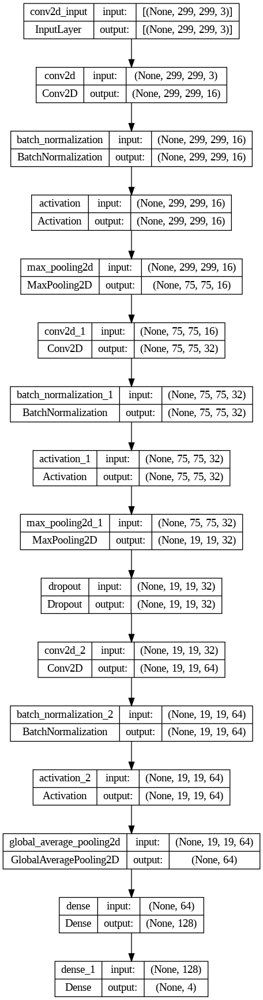

In [ ]:
K.clear_session()
model = Sequential()
# Convolution layer
model.add(Conv2D(filters=16,
                 kernel_size=(3,3), 
                 padding='same',
                 use_bias=False,
                 input_shape=(299,299,3)))
model.add(BatchNormalization(axis=3, scale=False))
model.add(Activation('relu'))
# Pooling layer
model.add(MaxPooling2D(pool_size=(4, 4),
                       strides=(4, 4),
                       padding='same'))
# Second convolution layer
model.add(Conv2D(filters=32,
                 kernel_size=(3,3), 
                 padding='same',
                 use_bias=False))
model.add(BatchNormalization(axis=3, scale=False))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(4, 4), strides=(4, 4), padding='same'))
model.add(Dropout(0.2))
# Third convolution layer
model.add(Conv2D(filters=64,
                 kernel_size=(3,3), 
                 padding='same',
                 use_bias=False))
model.add(BatchNormalization(axis=3, scale=False))
model.add(Activation('relu'))
model.add(GlobalAveragePooling2D())
# Fully connected layers
model.add(Dense(128, activation='relu'))
model.add(Dense(cat_number, activation='softmax'))
plot_model(model, to_file='CNN_model_plot.png', 
           show_shapes=True, show_layer_names=True)

In [ ]:
# Compile the CNN Model
model.compile(optimizer="adam",
              loss="sparse_categorical_crossentropy",
              metrics=["accuracy", f1_m])

In [ ]:

history = model.fit(
    train_datagen.flow(
        X_train, y_train,
        batch_size=16,
        subset='training'),
    validation_data=train_datagen.flow(
        X_train, y_train,
        batch_size=16,
        subset='validation'),
    steps_per_epoch=len(X_train) / 32,
    epochs=20,
    verbose=2)

Epoch 1/20
16/16 - 20s - loss: 1.1324 - accuracy: 0.4760 - f1_m: 1.4047 - val_loss: 1.3083 - val_accuracy: 0.3398 - val_f1_m: 3.5357 - 20s/epoch - 1s/step
Epoch 2/20
16/16 - 18s - loss: 0.9737 - accuracy: 0.5257 - f1_m: 1.3699 - val_loss: 1.1920 - val_accuracy: 0.5146 - val_f1_m: 3.4547 - 18s/epoch - 1s/step
Epoch 3/20
16/16 - 20s - loss: 0.9791 - accuracy: 0.5515 - f1_m: 1.4519 - val_loss: 1.1468 - val_accuracy: 0.3010 - val_f1_m: 3.5724 - 20s/epoch - 1s/step
Epoch 4/20
16/16 - 18s - loss: 0.9517 - accuracy: 0.5404 - f1_m: 1.3127 - val_loss: 1.1183 - val_accuracy: 0.3010 - val_f1_m: 3.8628 - 18s/epoch - 1s/step
Epoch 5/20
16/16 - 19s - loss: 0.9473 - accuracy: 0.5404 - f1_m: 1.3713 - val_loss: 1.1096 - val_accuracy: 0.3107 - val_f1_m: 3.5459 - 19s/epoch - 1s/step
Epoch 6/20
16/16 - 17s - loss: 0.9422 - accuracy: 0.5294 - f1_m: 1.2987 - val_loss: 1.0885 - val_accuracy: 0.3107 - val_f1_m: 3.7667 - 17s/epoch - 1s/step
Epoch 7/20
16/16 - 18s - loss: 0.8785 - accuracy: 0.5956 - f1_m: 1.331

In [ ]:
def plot_history_scores(dict_history, first_score, second_score):
    with plt.style.context('seaborn-whitegrid'):
        fig = plt.figure(figsize=(25,10))
        # summarize history for accuracy
        plt.subplot(1, 2, 1)
        plt.plot(dict_history.history[first_score], color="g")
        plt.plot(dict_history.history['val_' + first_score],
                 linestyle='--', color="orange")
        plt.title('CNN model ' + first_score, fontsize=18)
        plt.ylabel(first_score)
        plt.xlabel('epoch')
        plt.legend(['train', 'validation'], loc='upper left')
        # summarize history for loss
        plt.subplot(1, 2, 2)
        plt.plot(dict_history.history[second_score], color="g")
        plt.plot(dict_history.history['val_' + second_score],
                 linestyle='--', color="orange")
        plt.title('CNN model ' + second_score, fontsize=18)
        plt.ylabel(second_score)
        plt.xlabel('epoch')
        plt.legend(['train', 'validation'], loc='upper left')
        plt.show()

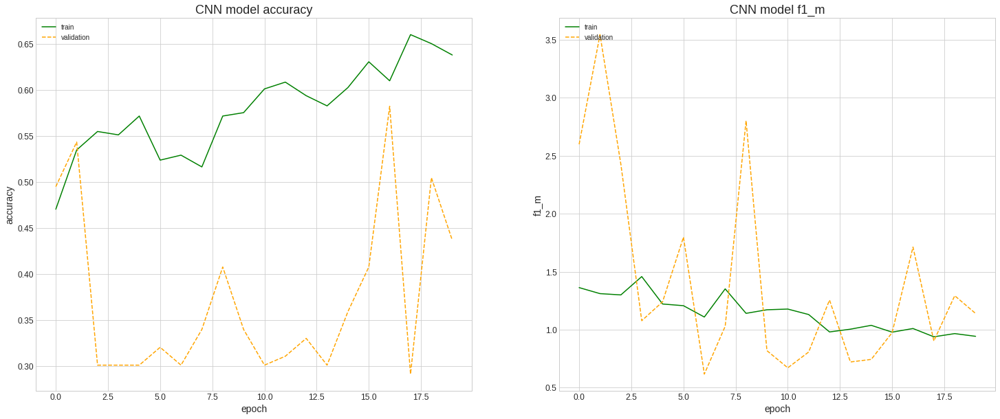

In [ ]:
plot_history_scores(
    dict_history = history, 
    first_score = "accuracy", 
    second_score = "f1_m")

# Transfert Learning 

## Xception

In [ ]:
K.clear_session()
# Import Xception trained model
xception_model = tf.keras.applications.xception.Xception(
    weights='imagenet',
    include_top=False, 
    pooling='avg',
    input_shape=(299,299,3))

# look at the differents layers
print("-" * 50)
print("Xception base model layers :")
print("-" * 50)
for layer in xception_model.layers:
    print(layer)



83683744/83683744 [==============================] - 2s 0us/step
--------------------------------------------------
Xception base model layers :
--------------------------------------------------


In [ ]:
for layer in xception_model.layers:
    layer.trainable = False

In [ ]:
# Add new fully-connected layers
base_output = xception_model.output
base_output = Dense(128, activation='relu')(base_output)
base_output = Dropout(0.2)(base_output)
# Output : new classifier
predictions = Dense(cat_number, activation='softmax')(base_output)

# Define new model
my_xcept_model = Model(inputs=xception_model.input,
                       outputs=predictions)
my_xcept_model.compile(optimizer="adam",
                       loss="sparse_categorical_crossentropy",
                       metrics=["accuracy", f1_m])

In [ ]:
Xception_plot = plot_model(my_xcept_model,
                           to_file='xcept_model_plot.png',
                           show_shapes=True,
                           show_layer_names=False)

In [ ]:
# and preprocess_input Xception
# Validation set is define here
train_datagen = ImageDataGenerator(
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest',
    validation_split=0.2,
    preprocessing_function=tf.keras.applications.xception.preprocess_input)

#For validation and test, just rescale
test_datagen = ImageDataGenerator(
    preprocessing_function=tf.keras.applications.xception.preprocess_input)

In [ ]:
history_xcept = my_xcept_model.fit(
    train_datagen.flow(
        X_train, y_train,
        batch_size=16,
        subset='training'),
    validation_data=train_datagen.flow(
        X_train, y_train,
        batch_size=16,
        subset='validation'),
    steps_per_epoch=len(X_train) / 32,
    epochs=20,
    verbose=2)

Epoch 1/20
16/16 - 197s - loss: 0.5686 - accuracy: 0.7500 - f1_m: 0.7875 - val_loss: 0.3009 - val_accuracy: 0.9223 - val_f1_m: 0.7925 - 197s/epoch - 12s/step
Epoch 2/20
16/16 - 150s - loss: 0.2881 - accuracy: 0.8934 - f1_m: 0.7310 - val_loss: 0.2215 - val_accuracy: 0.9223 - val_f1_m: 0.7360 - 150s/epoch - 9s/step
Epoch 3/20
16/16 - 189s - loss: 0.2256 - accuracy: 0.9336 - f1_m: 0.7131 - val_loss: 0.2452 - val_accuracy: 0.8932 - val_f1_m: 0.6812 - 189s/epoch - 12s/step
Epoch 4/20
16/16 - 149s - loss: 0.1882 - accuracy: 0.9446 - f1_m: 0.6897 - val_loss: 0.2482 - val_accuracy: 0.9223 - val_f1_m: 0.6952 - 149s/epoch - 9s/step
Epoch 5/20
16/16 - 192s - loss: 0.1257 - accuracy: 0.9594 - f1_m: 0.7198 - val_loss: 0.2737 - val_accuracy: 0.9223 - val_f1_m: 0.6561 - 192s/epoch - 12s/step
Epoch 6/20
16/16 - 190s - loss: 0.2098 - accuracy: 0.9225 - f1_m: 0.7311 - val_loss: 0.1823 - val_accuracy: 0.9223 - val_f1_m: 0.7188 - 190s/epoch - 12s/step
Epoch 7/20
16/16 - 152s - loss: 0.2115 - accuracy: 0.9

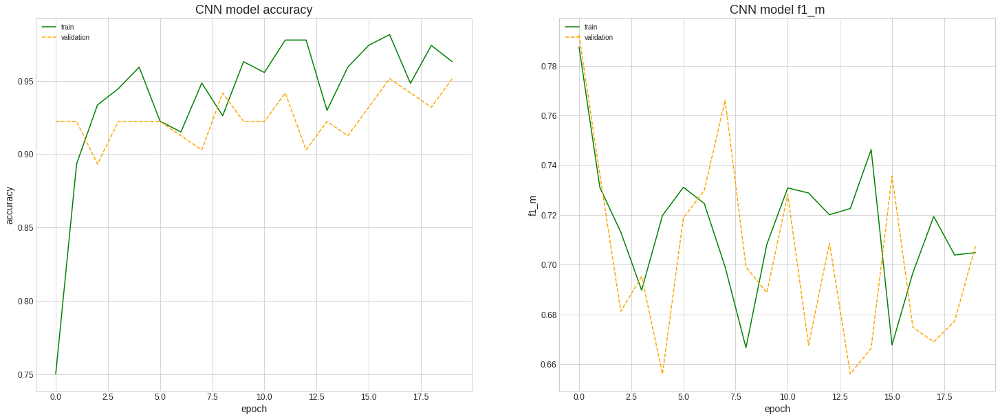

In [ ]:
plot_history_scores(
    dict_history = history_xcept, 
    first_score = "accuracy", 
    second_score = "f1_m")

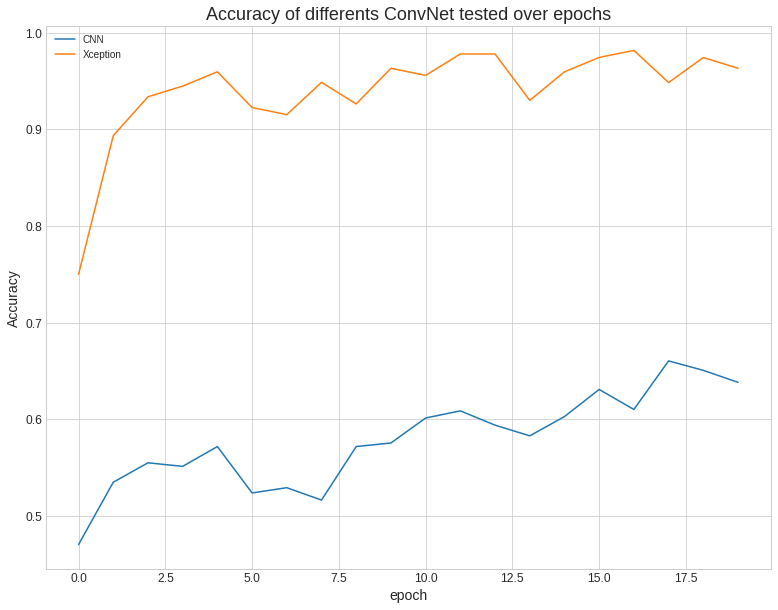

In [ ]:
with plt.style.context('seaborn-whitegrid'):
    plt.figure(figsize=(13,10))
    plt.plot(history.history['accuracy'],
             label='CNN')
    plt.plot(history_xcept.history['accuracy'],
             label='Xception')
    plt.title('Accuracy of differents ConvNet tested over epochs',
              fontsize=18)
    plt.ylabel('Accuracy')
    plt.xlabel('epoch')
    plt.legend(loc='upper left')
    plt.show()

In [ ]:
xcept_mean_accuracy = np.mean(history_xcept.history['val_accuracy'])
xcept_mean_f1 = np.mean(history_xcept.history['val_f1_m'])
print("-" * 50)
print("Xception base model validation Scores :")
print("-" * 50)
print("Mean validation accuracy: {:.2f}"\
      .format(xcept_mean_accuracy))
print("Mean validation F1 score: {:.2f}"\
      .format(xcept_mean_f1))



--------------------------------------------------
Xception base model validation Scores :
--------------------------------------------------
Mean validation accuracy: 0.92
Mean validation F1 score: 0.70


## ResNet50

In [ ]:
 K.clear_session()
# Import ResNet50 trained model
resnet_model = tf.keras.applications.ResNet50(
    weights='imagenet',
    include_top=False, 
    pooling='avg',
    input_shape=(299,299,3))

# Dont retrain layers
for rn_layer in resnet_model.layers:
    rn_layer.trainable = False
    
# Add new fully-connected layers
rn_base_output = resnet_model.output
rn_base_output = Dense(128, activation='relu')(rn_base_output)
rn_base_output = Dropout(0.2)(rn_base_output)
# Output : new classifier
rn_predictions = Dense(cat_number, activation='softmax')(rn_base_output)

# Define new model
my_resnet_model = Model(inputs=resnet_model.input,
                        outputs=rn_predictions)
my_resnet_model.compile(optimizer="adam",
                       loss="sparse_categorical_crossentropy",
                       metrics=["accuracy", f1_m])

# Data generator on train set with Data Augmentation
# and preprocess_input Resnet
# Validation set is define here
rn_train_datagen = ImageDataGenerator(
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest',
    validation_split=0.2,
    preprocessing_function=tf.keras.applications.resnet.preprocess_input)

#For validation and test, just rescale
rn_test_datagen = ImageDataGenerator(
    preprocessing_function=tf.keras.applications.resnet.preprocess_input)

In [ ]:
history_resnet = my_resnet_model.fit(rn_train_datagen.flow( X_train,
                                                           y_train,
                                                           batch_size=16,
                                                           subset='training'),
                                     validation_data=rn_train_datagen.flow(X_train,
                                                                           y_train,
                                                                           batch_size=16,
                                                                           subset='validation'),
                                     steps_per_epoch=len(X_train) / 32,
                                     epochs=20,
                                     verbose=2)

Epoch 1/20
16/16 - 142s - loss: 1.0737 - accuracy: 0.5461 - f1_m: 0.8485 - val_loss: 0.5461 - val_accuracy: 0.8058 - val_f1_m: 0.8621 - 142s/epoch - 9s/step
Epoch 2/20
16/16 - 136s - loss: 0.4667 - accuracy: 0.8044 - f1_m: 0.7824 - val_loss: 0.4767 - val_accuracy: 0.8058 - val_f1_m: 0.6673 - 136s/epoch - 8s/step
Epoch 3/20
16/16 - 133s - loss: 0.4084 - accuracy: 0.8303 - f1_m: 0.7423 - val_loss: 0.3952 - val_accuracy: 0.8447 - val_f1_m: 0.6646 - 133s/epoch - 8s/step
Epoch 4/20
16/16 - 134s - loss: 0.3134 - accuracy: 0.8750 - f1_m: 0.7199 - val_loss: 0.3046 - val_accuracy: 0.8641 - val_f1_m: 0.7814 - 134s/epoch - 8s/step
Epoch 5/20
16/16 - 140s - loss: 0.2535 - accuracy: 0.8930 - f1_m: 0.7311 - val_loss: 0.2981 - val_accuracy: 0.8738 - val_f1_m: 0.7423 - 140s/epoch - 9s/step
Epoch 6/20
16/16 - 130s - loss: 0.2886 - accuracy: 0.8893 - f1_m: 0.7200 - val_loss: 0.5171 - val_accuracy: 0.8058 - val_f1_m: 0.7409 - 130s/epoch - 8s/step
Epoch 7/20
16/16 - 138s - loss: 0.3167 - accuracy: 0.8672 

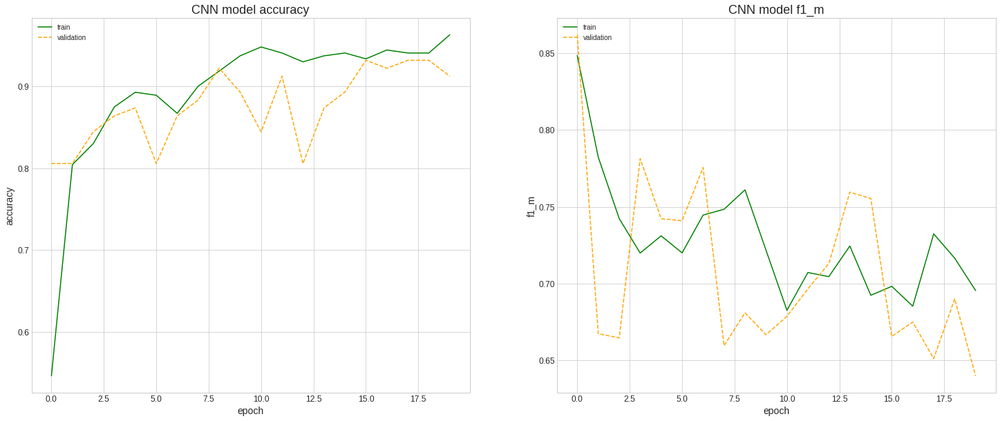

In [ ]:
plot_history_scores(
    dict_history = history_resnet, 
    first_score = "accuracy", 
    second_score = "f1_m")

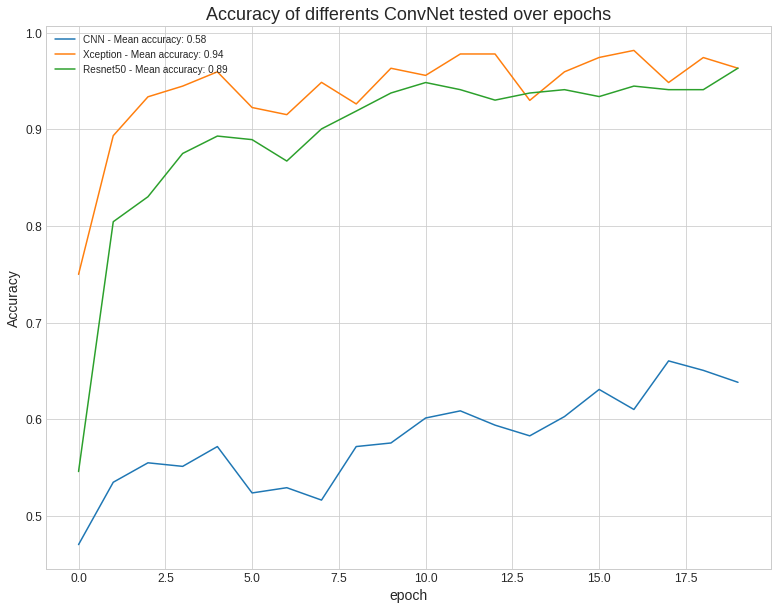

In [ ]:
with plt.style.context('seaborn-whitegrid'):
    plt.figure(figsize=(13,10))
    plt.plot(history.history['accuracy'],
             label='CNN - Mean accuracy: {:.2f}'.format(
                 np.mean(history.history['accuracy'])))
    plt.plot(history_xcept.history['accuracy'],
             label='Xception - Mean accuracy: {:.2f}'.format(
                 np.mean(history_xcept.history['accuracy'])))
    plt.plot(history_resnet.history['accuracy'],
             label='Resnet50 - Mean accuracy: {:.2f}'.format(
                 np.mean(history_resnet.history['accuracy'])))
    plt.title('Accuracy of differents ConvNet tested over epochs',
              fontsize=18)
    plt.ylabel('Accuracy')
    plt.xlabel('epoch')
    plt.legend(loc='upper left')
    plt.show()

## VGG

In [ ]:
from keras.applications import VGG16

# Load the pre-trained VGG16 model, excluding the fully connected layers
vgg = VGG16(weights='imagenet', include_top=False, input_shape=input_shape)


In [ ]:
for layer in vgg.layers:
    layer.trainable = False

In [ ]:
from keras.models import Model
from keras.layers import Flatten, Dense

# Add new fully connected layers
x = Flatten()(vgg.output)
x = Dense(256, activation='relu')(x)
x = Dense(128, activation='relu')(x)
predictions = Dense(2, activation='softmax')(x)

# Create a new model that includes both the pre-trained and new layers
model = Model(inputs=vgg.input, outputs=predictions)


In [ ]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
model.fit(X_train, y_train, epochs=10, batch_size=32, validation_data=(X_test, y_test))


Epoch 1/10
8/8 [==============================] - 9s 672ms/step - loss: 32.3661 - accuracy: 0.6128 - val_loss: 10.9889 - val_accuracy: 0.6863
Epoch 2/10
8/8 [==============================] - 2s 217ms/step - loss: 2.7356 - accuracy: 0.8894 - val_loss: 2.9113 - val_accuracy: 0.8725
Epoch 3/10
8/8 [==============================] - 2s 218ms/step - loss: 0.9883 - accuracy: 0.9745 - val_loss: 7.1188 - val_accuracy: 0.8627
Epoch 4/10
8/8 [==============================] - 2s 238ms/step - loss: 0.2150 - accuracy: 0.9915 - val_loss: 3.8053 - val_accuracy: 0.9020
Epoch 5/10
8/8 [==============================] - 2s 237ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 2.5939 - val_accuracy: 0.8922
Epoch 6/10
8/8 [==============================] - 2s 238ms/step - loss: 4.0582e-09 - accuracy: 1.0000 - val_loss: 2.3278 - val_accuracy: 0.9118
Epoch 7/10
8/8 [==============================] - 2s 240ms/step - loss: 8.3747e-07 - accuracy: 1.0000 - val_loss: 2.3393 - val_accuracy: 0.9118
Epoch 

In [ ]:
# Unfreeze the last two convolutional layers and the last fully connected layer
for layer in model.layers[-5:]:
    layer.trainable = True


In [ ]:
from keras.optimizers import SGD

# Use a lower learning rate for fine-tuning
sgd = SGD(lr=0.0001, momentum=0.9)

# Compile the model with the new optimizer
model.compile(optimizer=sgd, loss='categorical_crossentropy', metrics=['accuracy'])


/usr/local/lib/python3.9/dist-packages/keras/optimizers/optimizer_v2/gradient_descent.py:114: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


In [ ]:
model.fit(X_train, y_train, epochs=10, batch_size=32, validation_data=(X_test, y_test))

Epoch 1/10
8/8 [==============================] - 3s 260ms/step - loss: 2.3993e-07 - accuracy: 1.0000 - val_loss: 2.3734 - val_accuracy: 0.9020
Epoch 2/10
8/8 [==============================] - 2s 218ms/step - loss: 2.3943e-07 - accuracy: 1.0000 - val_loss: 2.3733 - val_accuracy: 0.9020
Epoch 3/10
8/8 [==============================] - 2s 236ms/step - loss: 2.3892e-07 - accuracy: 1.0000 - val_loss: 2.3733 - val_accuracy: 0.9020
Epoch 4/10
8/8 [==============================] - 2s 241ms/step - loss: 2.3841e-07 - accuracy: 1.0000 - val_loss: 2.3732 - val_accuracy: 0.9020
Epoch 5/10
8/8 [==============================] - 2s 238ms/step - loss: 2.3841e-07 - accuracy: 1.0000 - val_loss: 2.3731 - val_accuracy: 0.9020
Epoch 6/10
8/8 [==============================] - 2s 239ms/step - loss: 2.3791e-07 - accuracy: 1.0000 - val_loss: 2.3731 - val_accuracy: 0.9020
Epoch 7/10
8/8 [==============================] - 2s 220ms/step - loss: 2.3689e-07 - accuracy: 1.0000 - val_loss: 2.3730 - val_accuracy:

In [ ]:
model.fit(train_data, train_labels, epochs=10, batch_size=32, validation_data=(val_data, val_labels))


NameError: ignored

## Inception

In [ ]:
# Set the batch size
batch_size = 32

# Train set
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(150, 150),
    batch_size=batch_size,
    class_mode='binary',
    subset='training')

# Validation set
validation_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(150, 150),
    batch_size=batch_size,
    class_mode='binary',
    subset='validation')

# Test set
test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(150, 150),
    batch_size=batch_size,
    class_mode='binary')


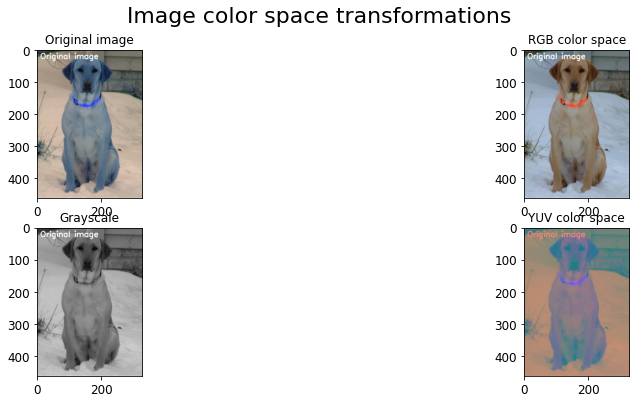

In [ ]:
# Convert the image to RGB color space
img_RGB = cv2.cvtColor(img_test, cv2.COLOR_BGR2RGB)

# Convert the image to grayscale
img_grayscale = cv2.cvtColor(img_test, cv2.COLOR_RGB2GRAY)

# Convert the image to YUV color space
img_YUV = cv2.cvtColor(img_test, cv2.COLOR_BGR2YUV)

# Display the original and transformed images using matplotlib
fig = plt.figure(figsize=(16,6))
plt.subplot(2, 2, 1)
plt.imshow(img_test)
plt.title("Original image")
plt.subplot(2, 2, 2)
plt.imshow(img_RGB)
plt.title("RGB color space")
plt.subplot(2, 2, 3)
plt.imshow(img_grayscale, cmap='gray')
plt.title("Grayscale")
plt.subplot(2, 2, 4)

plt.imshow(img_YUV)
plt.title("YUV color space")
plt.suptitle("Image color space transformations",
             color="black", 
             fontsize=22, y=.98)
plt.show()

In [ ]:
#masking function
def create_mbask_for_image(image):
    image_hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    lower_hsv = np.array([0,0,250])
    upper_hsv = np.array([250,255,255])
    
    mask = cv2.inRange(image_hsv, lower_hsv, upper_hsv)
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (11,11))
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)
    return mask

#image  draw function
def  deskew_image(image):
    mask = create_mask_for_image(image)
    output = cv2.bitwise_and(image, image, mask = mask)
    return output/255

#image  gray  function
def  gray_image(image):
    mask = create_mask_for_image(image)
    output = cv2.cvtColor(image,  cv2.COLOR_BGR2GRAY)
    return output/255

#image  thresh  function
def  thresh_image(image):
    img = read_img(os.path.join(image_path, image),(255,255))
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    output = cv2.threshold(gray,0,255,cv2.THRESH_BINARY_INV) #+cv.THRESH_OTSU)
    return output


#image  rnoise  function
def  rnoise_image(image):
    mask = create_mask_for_image(image)
    output = cv2.bitwise_and(image, image, mask = mask)
    return output/255

#image  dilate  function
def  dilate_image(image):
    mask = create_mask_for_image(image)
    output = cv2.bitwise_and(image, image, mask = mask)
    return output/255


#image  erode  function
def  erode_image(image):
    mask = create_mask_for_image(image)
    output = cv2.bitwise_and(image, image, mask = mask)
    return output/255


#image  opening  function
def  opening_image(image):
    mask = create_mask_for_image(image)
    output = cv2.bitwise_and(image, image, mask = mask)
    return output/255

#image canny function
def  canny_image(image):
    mask = create_mask_for_image(image)
    output = cv2.bitwise_and(image, image, mask = mask)
    return output/255


#image segmentation function
def segment_image(image):
    mask = create_mask_for_image(image)
    output = cv2.bitwise_and(image, image, mask = mask)
    return output/255


#sharpen the image
def sharpen_image(image):
    image_blurred = cv2.GaussianBlur(image, (0, 0), 3)
    image_sharp = cv2.addWeighted(image, 1.5, image_blurred, -0.5, 0)
    return image_sharp



# function to get an image
def read_img(filepath, size):
    img = image.load_img(os.path.join(image_path, filepath), target_size=size)
    #convert image to array
    img = image.img_to_array(img)
    return img


In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from kerastuner.tuners import RandomSearch

# Define the hypermodel
def build_model(hp):
    model = keras.Sequential()
    
    # Tune the number of filters in the first convolutional layer
    hp_filters = hp.Int('filters', min_value=32, max_value=128, step=32)
    model.add(layers.Conv2D(filters=hp_filters, kernel_size=3, activation='relu', input_shape=(28, 28, 1)))
    model.add(layers.MaxPooling2D(pool_size=(2, 2)))
    
    # Tune the number of filters in the second convolutional layer
    hp_filters = hp.Int('filters', min_value=32, max_value=128, step=32)
    model.add(layers.Conv2D(filters=hp_filters, kernel_size=3, activation='relu'))
    model.add(layers.MaxPooling2D(pool_size=(2, 2)))
    
    model.add(layers.Flatten())
    
    # Tune the number of units in the dense layer
    hp_units = hp.Int('units', min_value=32, max_value=512, step=32)
    model.add(layers.Dense(units=hp_units, activation='relu'))
    
    model.add(layers.Dense(10, activation='softmax'))
    
    # Tune the learning rate for the optimizer
    hp_learning_rate = hp.Choice('learning_rate', values=[1e-2, 1e-3, 1e-4])
    
    model.compile(optimizer=keras.optimizers.Adam(learning_rate=hp_learning_rate),
                  loss='categorical_crossentropy', metrics=['accuracy'])
    
    return model

# Load the dataset
(x_train, y_train), (x_test, y

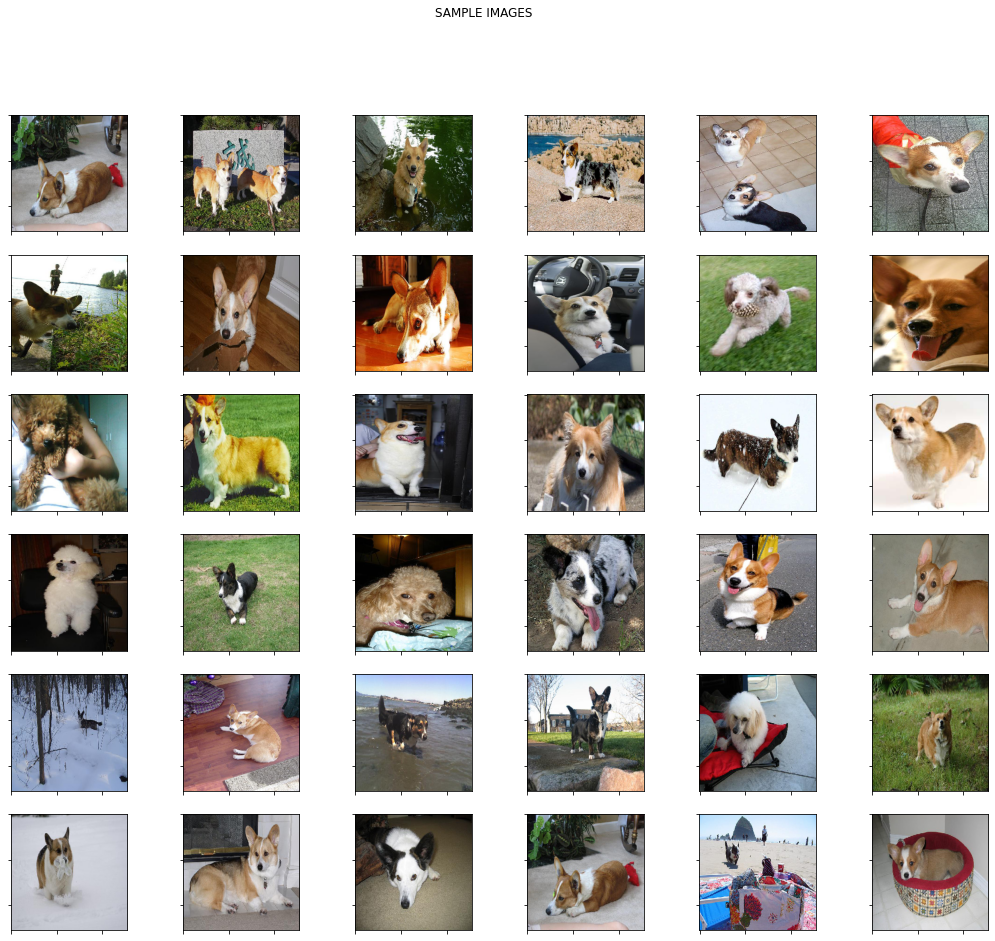

In [ ]:
nb_rows = 6
nb_cols = 6
fig, axs = plt.subplots(nb_rows, nb_cols, figsize=(18, 15));
plt.suptitle('SAMPLE IMAGES');
for i in range(0, nb_rows):
    for j in range(0, nb_cols):
        axs[i, j].xaxis.set_ticklabels([])
        axs[i, j].yaxis.set_ticklabels([])
        axs[i, j].imshow((read_img(dog_df['file'][np.random.randint(400)], (255,255)))/255.)
plt.show()

In [ ]:
#get an image
img = read_img(dog_df['file'][10],(255,255))

#mask
image_mask = create_mask_for_image(img)

fig, ax = plt.subplots(1, 2, figsize=(5, 5));
plt.suptitle('RESULT', x=0.5, y=0.8)
plt.tight_layout()

ax[0].set_title('ORIGINAL', fontsize=12)
ax[1].set_title('MASK', fontsize=12)

ax[0].imshow(img/255);
ax[1].imshow(image_mask);

NameError: ignored

In [ ]:
#get an image
img = read_img(dog_df['file'][19],(255,255))
#draw
image_deskew = deskew_image(img)

fig, ax = plt.subplots(1, 2, figsize=(5, 5));
plt.suptitle('RESULT', x=0.5, y=0.8)
plt.tight_layout()

ax[0].set_title('ORIGINAL', fontsize=12)
ax[1].set_title('DESKEW', fontsize=12)

ax[0].imshow(img/255);
ax[1].imshow(image_deskew);



In [ ]:
#get an image
img = read_img(dog_df['file'][102],(255,255))

#gray
image_gray = gray_image(img)

fig, ax = plt.subplots(1, 2, figsize=(5, 5))
plt.suptitle('RESULT', x=0.5, y=0.8)
plt.tight_layout()

ax[0].set_title('ORIGINAL', fontsize=12)
ax[1].set_title('GRAY', fontsize=12)

ax[0].imshow(img/255)
ax[1].imshow(image_gray)

In [ ]:
#get an image
img = read_img(dog_df['file'][229],(255,255))
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
ret, thresh = cv2.threshold(gray,0,255,cv2.THRESH_BINARY_INV) #+cv.THRESH_OTSU)
fig, ax = plt.subplots(1, 2, figsize=(5, 5));
plt.suptitle('RESULT', x=0.5, y=0.8)
plt.tight_layout()

ax[0].set_title('ORIGINAL', fontsize=12)
ax[1].set_title('THRESH', fontsize=12)

ax[0].imshow(img/255)
ax[1].imshow(thresh)

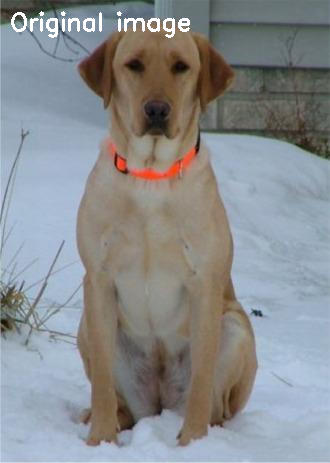

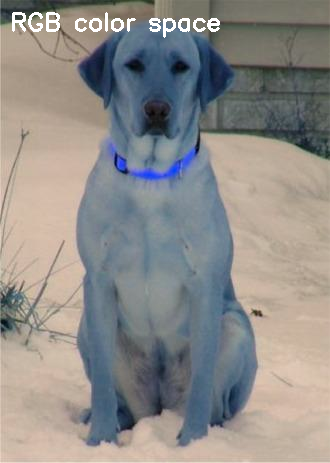

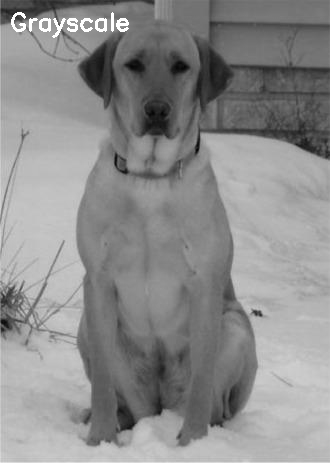

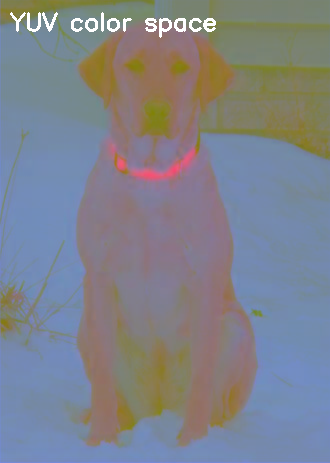

In [ ]:
from google.colab.patches import cv2_imshow

# Convert the image to RGB color space
img_RGB = cv2.cvtColor(img_test, cv2.COLOR_BGR2RGB)

# Convert the image to grayscale
img_grayscale = cv2.cvtColor(img_test, cv2.COLOR_RGB2GRAY)

# Convert the image to YUV color space
img_YUV = cv2.cvtColor(img_test, cv2.COLOR_BGR2YUV)

# Add image titles using cv2.putText
cv2.putText(img_test, "Original image", (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 255, 255), 2)
cv2_imshow(img_test)

cv2.putText(img_RGB, "RGB color space", (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 255, 255), 2)
cv2_imshow(img_RGB)

cv2.putText(img_grayscale, "Grayscale", (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 255, 255), 2)
cv2_imshow(img_grayscale)

cv2.putText(img_YUV, "YUV color space", (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 255, 255), 2)
cv2_imshow(img_YUV)

In [ ]:
#get an image
img = read_img(dog_df['file'][60],(255,255))

#mask
image_mask = create_mask_for_image(img)

#segmentation
image_segmented = segment_image(img)


#deskew
image_deskew = deskew_image(img)

#gray
image_gray = gray_image(img)

#thresh
image_thresh = thresh_image(img)

#rnoise
image_rnoise = rnoise_image(img)

#canny
image_canny = canny_image(img)

#sharpen the image
image_sharpen = sharpen_image(img)

fig, ax = plt.subplots(1, 9, figsize=(15, 6));
plt.suptitle('RESULT', x=0.5, y=0.8)
plt.tight_layout(1)

ax[0].set_title('ORIGINAL', fontsize=9)
ax[1].set_title('MASK', fontsize=9)
ax[2].set_title('SEGMENTED', fontsize=9)
ax[3].set_title('DESKEW', fontsize=9)
ax[4].set_title('GRAY', fontsize=9)
ax[5].set_title('THREST', fontsize=9)
ax[6].set_title('RNOISE', fontsize=9)
ax[7].set_title('CANNY', fontsize=9)
ax[8].set_title('SHARPEN', fontsize=9)

ax[0].imshow(img/255)
ax[1].imshow(image_mask)
ax[2].imshow(image_segmented)
ax[3].imshow(image_deskew)
ax[4].imshow(image_gray )
ax[5].imshow(thresh)
ax[6].imshow(image_rnoise)
ax[7].imshow(image_canny)
ax[8].imshow(image_sharpen)

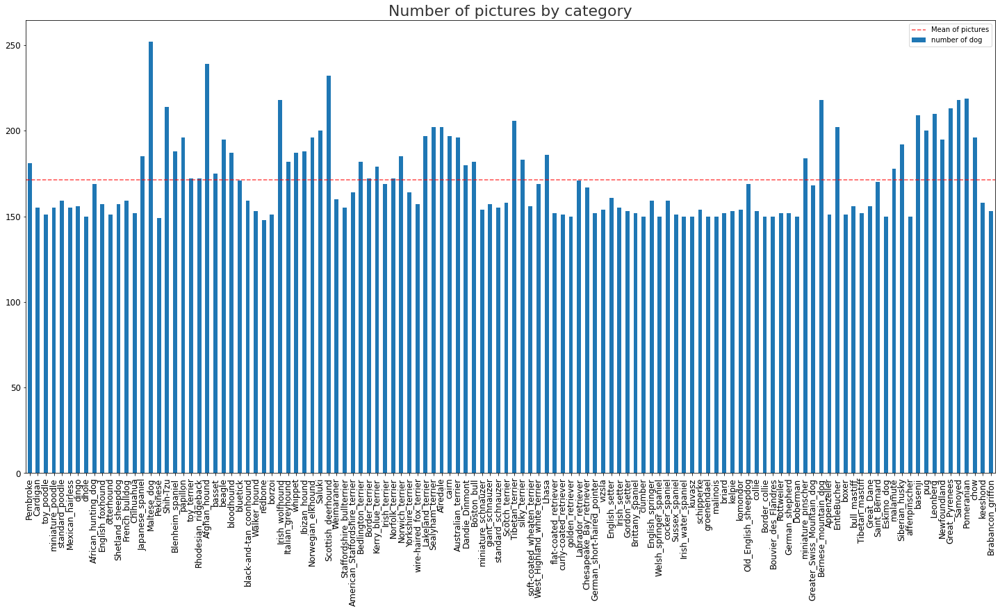

In [ ]:
# Count number of pictures for each breed
dog_df = pd.DataFrame(
    index=[dogs.split('-',1)[1]
           for dogs in dog_cat],
    data=[len(os.listdir(image_path + "/" + name))
          for name in dog_cat],
    columns=["number of dog"])

# Plot results
fig, ax = plt.subplots(1, 1, figsize=(25,12))
dog_df.plot(kind="bar",
               legend=False,
               ax=ax)
ax.axhline(dog_df["number of dog"].mean(),
           color='r', alpha=.7,
           linestyle='--',
           label="Mean of pictures")
plt.title("Number of pictures by category",
          color="#343434", fontsize=22)
plt.legend()
plt.show()

In [ ]:

dog_df.sort_values(by="number of dog", ascending=False)

,number of dog
Maltese_dog,252
Afghan_hound,239
Scottish_deerhound,232
Pomeranian,219
Bernese_mountain_dog,218
...,...
Eskimo_dog,150
clumber,150
Welsh_springer_spaniel,150
Pekinese,149


In [ ]:
len(classes)

117

In [ ]:
width, height = 224, 224
INIT_LR = 1e-5
EPOCHS =  50
BS = 8

In [ ]:
train = ImageDataGenerator(
rescale = 1/255,
horizontal_flip=True,
vertical_flip=True,
shear_range=0.2,
zoom_range=0.2,
featurewise_center=True, # Set input mean to 0 over the dataset, feature-wise
featurewise_std_normalization=True, # Divide inputs by std of the dataset, feature-wise
rotation_range=40, # Degree range for random rotations
width_shift_range=0.2,
height_shift_range=0.2,
fill_mode='nearest',
validation_split = 0.2)

In [ ]:

VM_ROOT_DIR = '/content'
PROJECT_ROOT_DIR = '/content/drive/MyDrive/Formations/Openclassrooms/Projet 6'
DATA_PATH = os.path.join(VM_ROOT_DIR, "data")
os.makedirs(DATA_PATH, exist_ok=True)

url = 'http://vision.stanford.edu/aditya86/ImageNetDogs/images.tar'
if url.find('/'):
  fname = url.rsplit('/', 1)[1]

r = requests.get(url, allow_redirects=True)
open(fname, 'wb').write(r.content)
print("...Archive downloaded...")


src = os.path.join(VM_ROOT_DIR, fname)
dest = os.path.join(DATA_PATH, fname)
shutil.move(src, dest)

with tarfile.open(dest, 'r') as f:
  f.extractall(DATA_PATH)

print("...Archive extracted...")


In [ ]:

IMAGES_PATH = os.path.join(DATA_PATH, "Images")

TRAIN_PATH = os.path.join(DATA_PATH, "train")
os.makedirs(TRAIN_PATH, exist_ok=True)

VAL_PATH = os.path.join(DATA_PATH, "val")
os.makedirs(VAL_PATH, exist_ok=True)

TEST_PATH = os.path.join(DATA_PATH, "test")
os.makedirs(TEST_PATH, exist_ok=True)

val_threshold = 0.75
test_threshold = val_threshold + 0.15

train_size = 0
val_size = 0
test_size = 0
num_classes = 0

for breed_dir in os.listdir(IMAGES_PATH):
  num_classes += 1
  breed_dir_path = os.path.join(IMAGES_PATH, breed_dir)
  breed_train_path = os.path.join(TRAIN_PATH, breed_dir)
  breed_val_path = os.path.join(VAL_PATH, breed_dir)
  breed_test_path = os.path.join(TEST_PATH, breed_dir)
  os.makedirs(breed_train_path, exist_ok=True)
  os.makedirs(breed_val_path, exist_ok=True)
  os.makedirs(breed_test_path, exist_ok=True)
  breed_list = os.listdir(breed_dir_path)
  breed_size = len(breed_list)
  breed_val_threshold = math.ceil(breed_size *  val_threshold)
  breed_test_threshold = math.ceil(breed_size * test_threshold)
  breed_train_range = breed_list[:breed_val_threshold]
  breed_val_range = breed_list[breed_val_threshold:breed_test_threshold]
  breed_test_range = breed_list[breed_test_threshold:breed_size]

  try:
    assert len(breed_train_range) + len(breed_val_range) + len(breed_test_range) == breed_size
  except AssertionError :
    print("Toutes les photos de la race ne sont pas prise en compte")
    print(f"Pour la race {breed_dir}")
    break

  for i, image in enumerate(breed_train_range):
    src = os.path.join(breed_dir_path, image)
    dest = os.path.join(breed_train_path, image)
    shutil.copyfile(src, dest)
    train_size += 1

  for _, image in enumerate(breed_val_range):
    src = os.path.join(breed_dir_path, image)
    dest = os.path.join(breed_val_path, image)
    shutil.copyfile(src, dest)
    val_size +=1

  for _, image in enumerate(breed_test_range):
    src = os.path.join(breed_dir_path, image)
    dest = os.path.join(breed_test_path, image)
    shutil.copyfile(src, dest)
    test_size +=1
  
print("... Data split done ...")
print(f"Nombre de classes: {num_classes}")
print(f"train set size: {train_size}")
print(f"val set size: {val_size}")
print(f"test set size: {test_size}")

In [ ]:
!virtualenv /content/drive/MyDrive/colab_env

In [ ]:
import yfinance

In [ ]:
import pypdf

In [ ]:
!pip install pypdf

In [ ]:
!source /content/drive/MyDrive/colab_env/bin/activate

In [ ]:
!source /content/drive/MyDrive/colab_env/bin/activate; pip install yfinance